## **SETTING UP**



# Installation

In [ ]:
!pip install pandas numpy matplotlib PyPortfolioOpt --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 222.1/222.1 kB 9.7 MB/s eta 0:00:00


In [ ]:
!pip install hmmlearn --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.0/166.0 kB 3.3 MB/s eta 0:00:00


In [ ]:
!pip install statsmodels --quiet

In [ ]:


# Stdlib
import os
import base64
from io import BytesIO
from fractions import Fraction
import warnings, logging

# Core libs
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import timedelta

# Notebook/Colab helpers
from IPython.display import display, HTML
from google.colab import files

# Math/ML
from numpy.linalg import inv
from hmmlearn.hmm import GaussianHMM
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    mean_squared_error,
    confusion_matrix,
    ConfusionMatrixDisplay,
    classification_report,
)

# Portfolio optimization
from pypfopt import risk_models, EfficientFrontier, objective_functions

# Quiet noisy logs/warnings
logging.getLogger("hmmlearn").setLevel(logging.ERROR)
warnings.filterwarnings("ignore", category=RuntimeWarning)


from scipy.optimize import minimize
import matplotlib.dates as mdates

# Files Upload

In [ ]:
# Optional: clear any old data files first
for f in os.listdir():
    if f.endswith((".csv", ".xlsx", ".xls")):
        os.remove(f)

# Upload fresh files
uploaded = files.upload()          # pick the four files in the dialog

# Read each file with the right function
dfs = {}
for name in uploaded:
    if name.lower().endswith(".csv"):
        df = pd.read_csv(name)
    elif name.lower().endswith((".xlsx", ".xls")):
        df = pd.read_excel(name, engine="openpyxl")  # engine optional
    else:
        print(f"⚠️  Skipping unknown file type: {name}")
        continue

    dfs[name] = df
    print(f"{name} loaded with shape {df.shape}")

Saving VIX Data.csv to VIX Data.csv
Saving United States 3-Month Bond Yield.xlsx to United States 3-Month Bond Yield.xlsx
Saving MOVE Data.csv to MOVE Data.csv
Saving ETFs Price.xlsx to ETFs Price.xlsx
VIX Data.csv loaded with shape (1331, 7)
United States 3-Month Bond Yield.xlsx loaded with shape (1070, 9)
MOVE Data.csv loaded with shape (1180, 7)
ETFs Price.xlsx loaded with shape (810, 10)


# ETFs Price Data

In [ ]:
# reload the correct sheet only
dfs["ETFs Price.xlsx"] = pd.read_excel(
    "ETFs Price.xlsx",
    sheet_name="Price",
)

# Drop the first rows
prices = dfs["ETFs Price.xlsx"].copy().iloc[1:].reset_index(drop=True)

# Original first column is the date string; rename it for clarity
prices = prices.rename(columns={"Unnamed: 0": "Date"})

# Convert the Date column to datetime and set as index
prices["Date"] = pd.to_datetime(prices["Date"])
prices = prices.set_index("Date")

# All values are strings right now; convert to numeric
prices = prices.apply(pd.to_numeric, errors="coerce")

# Ensure Friday:
weekly_prices = prices.resample("W-FRI").last().ffill()

display(weekly_prices)

,AGZ.P,IEI.O,SHY.O,IEF.O,MUB,MBB.O,TLT.O,VCIT.O,AGG
Date,,,,,,,,,
2010-01-01,107.5700,110.16,82.9600,88.60,102.7500,105.98,89.89,74.89,103.1900
2010-01-08,108.0100,110.56,83.2398,88.96,102.9975,106.55,89.29,75.82,103.6600
2010-01-15,108.2700,111.36,83.4300,90.05,103.3000,107.07,91.08,76.21,104.2655
2010-01-22,108.7199,111.83,83.5900,90.61,103.2200,107.28,92.00,76.41,104.4600
2010-01-29,108.6800,112.04,83.6200,90.70,103.1400,107.46,92.31,75.96,104.6500
...,...,...,...,...,...,...,...,...,...
2025-05-30,109.1100,118.19,82.6500,94.57,103.8500,92.65,86.28,81.72,98.1000
2025-06-06,108.4320,117.11,82.2100,93.51,103.2000,91.75,85.35,81.03,97.2800
2025-06-13,108.8544,117.76,82.4100,94.29,103.8800,92.54,86.33,81.56,97.9600


# Data

In [ ]:
# Get tickers
tickers = list(prices.columns)
index_ticker   = ["AGG"] if "AGG" in tickers else []
portfolio_tickers = [t for t in tickers if t != "AGG"]

display(tickers)

['AGZ.P', 'IEI.O', 'SHY.O', 'IEF.O', 'MUB', 'MBB.O', 'TLT.O', 'VCIT.O', 'AGG']

In [ ]:
sectors = {
    "AGZ.P": "Agency",
    "SHY.O": "Treasury",
    "IEI.O": "Treasury",
    "IEF.O": "Treasury",
    "TLT.O": "Treasury",
    "MUB": "Local Authority",
    "VCIT.O": "Corporate",
    "MBB.O": "MBS Pass-Through",
    "AGG": "Core Bond"
}

holdings = {
    "AGZ.P": "137",
    "SHY.O": "125",
    "IEI.O": "110",
    "IEF.O": "14",
    "TLT.O": "42",
    "MUB": "5751",
    "VCIT.O": "2187",
    "MBB.O": "11372",
    "AGG": "12690"
}

sector_colors = {
    "Agency": "#4C72B0",
    "Treasury": "#55A868",
    "Local Authority": "#C44E52",
    "Corporate": "#8172B2",
    "MBS Pass-Through": "#CCB974"
}

# ..............................

## **ROLLING BL 2020 WITH HISTORICAL**

# Equilibrium Portfolio as 2019

In [ ]:
# reload the correct sheet only
dfs["ETFs Price.xlsx"] = pd.read_excel(
    "ETFs Price.xlsx",
    sheet_name="Net Assets",
)

# Drop the first rows
net_assets = dfs["ETFs Price.xlsx"].copy().iloc[1:].reset_index(drop=True)

# Original first column is the date string; rename it for clarity
net_assets = net_assets.rename(columns={"Unnamed: 0": "Date"})

# Convert the Date column to datetime and set as index
net_assets["Date"] = pd.to_datetime(net_assets["Date"])
net_assets = net_assets.set_index("Date")

# All values are strings right now; convert to numeric
net_assets =net_assets.apply(pd.to_numeric, errors="coerce")

display(net_assets)

,AGZ.P,IEI.O,SHY.O,IEF.O,MUB,MBB.O,TLT.O,VCIT.O,AGG
Date,,,,,,,,,
2010-01-01,257.8999,869.2000,7667.098,2553.4,1610.00,1758.90,2347.70,37.20,11234.0
2010-01-08,257.8999,869.2000,7667.098,2553.4,1610.00,1758.90,2347.70,37.20,11234.0
2010-01-15,257.8999,869.2000,7667.098,2553.4,1610.00,1758.90,2347.70,37.20,11234.0
2010-01-22,257.8999,869.2000,7667.098,2553.4,1610.00,1758.90,2347.70,37.20,11234.0
2010-01-29,260.3999,862.0999,7430.500,2646.0,1636.40,1795.20,2241.60,68.00,11341.2
...,...,...,...,...,...,...,...,...,...
2025-05-30,611.2107,15592.9600,24257.050,34938.2,38772.45,38227.93,50897.13,53150.84,124325.6
2025-06-06,611.2107,15592.9600,24257.050,34938.2,38772.45,38227.93,50897.13,53150.84,124325.6
2025-06-13,611.2107,15592.9600,24257.050,34938.2,38772.45,38227.93,50897.13,53150.84,124325.6


,Net Assets ($B),Weight (%)
AGZ.P,0.586590,0.467768
IEI.O,9.824277,7.834221
MUB,15.033980,11.988620
TLT.O,17.532320,13.980884
SHY.O,17.574590,14.014591
IEF.O,19.275480,15.370940
MBB.O,20.137690,16.058497
VCIT.O,25.437160,20.284479



📦 Total Net Assets of Portfolio: $125.40B
📦 Total Net Assets of Benchmark: $67.16B



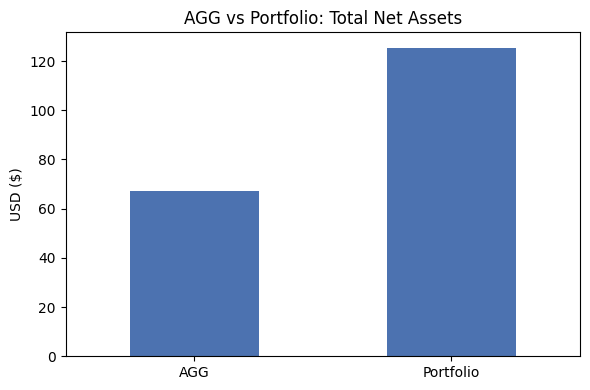

In [ ]:
# Net assets 2020
net_assets_2019 = net_assets.loc[: "2019-12-31"]

# Get the final asset data and convert to billions
latest_assets = net_assets_2019.iloc[-1].dropna() / 1000

# Separate benchmark figure
agg_assets = latest_assets.get("AGG", np.nan)
portfolio_assets = latest_assets.drop("AGG", errors="ignore")

# Create DataFrame and Compute Weights
assets_df = portfolio_assets.to_frame(name="Net Assets ($B)")
assets_df["Weight"] = assets_df["Net Assets ($B)"] / assets_df["Net Assets ($B)"].sum()
assets_df["Weight (%)"] = assets_df["Weight"] * 100
assets_df["Sector"] = assets_df.index.map(sectors)
assets_df["Color"] = assets_df["Sector"].map(sector_colors).fillna("#999999")  # fallback to grey

# Sort for Display
assets_df = assets_df.sort_values("Weight (%)")

display(assets_df[["Net Assets ($B)","Weight (%)"]])
print()

# Compare with portfolio
portfolio_total = assets_df["Net Assets ($B)"].sum()
print(f"📦 Total Net Assets of Portfolio: ${portfolio_total:.2f}B")
print(f"📦 Total Net Assets of Benchmark: ${agg_assets:.2f}B")
print()

# Visual comparison
comparison_df = pd.DataFrame({
    "AGG": [agg_assets],
    "Portfolio": [portfolio_total]
}, index=["Net Assets"])

comparison_df.T.plot.bar(
    legend=False,
    figsize=(6, 4),
    color=["#4C72B0", "#55A868"]
)

plt.title("AGG vs Portfolio: Total Net Assets")
plt.ylabel("USD ($)")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

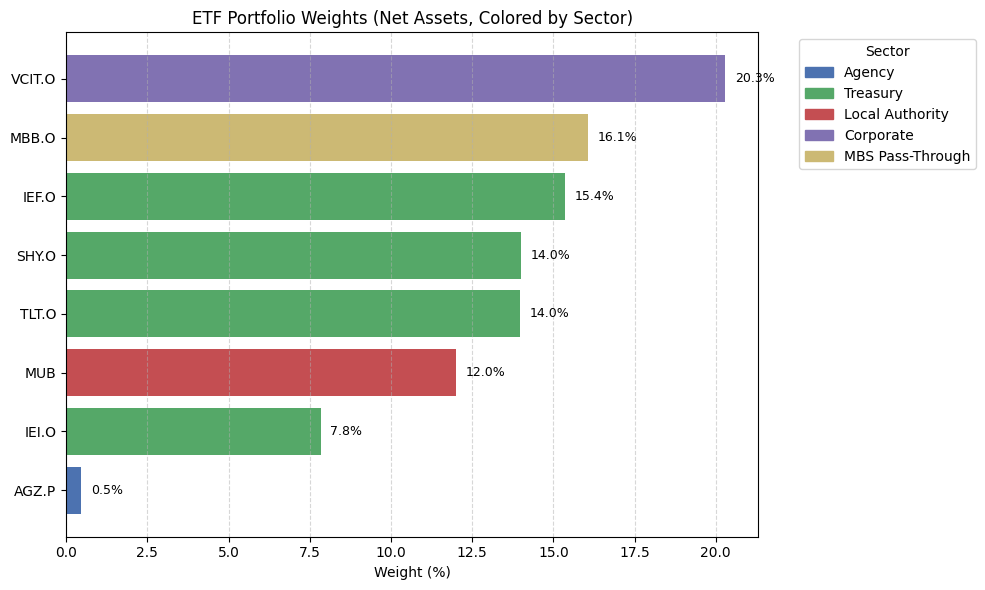

In [ ]:
# Plot Horizontal Bar Chart
plt.figure(figsize=(10, 6))
bars = plt.barh(
    assets_df.index,
    assets_df["Weight (%)"],
    color=assets_df["Color"]
)

for bar in bars:
    width = bar.get_width()
    plt.text(width + 0.3, bar.get_y() + bar.get_height() / 2,
             f"{width:.1f}%", va="center", fontsize=9)

plt.xlabel("Weight (%)")
plt.title("ETF Portfolio Weights (Net Assets, Colored by Sector)")
plt.grid(axis="x", linestyle="--", alpha=0.5)

# Add sector legend
handles = [
    plt.Rectangle((0,0),1,1, color=color)
    for sector, color in sector_colors.items()
]
labels = list(sector_colors.keys())
plt.legend(handles, labels, title="Sector", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


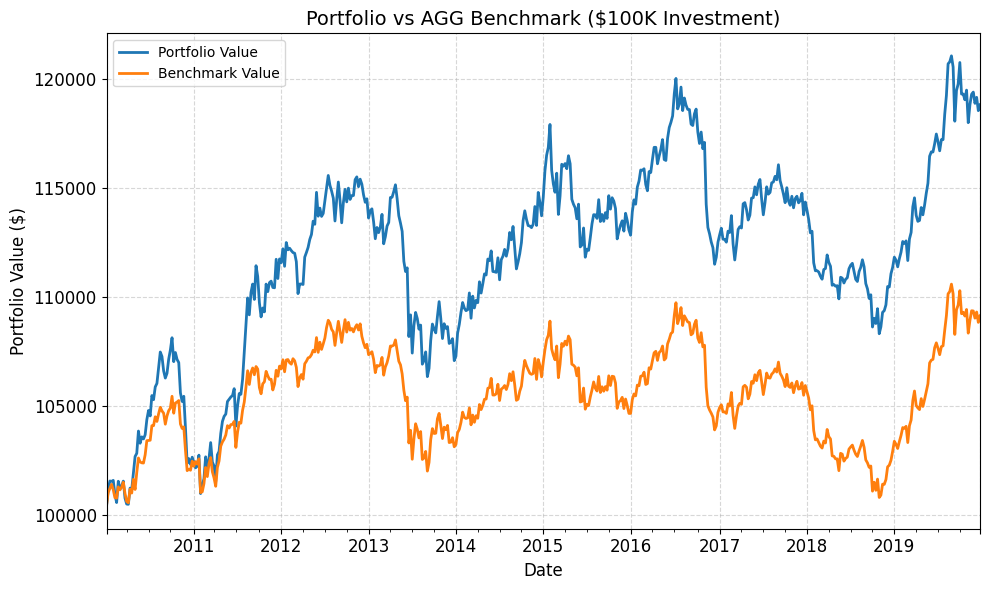

In [ ]:
# Compute portfolio returns using weights
weights = assets_df["Weight"]
portfolio_tickers = weights.index.tolist()  # ensure correct order

# Align returns
weekly_returns = weekly_prices.pct_change().dropna()
returns_10_19 = weekly_returns.loc["2010-01-01":"2019-12-31"]
returns_10_19 = returns_10_19[portfolio_tickers + ["AGG"]]
portfolio_returns_10_19 = (returns_10_19[portfolio_tickers] * weights).sum(axis=1)

#  3. Simulate Cumulative Growth of $100,000 Investment
initial_investment = 100000
portfolio_cum = (1 + portfolio_returns_10_19).cumprod() * initial_investment
agg_cum = (1 + returns_10_19["AGG"]).cumprod() * initial_investment

# Combine and Plot
performance_df = pd.DataFrame({
    "Portfolio Simple Return": portfolio_returns_10_19,
    "Benchmark Simple Return": returns_10_19["AGG"],
    "Portfolio Cum Return": (1 + portfolio_returns_10_19).cumprod(),
    "Benchmark Cum Return": (1 + returns_10_19["AGG"]).cumprod(),
    "Portfolio Value": portfolio_cum,
    "Benchmark Value" : agg_cum
})

plt.figure(figsize=(10, 6))
ax = plt.gca()
performance_df[["Portfolio Value", "Benchmark Value"]].plot(ax=plt.gca(), linewidth=2)
plt.title("Portfolio vs AGG Benchmark ($100K Investment)", fontsize=14)
plt.ylabel("Portfolio Value ($)", fontsize=12)
plt.xlabel("Date", fontsize=12)
ax.tick_params(axis="both", which="major", labelsize=12)
plt.grid(True, linestyle="--", alpha=0.5)
plt.legend()
plt.tight_layout()
plt.show()






# Optimal Rolling Window

In [ ]:
# Calculate simple returns
portfolio_tickers = sorted(portfolio_tickers)
weekly_returns = weekly_returns[sorted(weekly_returns.columns)]
rets = weekly_returns[portfolio_tickers]

# Keep only the 2010-01-01 … 2019-12-31 window
rets_2010_2019 = rets.loc["2010-01-01":"2019-12-31"]
rets_2020_2025 = rets.loc["2020-01-01":"2025-06-30"]

# Name the index and columns
rets_2010_2019.index.name  = "Date"
rets_2010_2019.columns.name = "Asset"
rets_2020_2025.index.name  = "Date"
rets_2020_2025.columns.name = "Asset"

# Display return matrix
display(rets_2020_2025)

Asset,AGZ.P,IEF.O,IEI.O,MBB.O,MUB,SHY.O,TLT.O,VCIT.O
Date,,,,,,,,
2020-01-03,0.003372,0.007047,0.004052,0.001202,0.003860,0.001536,0.013108,0.003392
2020-01-10,-0.000183,-0.001974,-0.001345,0.001016,0.002972,-0.000472,-0.004888,0.000654
2020-01-17,-0.000162,0.000449,0.000713,0.000369,0.001394,0.000826,-0.003034,0.001635
2020-01-24,0.006034,0.010243,0.005464,0.001937,0.004351,0.001180,0.029416,0.006963
2020-01-31,0.006512,0.014230,0.008505,0.002025,0.003292,0.002946,0.026886,0.008427
...,...,...,...,...,...,...,...,...
2025-05-30,0.002573,0.008532,0.005359,0.009039,0.000964,0.001940,0.020461,0.009886
2025-06-06,-0.006214,-0.011209,-0.009138,-0.009714,-0.006259,-0.005324,-0.010779,-0.008443
2025-06-13,0.003896,0.008341,0.005550,0.008610,0.006589,0.002433,0.011482,0.006541


In [ ]:
#  Actual Return from 2010 to 2025
combined_returns = rets

# Nice axis labels
combined_returns.index.name   = "Date"
combined_returns.columns.name = "Asset"

display(combined_returns)

Asset,AGZ.P,IEF.O,IEI.O,MBB.O,MUB,SHY.O,TLT.O,VCIT.O
Date,,,,,,,,
2010-01-08,0.004090,0.004063,0.003631,0.005378,0.002409,0.003373,-0.006675,0.012418
2010-01-15,0.002407,0.012253,0.007236,0.004880,0.002937,0.002285,0.020047,0.005144
2010-01-22,0.004155,0.006219,0.004221,0.001961,-0.000774,0.001918,0.010101,0.002624
2010-01-29,-0.000367,0.000993,0.001878,0.001678,-0.000775,0.000359,0.003370,-0.005889
2010-02-05,-0.000092,0.001544,0.002678,0.000000,0.001842,0.000957,-0.003575,0.000790
...,...,...,...,...,...,...,...,...
2025-05-30,0.002573,0.008532,0.005359,0.009039,0.000964,0.001940,0.020461,0.009886
2025-06-06,-0.006214,-0.011209,-0.009138,-0.009714,-0.006259,-0.005324,-0.010779,-0.008443
2025-06-13,0.003896,0.008341,0.005550,0.008610,0.006589,0.002433,0.011482,0.006541


In [ ]:
# Expected Market Return
index_returns_extended = weekly_returns['AGG']

# Nice axis label
index_returns_extended.index.name = "Date"

index_returns_extended

,AGG
Date,
2010-01-08,0.004555
2010-01-15,0.005841
2010-01-22,0.001865
2010-01-29,0.001819
2010-02-05,-0.002389
...,...
2025-05-30,0.008844
2025-06-06,-0.008359
2025-06-13,0.006990


In [ ]:
# Bench mark weights
w_mkt = assets_df.loc[portfolio_tickers, "Weight"]

w_mkt

,Weight
AGZ.P,0.004678
IEF.O,0.153709
IEI.O,0.078342
MBB.O,0.160585
MUB,0.119886
SHY.O,0.140146
TLT.O,0.139809
VCIT.O,0.202845


In [ ]:
# Risk-free rate
rf = dfs["United States 3-Month Bond Yield.xlsx"].copy()

rf_2019 = rf[rf["Date"].dt.year == 2019].set_index("Date").sort_index() # Restrict to 2019

annual_rf_2019 = rf_2019["Price"].iloc[-1] / 100 # End year 2019

weekly_rf_2019 = (1 + annual_rf_2019)**(1/52) - 1

# Output
print("\nAnnual 2019 Risk-free rate:")
print(annual_rf_2019)
print("\nWeekly 2019 Risk-free rate:")
print(weekly_rf_2019)


Annual 2019 Risk-free rate:
0.0152

Weekly 2019 Risk-free rate:
0.0002901504974004432


In [ ]:
def run_bl_model(window_length, conf = 1/2):
    from datetime import timedelta
    from numpy.linalg import inv

    global rolling_sigma, rolling_index_returns_series, rolling_lambda
    global mu_bl_table, bl_weights_by_date, bl_returns_net_series

    # ───────────────────────────────────────────────────
    # Build rolling covariance matrices (Σ_t)
    # ───────────────────────────────────────────────────
    one_week = timedelta(weeks=1)
    forecast_start = pd.Timestamp("2020-01-03")
    forecast_end   = pd.Timestamp("2025-06-30")
    forecast_dates = pd.date_range(start=forecast_start, end=forecast_end, freq="W-FRI")

    rolling_sigma = {}
    for forecast_date in forecast_dates:
        end_date   = forecast_date - one_week
        start_date = end_date - timedelta(weeks=window_length - 1)


        sigma_source = combined_returns.loc[start_date:end_date, portfolio_tickers]

        # if the rolling slice is too short, skip this date
        if len(sigma_source) < window_length:
            print(f"Skipping {forecast_date.date()} — insufficient data in rolling window.")
            continue

        try:
            sigma_window = (
                sigma_source.cov()
                .loc[portfolio_tickers, portfolio_tickers]
            )

            rolling_sigma[forecast_date] = sigma_window
        except Exception as e:
            print(f"Failed Sigma at {forecast_date.date()}: {e}")
            continue

    if len(rolling_sigma) == 0:
        print("⚠️ No valid Sigma matrices computed. Skipping this window length.")
        return {"window_length": window_length, "sharpe_ratio": np.nan, "bl_cum_return": np.nan}

    # ──────────────────────────────────────────────────────
    # Rolling market mean (AGG) and lambda (risk aversion)
    # ──────────────────────────────────────────────────────
    rolling_index_returns = {}
    rolling_market_var    = {}

    for forecast_date in forecast_dates:
        end_date   = forecast_date - one_week
        start_date = end_date - timedelta(weeks=window_length - 1)

        # rolling slice of the AGG series
        idx_slice = index_returns_extended.loc[start_date:end_date].dropna()

        if len(idx_slice) < window_length:
            # not enough lookback yet for this window_length
            continue

        # rolling mean and variance (sample variance)
        rolling_index_returns[forecast_date] = idx_slice.mean()
        rolling_market_var[forecast_date]    = idx_slice.var(ddof=1)

    # Convert to series
    rolling_index_returns_series = (
        pd.Series(rolling_index_returns)
          .sort_index()
          .rename("Rolling AGG Mean")
    )

    rolling_market_var_series = (
        pd.Series(rolling_market_var)
          .sort_index()
          .rename("Market Variance")
    )

    # Excess return & lambda
    rolling_excess_mkt = (rolling_index_returns_series - weekly_rf_2019).rename("Excess Market Return")
    common_idx = rolling_excess_mkt.index.intersection(rolling_market_var_series.index)

    rolling_lambda = (
        rolling_excess_mkt.loc[common_idx] / rolling_market_var_series.loc[common_idx]
    ).rename("Lambda")

    if len(rolling_lambda) == 0:
        print("⚠️ No valid rolling lambda values. Skipping this window length.")
        return {"window_length": window_length, "sharpe_ratio": np.nan, "bl_cum_return": np.nan}

    # ──────────────────────────────────────────────────────
    # Construct P, Q, Omega, π, μ_BL, Weights
    # ──────────────────────────────────────────────────────
    tau = 1
    n_assets = len(portfolio_tickers)
    absolute_view_definitions_by_date = {}

    for forecast_date, row in rets_2020_2025.iterrows():
        views_for_date = []
        for asset_ticker, expected_return in row.items():
            views_for_date.append({
                "assets+" : [asset_ticker],
                "assets-" : [],
                "Q"       : float(expected_return)
            })
        absolute_view_definitions_by_date[forecast_date] = views_for_date

    PQ_matrices_by_date = {}
    for forecast_date, views in absolute_view_definitions_by_date.items():
        number_of_views = len(views)
        link_matrix_P   = np.zeros((number_of_views, n_assets))
        view_returns_Q  = np.zeros((number_of_views, 1))

        for row_idx, view in enumerate(views):
            view_returns_Q[row_idx, 0] = view["Q"]

            n_plus = len(view["assets+"]) or 1  # avoid div by 0
            n_minus = len(view["assets-"]) or 1

            for long_asset in view["assets+"]:
                link_matrix_P[row_idx, portfolio_tickers.index(long_asset)] += 1.0 / n_plus

            for short_asset in view["assets-"]:
                link_matrix_P[row_idx, portfolio_tickers.index(short_asset)] -= 1.0 / n_minus


        view_labels = [f"View {i+1}" for i in range(number_of_views)]
        P_df = pd.DataFrame(link_matrix_P, index=view_labels, columns=portfolio_tickers)
        Q_df = pd.DataFrame(view_returns_Q, index=view_labels, columns=["Q Values"])

        PQ_matrices_by_date[forecast_date] = {"P": P_df, "Q": Q_df}

    omega_matrices_by_date = {}
    for forecast_date, pq_dict in PQ_matrices_by_date.items():
        if forecast_date not in rolling_sigma:
            continue
        Sigma_sub = rolling_sigma[forecast_date].loc[portfolio_tickers, portfolio_tickers].values
        P = pq_dict["P"].values
        diag_block = np.diag(P @ Sigma_sub @ P.T)
        Omega = np.diag((1 / conf - 1) * diag_block)
        # Omega = np.diag(tau * diag_block)
        view_idx = pq_dict["P"].index
        omega_matrices_by_date[forecast_date] = pd.DataFrame(Omega, index=view_idx, columns=view_idx)

    mu_bl_by_date = {}
    pi_by_date    = {}
    w_vec = w_mkt.values.reshape(-1, 1)

    for forecast_date in sorted(PQ_matrices_by_date):
        if forecast_date not in rolling_sigma or forecast_date not in rolling_lambda:
            continue

        Sigma_sub_t = rolling_sigma[forecast_date].loc[portfolio_tickers, portfolio_tickers].values
        lambda_t = rolling_lambda.loc[forecast_date]
        pi_vector_t = (lambda_t * Sigma_sub_t) @ w_vec

        # π_t  (implied equilibrium return)
        pi_vector_t = (lambda_t * Sigma_sub_t) @ w_vec         # shape (n_assets, 1)
        pi_by_date[forecast_date] = pd.Series(pi_vector_t.flatten(),
                                              index=portfolio_tickers,
                                              name="π_t")



        # weekly P, Q, Ω
        P_matrix = PQ_matrices_by_date[forecast_date]["P"].values
        Q_vector = PQ_matrices_by_date[forecast_date]["Q"].values
        Omega = omega_matrices_by_date[forecast_date].values

        try:
            tauSigma_inv = inv(tau * Sigma_sub_t)
            Omega_inv = inv(Omega)
            mu_bl = inv(tauSigma_inv + P_matrix.T @ Omega_inv @ P_matrix) @ (
                        tauSigma_inv @ pi_vector_t + P_matrix.T @ Omega_inv @ Q_vector
                    )
        except Exception as e:
            print(f"μ_BL failed at {forecast_date.date()}: {e}")
            continue

        mu_bl_by_date[forecast_date] = pd.Series(mu_bl.flatten(), index=portfolio_tickers)

    pi_table = pd.DataFrame(pi_by_date).T.sort_index()
    mu_bl_table = pd.DataFrame(mu_bl_by_date).T.sort_index()

    # ────────────────────────────────────────────────
    # STEP 4: Portfolio Weights (Markowitz long-only)
    # ────────────────────────────────────────────────
    bl_weights_by_date = {}

    for forecast_date in sorted(mu_bl_table.index):
        try:
            Sigma_sub = rolling_sigma[forecast_date].loc[portfolio_tickers, portfolio_tickers].values
            P_matrix = PQ_matrices_by_date[forecast_date]["P"].values
            Omega = omega_matrices_by_date[forecast_date].values
            mu_bl = mu_bl_table.loc[forecast_date]
            lambda_t = float(rolling_lambda.loc[forecast_date])

            middle_inv = inv(P_matrix @ (tau * Sigma_sub) @ P_matrix.T + Omega)
            posterior_cov = Sigma_sub + (tau * Sigma_sub) @ P_matrix.T @ middle_inv @ P_matrix @ (tau * Sigma_sub)

            A = lambda_t * Sigma_sub
            b = mu_bl.values
            raw_weights = np.linalg.solve(A, b)

            raw_weights = np.clip(raw_weights, 0, None)
            norm_weights = raw_weights / raw_weights.sum()

            bl_weights_by_date[forecast_date] = pd.Series(norm_weights, index=mu_bl.index)
        except Exception as e:
            print(f"Weights failed at {forecast_date.date()}: {e}")
            continue

    bl_weights_panel = pd.DataFrame(bl_weights_by_date).T.sort_index()

    if bl_weights_panel.empty:
        print("⚠️ No BL weights generated.")
        return {"window_length": window_length, "sharpe_ratio": np.nan, "bl_cum_return": np.nan}

    # ────────────────────────────────────────
    # Net Returns (fees + txn costs)
    # ────────────────────────────────────────
    aligned_weights = (
        bl_weights_panel
          .reindex(weekly_returns.index)
          .ffill()
          .fillna(0.0)
    )

    etfstxn_costs = {
        "AGZ.P": 0.0007,
        "SHY.O": 0.0001,
        "IEI.O": 0.0001,
        "IEF.O": 0.0001,
        "TLT.O": 0.0001,
        "MUB"  : 0.0001,
        "VCIT.O":0.0001,
        "MBB.O": 0.0001,
    }

    annual_fee = 0.0003
    weekly_fee = (1 + annual_fee)**(1/52) - 1

    bl_returns_net = []
    last_weights = aligned_weights.iloc[0]

    for t, weights_t in aligned_weights.iterrows():
        if t not in weekly_returns.index:
            continue

        gross_ret = (weekly_returns.loc[t, weights_t.index] * weights_t).sum()
        net_ret = gross_ret * (1 - weekly_fee)
        turnover = (weights_t - last_weights).abs()
        txn_cost = sum(turnover[etf] * etfstxn_costs.get(etf, 0) for etf in turnover.index)
        net_ret -= txn_cost
        bl_returns_net.append((t, net_ret))
        last_weights = weights_t

    bl_returns_net_series = pd.Series(dict(bl_returns_net)).sort_index().rename("BL Net Return")

    # ────────────────────────────────────────────────
    # STEP 6: Performance Metrics
    # ────────────────────────────────────────────────
    anchor_dt = pd.Timestamp("2019-12-27")
    bl_net_returns = bl_returns_net_series.loc[anchor_dt:]

    if len(bl_net_returns) < 52:
        print(f"⚠️ Only {len(bl_net_returns)} weeks of net returns. Skipping.")
        return {"window_length": window_length, "sharpe_ratio": np.nan, "bl_cum_return": np.nan}

    sharpe = bl_net_returns.mean() / bl_net_returns.std() * np.sqrt(52)
    bl_cum_return = (1 + bl_net_returns).prod() - 1

    return {
            "window_length": window_length,
            "sharpe_ratio": sharpe,
            "bl_cum_return": bl_cum_return,
            "rolling_sigma":           rolling_sigma,
            "rolling_index_returns":   rolling_index_returns_series,
            "w_vec":                   w_vec,                       # weight vector
            "rolling_market_var":      rolling_market_var_series,
            "rolling_lambda":          rolling_lambda,
            "p_df":                     P_df,
            "q_df":                     Q_df,
            "rolling_omega":            Omega,
            "pi_table":                pi_table,
            "mu_bl_table":             mu_bl_table,
            "bl_weights_panel":        bl_weights_panel,
            "bl_returns_net_series":   bl_returns_net_series,
            "PQ_matrices_by_date":     PQ_matrices_by_date,
            "omega_matrices_by_date":  omega_matrices_by_date,
            "weekly_fee":              weekly_fee,
            "etfstxn_costs":           etfstxn_costs
    }

In [ ]:
def _avg_diag(df_like):
    import numpy as np, pandas as pd
    V = df_like.values if isinstance(df_like, pd.DataFrame) else df_like
    return float(np.mean(np.diag(V))) if V.size else np.nan


# grid-search over rolling windows
results            = []
objects_by_window  = {}

max_weeks = len(rets_2010_2019)
window_lengths_to_test = list(range(max_weeks, 51, -13))
print("Candidate windows:", window_lengths_to_test)

for win in window_lengths_to_test:
    # run model
    result = run_bl_model(win)
    objects_by_window[win] = result

    # market variance CV
    var_series = pd.Series(result["rolling_market_var"])
    result["cv_var"] = float(var_series.std() / var_series.mean()) if var_series.mean() != 0 else np.nan

    # lambda stability (CV of |lambda|)
    lam = pd.Series(result["rolling_lambda"]).astype(float)
    lam_abs = lam.abs()
    result["lambda_cv_abs"] = float(lam_abs.std() / lam_abs.mean()) if lam_abs.mean() != 0 else np.nan

    # # Σ_t stability:
    sigma_means = [sigma_df.values.mean() for sigma_df in rolling_sigma.values()]
    sigma_means = np.array(sigma_means)
    result["sigma_cv"] = np.std(sigma_means) / np.mean(sigma_means) if np.mean(sigma_means) != 0 else np.nan

    # Ω_t stability: CV of average diagonal (view uncertainty scale)
    omega_items = sorted(result["omega_matrices_by_date"].items())
    omega_diag_means = []
    for _, Om in omega_items:
        val = _avg_diag(Om)
        if not np.isnan(val):
            omega_diag_means.append(val)
    result["omega_diag_cv"] = (np.std(omega_diag_means) / np.mean(omega_diag_means)) if len(omega_diag_means) > 1 and np.mean(omega_diag_means) != 0 else np.nan

    results.append(result)

# build results table
results_df = pd.DataFrame(results)

results_df['stability_score'] = (
    0.25 * results_df['cv_var'] +
    0.25 * results_df['lambda_cv_abs'] +
    0.25 * results_df['sigma_cv'] +
    0.25 * results_df['omega_diag_cv']
)

Candidate windows: [521, 508, 495, 482, 469, 456, 443, 430, 417, 404, 391, 378, 365, 352, 339, 326, 313, 300, 287, 274, 261, 248, 235, 222, 209, 196, 183, 170, 157, 144, 131, 118, 105, 92, 79, 66, 53]


In [ ]:
cols_to_show = [
    "window_length",
    "sharpe_ratio",
    "bl_cum_return",
    "cv_var",
    "lambda_cv_abs",
    "sigma_cv",
    "omega_diag_cv",
    'stability_score'
]
cols_to_show = [c for c in cols_to_show if c in results_df.columns]

display(
    results_df[cols_to_show]
      .set_index("window_length")
      .style
      .format({
          "sharpe_ratio"   : "{:+.3f}",
          "bl_cum_return"  : "{:+.2%}",
          "cv_var"         : "{:.3f}",
          "lambda_cv_abs"  : "{:.3f}",
          "sigma_cv"       : "{:.3f}",
          "omega_diag_cv"  : "{:.3f}",
          'stability_score': "{:.3f}"
      })
      .set_caption("📊 Performance & Stability Metrics by Rolling Window Length")
)


,sharpe_ratio,bl_cum_return,cv_var,lambda_cv_abs,sigma_cv,omega_diag_cv,stability_score
window_length,,,,,,,
521,-2.612,-61.89%,0.206,0.447,0.123,0.072,0.212
508,-2.617,-62.01%,0.207,0.428,0.123,0.075,0.208
495,-2.575,-61.36%,0.208,0.413,0.125,0.079,0.206
482,-2.625,-62.25%,0.209,0.398,0.128,0.083,0.204
469,-2.662,-62.58%,0.212,0.380,0.133,0.089,0.204
456,-2.671,-62.79%,0.215,0.361,0.138,0.094,0.202
443,-2.676,-63.01%,0.219,0.372,0.144,0.100,0.209
430,-2.674,-63.24%,0.221,0.395,0.150,0.109,0.219
417,-2.701,-63.47%,0.224,0.426,0.155,0.115,0.230


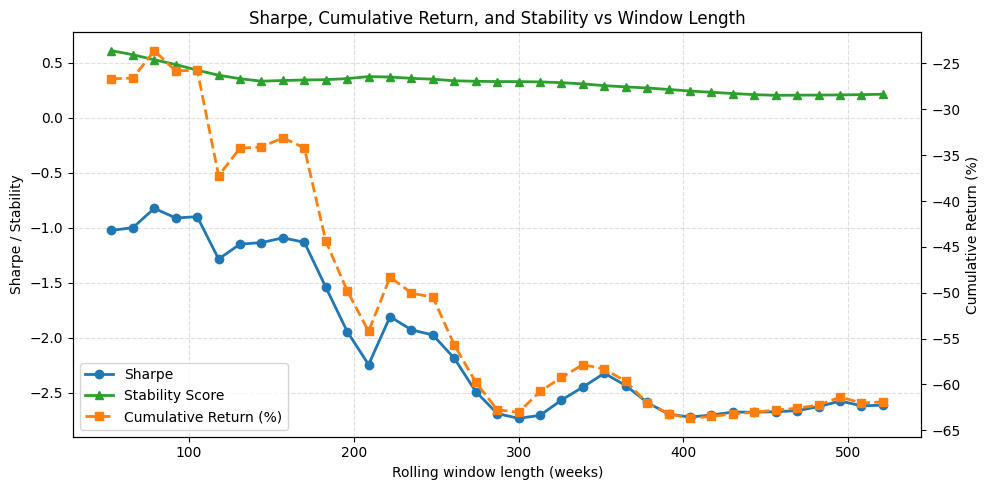

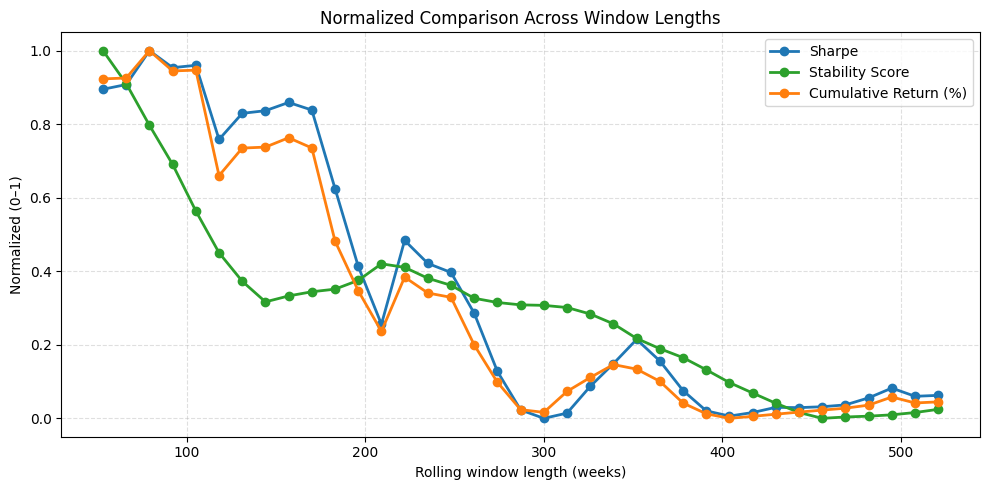

In [ ]:
# Plot Sharpe, BL cumulative return, and stability_score by window length
want_cols = ["sharpe_ratio", "bl_cum_return", "stability_score"]
present   = [c for c in want_cols if c in results_df.columns]

plot_df = (
    results_df[["window_length"] + present]
    .dropna(subset=["window_length"])
    .copy()
)

# guard: make sure types are numeric
plot_df["window_length"] = pd.to_numeric(plot_df["window_length"], errors="coerce")
for c in present:
    plot_df[c] = pd.to_numeric(plot_df[c], errors="coerce")

# sort by window length (ascending)
plot_df = plot_df.sort_values("window_length")

# Consistent colors + legend order
color_map = {
    "sharpe_ratio":    "#1f77b4",  # blue
    "stability_score": "#2ca02c",  # green
    "bl_cum_return":   "#ff7f0e",  # orange
}
legend_order = [
    ("sharpe_ratio", "Sharpe"),
    ("stability_score", "Stability Score"),
    ("bl_cum_return", "Cumulative Return (%)"),
]

# (A) Raw-units plot with twin y-axes
fig, ax1 = plt.subplots(figsize=(10, 5))

# left axis: Sharpe & Stability
if "sharpe_ratio" in plot_df.columns:
    ax1.plot(
        plot_df["window_length"], plot_df["sharpe_ratio"],
        marker="o", linewidth=2, label="Sharpe",
        color=color_map["sharpe_ratio"]
    )
if "stability_score" in plot_df.columns:
    ax1.plot(
        plot_df["window_length"], plot_df["stability_score"],
        marker="^", linewidth=2, label="Stability Score",
        color=color_map["stability_score"]
    )

ax1.set_xlabel("Rolling window length (weeks)")
ax1.set_ylabel("Sharpe / Stability")
ax1.grid(True, linestyle="--", alpha=0.4)

# right axis: cumulative return in %
ax2 = ax1.twinx()
if "bl_cum_return" in plot_df.columns:
    ax2.plot(
        plot_df["window_length"], plot_df["bl_cum_return"] * 100.0,
        marker="s", linewidth=2, linestyle="--", label="Cumulative Return (%)",
        color=color_map["bl_cum_return"]
    )
    ax2.set_ylabel("Cumulative Return (%)")

# One combined legend in the requested order
handles, labels = [], []
for key, lbl in legend_order:
    # find the handle with this label on either axis (if present)
    for ax in (ax1, ax2):
        h, l = ax.get_legend_handles_labels()
        for hh, ll in zip(h, l):
            if ll == lbl:
                handles.append(hh); labels.append(ll)
                break
ax1.legend(handles, labels, loc="best")

ax1.set_title("Sharpe, Cumulative Return, and Stability vs Window Length")
plt.tight_layout()
plt.show()

#  Normalized comparison (0–1) for shape-only view
norm_df = plot_df.copy()
for c in present:
    s = norm_df[c].astype(float)
    rng = s.max() - s.min()
    norm_df[c + "_norm"] = (s - s.min()) / (rng if rng != 0 else 1.0)

fig, ax = plt.subplots(figsize=(10, 5))
for key, lbl in legend_order:
    col = key + "_norm"
    if col in norm_df.columns:
        ax.plot(
            norm_df["window_length"], norm_df[col],
            marker="o", linewidth=2, label=lbl,
            color=color_map[key]
        )

ax.set_xlabel("Rolling window length (weeks)")
ax.set_ylabel("Normalized (0–1)")
ax.set_title("Normalized Comparison Across Window Lengths")
ax.grid(True, linestyle="--", alpha=0.4)
ax.legend(loc="best")
plt.tight_layout()
plt.show()


In [ ]:
best_sharpe = results_df['sharpe_ratio'].max()
candidates = results_df[results_df['sharpe_ratio'] == best_sharpe]

if not candidates.empty:
    best_row = candidates.sort_values('stability_score').iloc[0]
    print(f"Best window length: {int(best_row['window_length'])}")
    print(f"Sharpe Ratio: {best_row['sharpe_ratio']:.3f}")
    print(f"Stability Score: {best_row['stability_score']:.3f}")
    print(f"Cumulative Return: {best_row['bl_cum_return']:.2%}")
else:
    print("No candidate windows found.")

best_window_length = int(best_row["window_length"])
print(f"\n🔁  Re-running BL model with selected window ({best_window_length})...")
best_bl_output = run_bl_model(best_window_length)

Best window length: 79
Sharpe Ratio: -0.824
Stability Score: 0.525
Cumulative Return: -23.61%

🔁  Re-running BL model with selected window (79)...


# Black-Litterman Optimize

In [ ]:
rolling_sigma = best_bl_output["rolling_sigma"]

# Combine into MultiIndex DataFrame
rolling_sigma_df = (
    pd.concat(rolling_sigma, names=["Date"])
      .sort_index()
)

display(rolling_sigma_df)

Asset                 AGZ.P     IEF.O     IEI.O     MBB.O       MUB     SHY.O  \
Date       Asset                                                                
2020-01-03 AGZ.P   0.000014  0.000027  0.000015  0.000010  0.000011  0.000006   
           IEF.O   0.000027  0.000056  0.000032  0.000020  0.000021  0.000011   
           IEI.O   0.000015  0.000032  0.000018  0.000012  0.000012  0.000007   
           MBB.O   0.000010  0.000020  0.000012  0.000011  0.000009  0.000004   
           MUB     0.000011  0.000021  0.000012  0.000009  0.000011  0.000005   
...                     ...       ...       ...       ...       ...       ...   
2025-06-27 MBB.O   0.000036  0.000081  0.000050  0.000072  0.000042  0.000019   
           MUB     0.000022  0.000050  0.000030  0.000042  0.000038  0.000010   
           SHY.O   0.000010  0.000021  0.000015  0.000019  0.000010  0.000007   
           TLT.O   0.000078  0.000185  0.000109  0.000156  0.000098  0.000034   
           VCIT.O  0.000033  0.000074  0.000046  0.000066  0.000041  0.000017   

Asset                 TLT.O    VCIT.O  
Date       Asset                       
2020-01-03 AGZ.P   0.000061  0.000016  
           IEF.O   0.000128  0.000032  
           IEI.O   0.000071  0.000018  
           MBB.O   0.000044  0.000012  
           MUB     0.000050  0.000013  
...                     ...       ...  
2025-06-27 MBB.O   0.000156  0.000066  
           MUB     0.000098  0.000041  
           SHY.O   0.000034  0.000017  
           TLT.O   0.000394  0.000141  
           VCIT.O  0.000141  0.000066  

[2296 rows x 8 columns]

In [ ]:
w_vec                     = best_bl_output["w_vec"]
rolling_market_var        = best_bl_output["rolling_market_var"]
rolling_lambda            = best_bl_output["rolling_lambda"]

rolling_market_var_series = (
    pd.Series(rolling_market_var)
      .sort_index()
      .rename("Market Variance")
)

# Result
print('\nWeight Vector:')
display(w_vec)
print('\nMarket Variance:')
display(rolling_market_var_series)
print('\nLambda Risk Aversion:')
display(rolling_lambda)


Weight Vector:


array([[0.00467768],
       [0.1537094 ],
       [0.07834221],
       [0.16058497],
       [0.1198862 ],
       [0.14014591],
       [0.13980884],
       [0.20284479]])


Market Variance:


,Market Variance
2020-01-03,0.000023
2020-01-10,0.000023
2020-01-17,0.000023
2020-01-24,0.000023
2020-01-31,0.000023
...,...
2025-05-30,0.000067
2025-06-06,0.000067
2025-06-13,0.000065
2025-06-20,0.000065



Lambda Risk Aversion:


,Lambda
2020-01-03,21.583627
2020-01-10,21.480170
2020-01-17,20.804045
2020-01-24,20.679467
2020-01-31,25.192773
...,...
2025-05-30,0.067379
2025-06-06,1.923093
2025-06-13,-3.093054
2025-06-20,-1.826344


In [ ]:
PQ_matrices_by_date       = best_bl_output["PQ_matrices_by_date"]

# BUILD ONE MASTER Q-TABLE  (rows = forecast weeks, cols = assets)
q_table = (
    pd.concat(
        [
            # ① grab the Q column (Series)
            pq_dict["Q"]["Q Values"]
              # ② rename the row labels "View 1", … → the real tickers
              .rename(index=dict(zip(pq_dict["Q"].index, portfolio_tickers)))
              # ③ turn it into a 1-row DataFrame
              .to_frame().T
              # ④ tag the row with its forecast date
              .assign(Forecast_Date=forecast_date)
              .set_index("Forecast_Date")
            for forecast_date, pq_dict in PQ_matrices_by_date.items()
        ]
    )
    .sort_index()                     # chronological order
)

q_table.index.name   = "Forecast Week"
q_table.columns.name = "Asset"

display(q_table.head(20))

p_table = (
    pd.concat(
        {forecast_date: pq_dict["P"]                  # keeps original P rows
         for forecast_date, pq_dict in PQ_matrices_by_date.items()},
        names=["Forecast Week", "View"]               # name the new index levels
    )
    .sort_index()                                     # chronological order
)

# Optional: show fractional strings instead of 0/1 floats
p_table_pretty = p_table.applymap(
    lambda x: "" if x == 0 else "1"                   # identity views → 1 or blank
)

display(p_table.head(20))

Asset,AGZ.P,IEF.O,IEI.O,MBB.O,MUB,SHY.O,TLT.O,VCIT.O
Forecast Week,,,,,,,,
2020-01-03,0.003372,0.007047,0.004052,0.001202,0.003860,0.001536,0.013108,0.003392
2020-01-10,-0.000183,-0.001974,-0.001345,0.001016,0.002972,-0.000472,-0.004888,0.000654
2020-01-17,-0.000162,0.000449,0.000713,0.000369,0.001394,0.000826,-0.003034,0.001635
2020-01-24,0.006034,0.010243,0.005464,0.001937,0.004351,0.001180,0.029416,0.006963
2020-01-31,0.006512,0.014230,0.008505,0.002025,0.003292,0.002946,0.026886,0.008427
2020-02-07,-0.004415,-0.006840,-0.005232,-0.000919,-0.002677,-0.002820,-0.010075,-0.004607
2020-02-14,0.000074,0.000353,0.000000,0.000644,0.001559,0.000177,0.000831,0.000861
2020-02-21,0.004873,0.008385,0.004788,0.001930,0.005706,0.001590,0.024144,0.005054
2020-02-28,0.013571,0.026346,0.017813,0.004219,0.003267,0.008232,0.049108,0.007490


/tmp/ipython-input-859342545.py:37: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  p_table_pretty = p_table.applymap(


AGZ.P  IEF.O  IEI.O  MBB.O  MUB  SHY.O  TLT.O  VCIT.O
Forecast Week View                                                         
2020-01-03    View 1    1.0    0.0    0.0    0.0  0.0    0.0    0.0     0.0
              View 2    0.0    1.0    0.0    0.0  0.0    0.0    0.0     0.0
              View 3    0.0    0.0    1.0    0.0  0.0    0.0    0.0     0.0
              View 4    0.0    0.0    0.0    1.0  0.0    0.0    0.0     0.0
              View 5    0.0    0.0    0.0    0.0  1.0    0.0    0.0     0.0
              View 6    0.0    0.0    0.0    0.0  0.0    1.0    0.0     0.0
              View 7    0.0    0.0    0.0    0.0  0.0    0.0    1.0     0.0
              View 8    0.0    0.0    0.0    0.0  0.0    0.0    0.0     1.0
2020-01-10    View 1    1.0    0.0    0.0    0.0  0.0    0.0    0.0     0.0
              View 2    0.0    1.0    0.0    0.0  0.0    0.0    0.0     0.0
              View 3    0.0    0.0    1.0    0.0  0.0    0.0    0.0     0.0
              View 4    0.0    0.0    0.0    1.0  0.0    0.0    0.0     0.0
              View 5    0.0    0.0    0.0    0.0  1.0    0.0    0.0     0.0
              View 6    0.0    0.0    0.0    0.0  0.0    1.0    0.0     0.0
              View 7    0.0    0.0    0.0    0.0  0.0    0.0    1.0     0.0
              View 8    0.0    0.0    0.0    0.0  0.0    0.0    0.0     1.0
2020-01-17    View 1    1.0    0.0    0.0    0.0  0.0    0.0    0.0     0.0
              View 2    0.0    1.0    0.0    0.0  0.0    0.0    0.0     0.0
              View 3    0.0    0.0    1.0    0.0  0.0    0.0    0.0     0.0
              View 4    0.0    0.0    0.0    1.0  0.0    0.0    0.0     0.0

In [ ]:
rolling_omega             = best_bl_output["rolling_omega"]
omega_matrices_by_date     = best_bl_output["omega_matrices_by_date"]

# (optional) big block for inspection
rolling_omega_df = pd.concat(omega_matrices_by_date, names=["Date"]).sort_index()

print("Full Omega Matrix Block:")
display(rolling_omega_df.head(20))

Full Omega Matrix Block:


View 1    View 2    View 3    View 4    View 5    View 6  \
Date                                                                            
2020-01-03 View 1  0.000014  0.000000  0.000000  0.000000  0.000000  0.000000   
           View 2  0.000000  0.000056  0.000000  0.000000  0.000000  0.000000   
           View 3  0.000000  0.000000  0.000018  0.000000  0.000000  0.000000   
           View 4  0.000000  0.000000  0.000000  0.000011  0.000000  0.000000   
           View 5  0.000000  0.000000  0.000000  0.000000  0.000011  0.000000   
           View 6  0.000000  0.000000  0.000000  0.000000  0.000000  0.000003   
           View 7  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
           View 8  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
2020-01-10 View 1  0.000014  0.000000  0.000000  0.000000  0.000000  0.000000   
           View 2  0.000000  0.000056  0.000000  0.000000  0.000000  0.000000   
           View 3  0.000000  0.000000  0.000019  0.000000  0.000000  0.000000   
           View 4  0.000000  0.000000  0.000000  0.000011  0.000000  0.000000   
           View 5  0.000000  0.000000  0.000000  0.000000  0.000011  0.000000   
           View 6  0.000000  0.000000  0.000000  0.000000  0.000000  0.000003   
           View 7  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
           View 8  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
2020-01-17 View 1  0.000014  0.000000  0.000000  0.000000  0.000000  0.000000   
           View 2  0.000000  0.000056  0.000000  0.000000  0.000000  0.000000   
           View 3  0.000000  0.000000  0.000019  0.000000  0.000000  0.000000   
           View 4  0.000000  0.000000  0.000000  0.000011  0.000000  0.000000   

                     View 7    View 8  
Date                                   
2020-01-03 View 1  0.000000  0.000000  
           View 2  0.000000  0.000000  
           View 3  0.000000  0.000000  
           View 4  0.000000  0.000000  
           View 5  0.000000  0.000000  
           View 6  0.000000  0.000000  
           View 7  0.000317  0.000000  
           View 8  0.000000  0.000026  
2020-01-10 View 1  0.000000  0.000000  
           View 2  0.000000  0.000000  
           View 3  0.000000  0.000000  
           View 4  0.000000  0.000000  
           View 5  0.000000  0.000000  
           View 6  0.000000  0.000000  
           View 7  0.000318  0.000000  
           View 8  0.000000  0.000026  
2020-01-17 View 1  0.000000  0.000000  
           View 2  0.000000  0.000000  
           View 3  0.000000  0.000000  
           View 4  0.000000  0.000000

In [ ]:
# Tidy result tables
pi_table = best_bl_output["pi_table"]
mu_bl_table = best_bl_output["mu_bl_table"]

print("\nRolling Priors Returns π_t (first few rows):")
display(pi_table.head().style.format("{:+.6f}"))

print("\nRolling Posterior Return Vector μ_BL(first few rows):")
display(mu_bl_table.head().style.format("{:+.6f}"))


Rolling Priors Returns π_t (first few rows):


,AGZ.P,IEF.O,IEI.O,MBB.O,MUB,SHY.O,TLT.O,VCIT.O
2020-01-03 00:00:00,+0.000447,+0.000925,+0.000522,+0.000347,+0.000372,+0.000182,+0.002187,+0.000577
2020-01-10 00:00:00,+0.000448,+0.000925,+0.000522,+0.000343,+0.000373,+0.000183,+0.002182,+0.000575
2020-01-17 00:00:00,+0.000434,+0.000897,+0.000507,+0.000333,+0.000361,+0.000177,+0.002115,+0.000557
2020-01-24 00:00:00,+0.000432,+0.000892,+0.000504,+0.000331,+0.000359,+0.000176,+0.002103,+0.000553
2020-01-31 00:00:00,+0.000537,+0.001102,+0.000622,+0.000404,+0.000444,+0.000217,+0.002604,+0.000685



Rolling Posterior Return Vector μ_BL(first few rows):


,AGZ.P,IEF.O,IEI.O,MBB.O,MUB,SHY.O,TLT.O,VCIT.O
2020-01-03 00:00:00,+0.002907,+0.005860,+0.003399,+0.002024,+0.002589,+0.001252,+0.013515,+0.003512
2020-01-10 00:00:00,-0.000088,-0.000206,-0.000152,+0.000323,+0.000569,-0.000026,-0.000351,+0.000176
2020-01-17 00:00:00,+0.000545,+0.001006,+0.000668,+0.000499,+0.000662,+0.000343,+0.001892,+0.000917
2020-01-24 00:00:00,+0.004331,+0.008943,+0.004991,+0.002902,+0.003590,+0.001673,+0.021626,+0.005560
2020-01-31 00:00:00,+0.005455,+0.011006,+0.006380,+0.003512,+0.004082,+0.002294,+0.025300,+0.006843


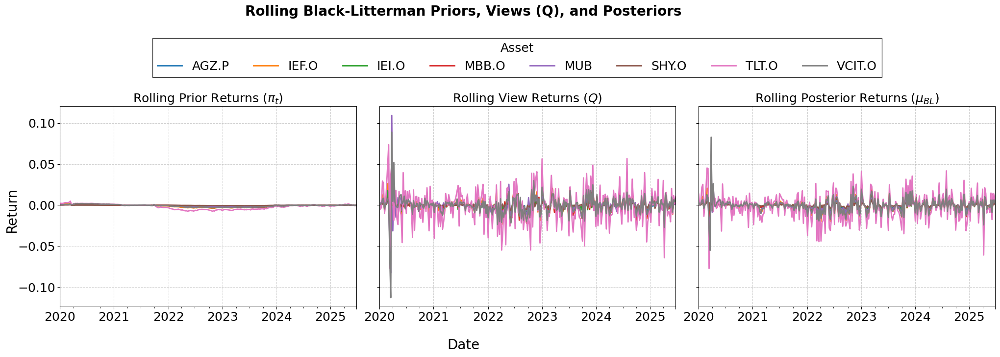

In [ ]:
import matplotlib.pyplot as plt

# Select assets to plot (all columns)
asset_list = pi_table.columns

# Remove index name to prevent automatic axis label
pi_table.index.name = None
mu_bl_table.index.name = None
q_table.index.name = None

# Find global y-limits across all three tables
ymin = min(
    pi_table[asset_list].min().min(),
    mu_bl_table[asset_list].min().min(),
    q_table[asset_list].min().min()
)
ymax = max(
    pi_table[asset_list].max().max(),
    mu_bl_table[asset_list].max().max(),
    q_table[asset_list].max().max()
)
ymargin = 0.05 * (ymax - ymin)
ymin -= ymargin
ymax += ymargin

fig, axes = plt.subplots(1, 3, figsize=(22, 6), sharex=True, sharey=True)

# π_t (priors)
pi_table[asset_list].plot(ax=axes[0], linewidth=2)
axes[0].set_title("Rolling Prior Returns ($\\pi_t$)", fontsize=18)
axes[0].grid(True, linestyle="--", alpha=0.6)
axes[0].legend().remove()
axes[0].tick_params(axis="both", labelsize=18)
axes[0].set_ylim(ymin, ymax)

#  Q (views)
q_table[asset_list].plot(ax=axes[1], linewidth=2)
axes[1].set_title("Rolling View Returns ($Q$)", fontsize=18)
axes[1].grid(True, linestyle="--", alpha=0.6)
axes[1].legend().remove()
axes[1].tick_params(axis="both", labelsize=18)
axes[1].set_ylim(ymin, ymax)

#  μ_BL (posteriors)
mu_bl_table[asset_list].plot(ax=axes[2], linewidth=2)
axes[2].set_title("Rolling Posterior Returns ($\\mu_{BL}$)", fontsize=18)
axes[2].grid(True, linestyle="--", alpha=0.6)
axes[2].legend().remove()
axes[2].tick_params(axis="both", labelsize=18)
axes[2].set_ylim(ymin, ymax)

#  Shared y-label for all subplots
fig.text(0.5, 0.04, "Date", ha="center", va="center", fontsize=20)
fig.text(0.075, 0.5, "Return", va="center", rotation="vertical", fontsize=20)



#  Shared legend at the top center
handles, labels = axes[0].get_legend_handles_labels()
leg = fig.legend(
    handles, labels,
    loc="upper center",
    bbox_to_anchor=(0.55, 1.15),    # Centered horizontally, above the charts
    ncol=len(labels),              # All assets in one row
    fontsize=18,
    title="Asset",
    title_fontsize=18,
    frameon=True,
    borderaxespad=1.5,
    fancybox=False
)
frame = leg.get_frame()
frame.set_edgecolor("black")
frame.set_linewidth(1)

fig.suptitle(
    "Rolling Black-Litterman Priors, Views (Q), and Posteriors",
    fontsize=20,
    weight="bold",
    y=1.20
)

plt.tight_layout(rect=[0.08, 0.09, 1, 1]) # adjust rect to allow y-label
plt.show()

,AGZ.P,IEF.O,IEI.O,MBB.O,MUB,SHY.O,TLT.O,VCIT.O
2020-01-03,0.106285,0.076751,0.115724,0.000000,0.363262,0.332578,0.005399,0.000000
2020-01-10,0.000000,0.000000,0.000000,0.220751,0.704307,0.000000,0.000000,0.074942
2020-01-17,0.000000,0.000000,0.014456,0.000000,0.237296,0.634712,0.000000,0.113537
2020-01-24,0.372218,0.079052,0.081223,0.000000,0.209267,0.000000,0.082148,0.176093
2020-01-31,0.133004,0.107131,0.203337,0.000000,0.000000,0.425258,0.014891,0.116378
...,...,...,...,...,...,...,...,...
2025-05-30,0.000000,0.062862,0.109956,0.189928,0.000000,0.248194,0.084233,0.304827
2025-06-06,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.731150,0.268850
2025-06-13,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
2025-06-20,0.000000,0.000000,0.000000,0.000000,0.660488,0.000000,0.339512,0.000000


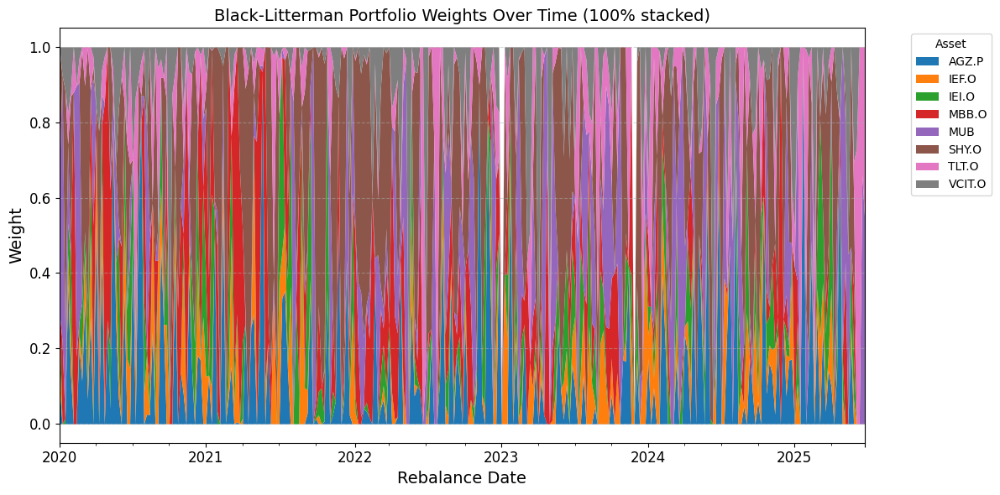

In [ ]:
bl_weights_panel = best_bl_output["bl_weights_panel"]
display(bl_weights_panel.round(6))

# Stacked Area Plot of Weights
weights_normalised = bl_weights_panel.div(bl_weights_panel.sum(axis=1), axis=0)

fig, ax = plt.subplots(figsize=(12, 6))
weights_normalised.plot.area(ax=ax, linewidth=0)

ax.set_title("Black-Litterman Portfolio Weights Over Time (100% stacked)", fontsize=14)
ax.set_ylabel("Weight", fontsize=14)
ax.set_xlabel("Rebalance Date", fontsize=14)
ax.tick_params(axis="both", which="major", labelsize=12)
ax.grid(True, axis='y', linestyle="--", alpha=0.5)
ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left", ncol=1, title="Asset")

plt.tight_layout()
plt.show()

# Performance


Portfolio cumulative values since 27/12/2019:


,Passive Portfolio (Gross),Black-Litterman Portfolio (Gross)
Date,,
2019-12-27,118829.3637,118829.3637
2020-01-03,119400.7115,119227.7075
2020-01-10,119340.1702,119509.8171
2020-01-17,119384.7830,119635.4558
2020-01-24,120405.9436,120598.8107
...,...,...
2025-05-30,102559.6129,96999.7965
2025-06-06,101662.8433,96015.1528
2025-06-13,102392.8687,97117.6114


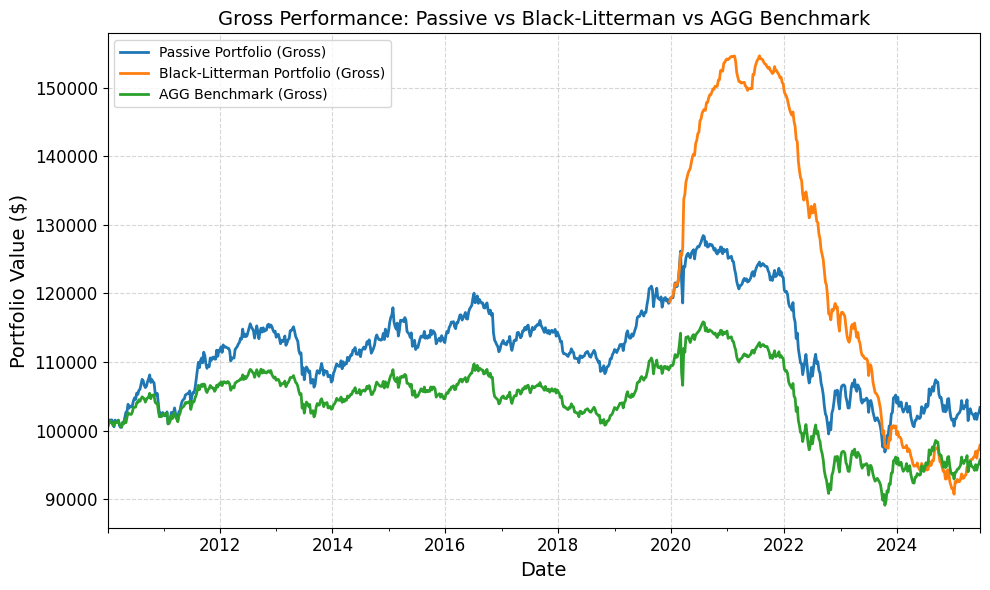

In [ ]:
# Align weight panel to weekly return index (forward-fill)
aligned_weights = (
    bl_weights_panel
      .reindex(weekly_returns.index) # align dates
      .ffill() # carry last weight until next rebalance
      .fillna(0.0) # before first rebalance, weight = 0
)

# Align returns
weekly_returns = weekly_returns[portfolio_tickers + ["AGG"]]
portfolio_returns = (weekly_returns[portfolio_tickers] * weights).sum(axis=1)

# Compute BL portfolio weekly returns
bl_weekly_returns = (weekly_returns[aligned_weights.columns] * aligned_weights).sum(axis=1)

# Simulate Cumulative Growth of $100,000 Investment
initial_investment = 100000
portfolio_cum = (1 + portfolio_returns).cumprod() * initial_investment
agg_cum = (1 + weekly_returns["AGG"]).cumprod() * initial_investment

# Build cumulative series, anchored to 27 Dec-2019
anchor_dt = pd.Timestamp("2019-12-27")
orig_anchor_val = portfolio_cum.loc[:anchor_dt].iloc[-1]

bl_cum = (1 + bl_weekly_returns.loc[anchor_dt:]).cumprod() * orig_anchor_val

# Pre-pend the anchor value so BL has the same 27-Dec-2019 level
bl_cum = pd.concat([pd.Series(index=portfolio_cum.loc[:anchor_dt].index[:-1]), bl_cum])

# Combine for comparison
performance_compare_df = pd.DataFrame({
    "Passive Portfolio (Gross)": portfolio_cum,
    "Black-Litterman Portfolio (Gross)": bl_cum,
    "AGG Benchmark (Gross)": agg_cum,
})

# Performance table
window_start = anchor_dt
print("\nPortfolio cumulative values since 27/12/2019:")
perfromance_since_anchor = performance_compare_df[
    ["Passive Portfolio (Gross)", "Black-Litterman Portfolio (Gross)"]].loc[window_start:]
display(perfromance_since_anchor.round(4))


# Plot performance comparison
plt.figure(figsize=(10, 6))
ax = plt.gca()
performance_compare_df.plot(ax=ax, linewidth=2)
ax.set_title("Gross Performance: Passive vs Black-Litterman vs AGG Benchmark", fontsize=14)
ax.set_ylabel("Portfolio Value ($)", fontsize=14)
ax.set_xlabel("Date", fontsize=14)
ax.grid(True, linestyle="--", alpha=0.5)
ax.tick_params(axis="both", which="major", labelsize=12)
plt.legend()
plt.tight_layout()
plt.show()


Portfolio cumulative values since 27/12/2019:


,Passive Portfolio (Net),Black-Litterman (Net),Orig Mgmt Cost ($),BL Mgmt Cost ($),BL Txn Cost ($),Orig Cumulative Cost ($),BL Cumulative Cost ($)
2019-12-27,118829.2522,118829.2522,0.6839,0.5768,0.0000,335.8935,300.5327
2020-01-03,119400.5963,119208.1326,0.6855,0.5768,16.3771,336.5790,317.4867
2020-01-10,119340.0554,119467.4113,0.6887,0.5787,19.1119,337.2677,337.1772
2020-01-17,119384.6678,119576.5717,0.6884,0.5799,13.7552,337.9561,351.5124
2020-01-24,120405.8215,120496.8922,0.6887,0.5805,35.5879,338.6448,387.6807
...,...,...,...,...,...,...,...
2025-05-30,102559.6110,89989.0042,0.5866,0.4335,25.2427,519.1677,7964.0073
2025-06-06,101662.8465,89063.8891,0.5916,0.4368,12.9383,519.7593,7977.3825
2025-06-13,102392.8677,90081.7376,0.5864,0.4323,5.3770,520.3457,7983.1918
2025-06-20,102658.1668,90172.3406,0.5906,0.4373,13.2098,520.9363,7996.8389


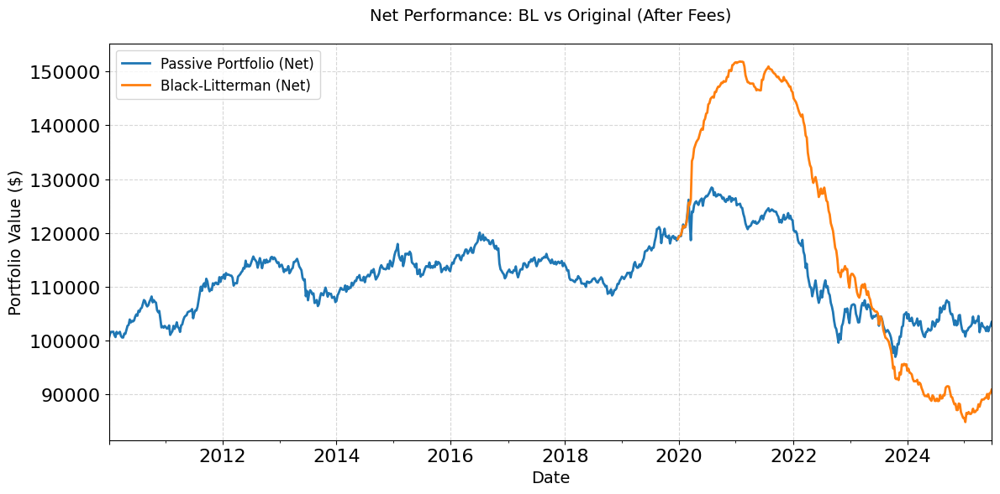

In [ ]:
bl_returns_net_series     = best_bl_output["bl_returns_net_series"]
weekly_fee                = best_bl_output["weekly_fee"]
etfstxn_costs             = best_bl_output["etfstxn_costs"]

# Apply same mgmt fee to Original Portfolio and AGG Benchmark
portfolio_returns_net = portfolio_returns * (1 - weekly_fee)
agg_returns_net       = weekly_returns["AGG"] * (1 - weekly_fee)

# Build cumulative value series
initial_investment = 100000
anchor_dt = pd.Timestamp("2019-12-27")

# Anchor value from original portfolio at 27-Dec-2019
orig_anchor_val = (1 + portfolio_returns_net.loc[:anchor_dt]).cumprod().iloc[-1] * initial_investment

# Cumulative series
portfolio_cum_net = (1 + portfolio_returns_net).cumprod() * initial_investment
agg_cum_net       = (1 + agg_returns_net).cumprod() * initial_investment
bl_cum_net        = (1 + bl_returns_net_series.loc[anchor_dt:]).cumprod() * orig_anchor_val
bl_cum_net        = pd.concat([pd.Series(index=portfolio_cum_net.loc[:anchor_dt].index[:-1]), bl_cum_net])

# Final comparison DataFrame
performance_compare_net_df = pd.DataFrame({
    "Passive Portfolio (Net)": portfolio_cum_net,
    "Black-Litterman (Net)": bl_cum_net,
    # "AGG Benchmark (Net)": agg_cum_net,
})

# Table
window_start = anchor_dt
print("\nPortfolio cumulative values since 27/12/2019:")
perfromance_net_since_anchor = performance_compare_net_df[
    ["Passive Portfolio (Net)", "Black-Litterman (Net)"]].loc[window_start:]


# Transaction cost rates
txn_cost_rates = pd.Series(etfstxn_costs)

# BL: weight turnover and transaction cost
weight_changes = aligned_weights.diff().abs().fillna(0)
txn_cost_matrix = weight_changes.mul(txn_cost_rates, axis=1) * initial_investment
txn_cost_weekly = txn_cost_matrix.sum(axis=1)

# Management fees for both portfolios (based on gross AUM)
portfolio_cum_gross = (1 + portfolio_returns).cumprod() * initial_investment
bl_cum_gross        = (1 + bl_returns_net_series).cumprod() * initial_investment

mgmt_cost_orig = portfolio_cum_gross.shift(1).fillna(initial_investment) * weekly_fee
mgmt_cost_bl   = bl_cum_gross.shift(1).fillna(initial_investment) * weekly_fee

# Combine costs
txn_cost_orig     = pd.Series(0.0, index=mgmt_cost_orig.index)  # No txn cost for Original
total_cost_orig   = mgmt_cost_orig + txn_cost_orig
total_cost_bl     = mgmt_cost_bl + txn_cost_weekly

# Cumulative cost
cum_cost_orig = total_cost_orig.cumsum()
cum_cost_bl   = total_cost_bl.cumsum()

# Add cost columns to performance table
perfromance_net_since_anchor = perfromance_net_since_anchor.copy()
perfromance_net_since_anchor["Orig Mgmt Cost ($)"]      = mgmt_cost_orig.loc[window_start:]
perfromance_net_since_anchor["BL Mgmt Cost ($)"]        = mgmt_cost_bl.loc[window_start:]
perfromance_net_since_anchor["BL Txn Cost ($)"]         = txn_cost_weekly.loc[window_start:]
perfromance_net_since_anchor["Orig Cumulative Cost ($)"] = cum_cost_orig.loc[window_start:]
perfromance_net_since_anchor["BL Cumulative Cost ($)"]   = cum_cost_bl.loc[window_start:]


# Display cost table
display(perfromance_net_since_anchor.round(4))

# Plot results
plt.figure(figsize=(12, 6))
performance_compare_net_df.plot(ax=plt.gca(), linewidth=2)
plt.title("Net Performance: BL vs Original (After Fees)", fontsize=14, pad=20)
plt.ylabel("Portfolio Value ($)", fontsize=14)
plt.xlabel("Date", fontsize=14)
plt.tick_params(axis="both", which="major", labelsize=16)
plt.grid(True, linestyle="--", alpha=0.5)
plt.legend(loc="upper left", fontsize = 12)
plt.tight_layout()
plt.show()

In [ ]:
# Find the first date when BL outperforms Passive
bl_gt_passive = performance_compare_net_df["Black-Litterman (Net)"] > performance_compare_net_df["Passive Portfolio (Net)"]
first_outperformance_date = bl_gt_passive[bl_gt_passive].index.min()

# Now look for the first date AFTER that where BL <= Passive (i.e., convergence)
bl_leq_passive = performance_compare_net_df["Black-Litterman (Net)"] <= performance_compare_net_df["Passive Portfolio (Net)"]
post_outperf_convergence = bl_leq_passive.loc[first_outperformance_date:].copy()
post_convergence_date = post_outperf_convergence[post_outperf_convergence].index.min()

# Display results
print("🔍 First date when Black-Litterman outperforms Passive Portfolio (Net):")
print(first_outperformance_date.strftime("%Y-%m-%d"))

if pd.isna(post_convergence_date):
    print("✅ After that, Black-Litterman never dropped back below Passive Portfolio.")
else:
    print("🔁 First date when BL converges or underperforms again:")
    print(post_convergence_date.strftime("%Y-%m-%d"))



🔍 First date when Black-Litterman outperforms Passive Portfolio (Net):
2020-01-10
🔁 First date when BL converges or underperforms again:
2020-01-31


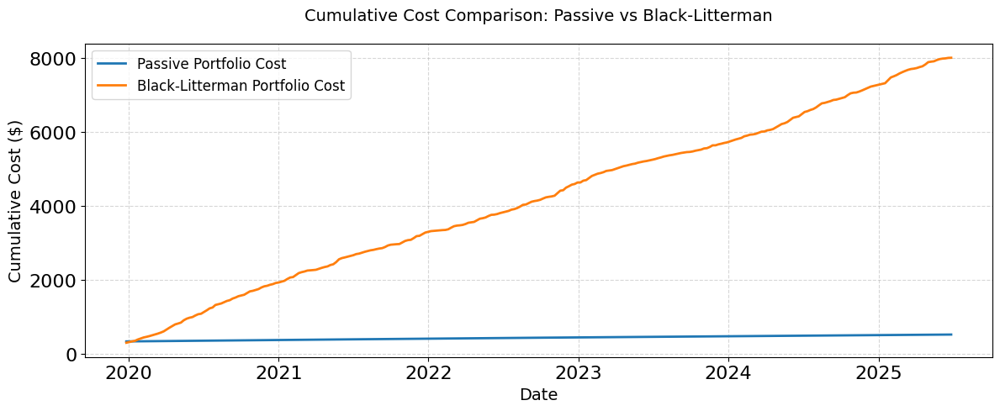

In [ ]:
# Plot cumulative cost comparison
plt.figure(figsize=(12, 5))
plt.plot(
    cum_cost_orig.loc[window_start:],
    label="Passive Portfolio Cost",
    linewidth=2
)
plt.plot(
    cum_cost_bl.loc[window_start:],
    label="Black-Litterman Portfolio Cost",
    linewidth=2
)
plt.title("Cumulative Cost Comparison: Passive vs Black-Litterman", fontsize=14, pad=20)
plt.ylabel("Cumulative Cost ($)", fontsize=14)
plt.xlabel("Date", fontsize=14)
plt.grid(True, linestyle="--", alpha=0.5)
plt.tick_params(axis="both", which="major", labelsize=16)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()



In [ ]:
# Define the evaluation window
eval_start = pd.Timestamp("2020-01-03")   # first Friday of 2020
eval_end   = pd.Timestamp("2025-06-27")   # last Friday before 30-Jun-25

# Prepare weekly return series *inside* that window
orig_ret = portfolio_returns.loc[eval_start:eval_end]
bl_ret   = bl_weekly_returns.loc[eval_start:eval_end]

rets_df = pd.DataFrame({
    "Original"        : orig_ret,
    "Black-Litterman" : bl_ret
})

# Turnover (BL only)
turnover_weekly = (
    bl_weights_panel.diff().abs().sum(axis=1)
      .reindex(weekly_returns.index).ffill().fillna(0.0)
      .loc[eval_start:eval_end]
)

# Helper for IR
def information_ratio(port_ret, bench_ret, periods=52):

    active = (port_ret - bench_ret).dropna()
    if active.empty:
        return np.nan
    ann_active = active.mean() * periods
    te         = active.std(ddof=0) * np.sqrt(periods)
    return ann_active / te if te else np.nan


# Risk-statistics helper
def risk_stats(r, weekly_rf_2019=weekly_rf_2019):
    r = r.dropna()

    # weekly excess vs risk-free
    weekly_excess = r - weekly_rf_2019
    w_mu  = weekly_excess.mean()
    w_std = r.std(ddof=0)
    w_var = w_std**2
    w_sharpe = w_mu / w_std if w_std else np.nan

    # draw-down
    nav = (1 + r).cumprod()
    dd  = nav / nav.cummax() - 1
    max_dd = dd.min()
    end_idx   = dd.idxmin()
    start_idx = dd.loc[:end_idx][dd.loc[:end_idx] == 0].index.max()
    dd_len = (end_idx - start_idx).days // 7

    # tails
    var95  = -np.percentile(r, 5)
    cvar95 = -r[r <= -var95].mean()

    return pd.Series({
        "Excess Return"       : w_mu,
        "Standard Deviation"  : w_std,
        "Variance"            : w_var,
        "Sharpe Ratio"        : w_sharpe,
        "Max-DD"              : max_dd,
        "DD (wks)"            : dd_len,
        "VaR 95%"             : var95,
        "CVaR 95%"            : cvar95,
    })


# Assemble the comparison table
bench_ret = weekly_returns["AGG"].loc[eval_start:eval_end]

stats_tbl = pd.concat({
    "Original":        risk_stats(orig_ret),
    "Black-Litterman": risk_stats(bl_ret),
}, axis=1).T

for lbl, series in {"Original": orig_ret, "Black-Litterman": bl_ret}.items():
    active   = (series - bench_ret).dropna()
    stats_tbl.loc[lbl, "Active Return"]   = active.mean()*52
    stats_tbl.loc[lbl, "Active Risk"]     = active.std(ddof=0)

stats_tbl["Turnover (wk %)"] = [0.0, turnover_weekly.mean()]
stats_tbl["Info Ratio"] = [
    information_ratio(orig_ret, bench_ret),
    information_ratio(bl_ret,   bench_ret)
]



stats_tbl.index.name = "Portfolio"


# Display
stats_tbl_vert = stats_tbl.T
stats_tbl_vert.index.name = "Metric"

# formatting
fmt_map = {
    "Excess Return"       : "{:.4%}",
    "Standard Deviation"  : "{:.4%}",
    "Variance"            : "{:.6%}",
    "Active Return"       : "{:.4%}",
    "Active Risk"         : "{:.4%}",
    "Max-DD"              : "{:.2%}",
    "VaR 95%"             : "{:.2%}",
    "CVaR 95%"            : "{:.2%}",
    "Turnover (wk %)"     : "{:.2%}",
    "Sharpe Ratio"        : "{:.2f}",
    "Info Ratio"          : "{:.2f}",
    "DD (wks)"            : "{:.0f}",
}

# build the Vertical Table Styler
vertical_table_styler = stats_tbl_vert.style

# Apply the appropriate format string to every metric (row)
for metric_name, printf_format in fmt_map.items():
    # subset = ( [row-label],   all_columns )
    vertical_table_styler = vertical_table_styler.format(
        printf_format,
        subset=([metric_name], slice(None))
    )

# Add a title
vertical_table_styler = vertical_table_styler.set_caption(
    "Weekly Performance Metrics"
)


# Show the final, formatted table
display(vertical_table_styler)

Portfolio,Original,Black-Litterman
Metric,,
Excess Return,-0.0733%,-0.0934%
Standard Deviation,0.9156%,0.7923%
Variance,0.008383%,0.006278%
Sharpe Ratio,-0.08,-0.12
Max-DD,-24.55%,-41.30%
DD (wks),168,180
VaR 95%,1.52%,1.29%
CVaR 95%,1.98%,1.67%
Active Return,-0.1326%,-1.1792%


# Confidence Tilt

Running model for confidence level: 0.05
Running model for confidence level: 0.15
Running model for confidence level: 0.25
Running model for confidence level: 0.35
Running model for confidence level: 0.45
Running model for confidence level: 0.50
Running model for confidence level: 0.55
Running model for confidence level: 0.65
Running model for confidence level: 0.75
Running model for confidence level: 0.85
Running model for confidence level: 0.95


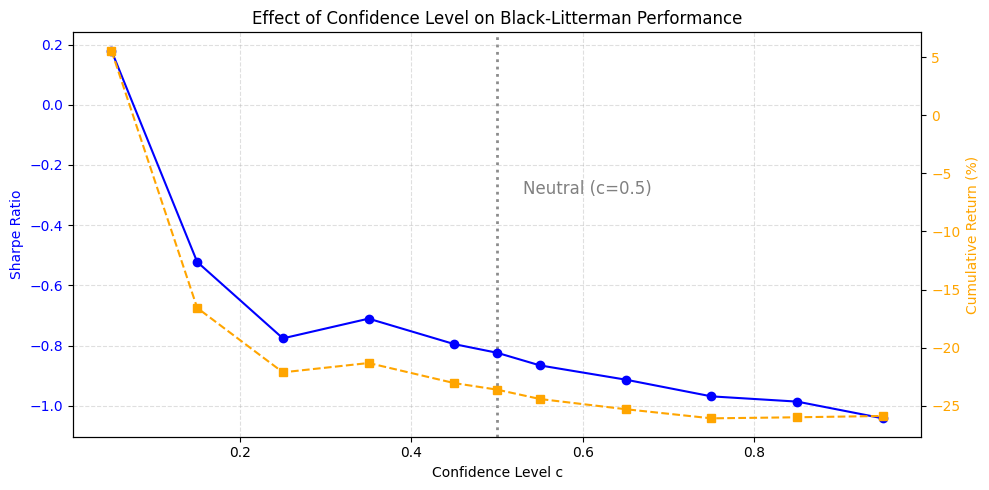

In [ ]:
c_values = np.linspace(0.05, 0.95, 10)
if 0.5 not in np.round(c_values, 4):
    c_values = np.append(c_values, 0.5)
c_values = np.sort(c_values)
window_length = best_window_length  # or set manually

c_results = []

for c in c_values:
    print(f"Running model for confidence level: {c:.2f}")
    result = run_bl_model(window_length=window_length, conf=c)
    result["confidence"] = c
    c_results.append(result)

# Collect into DataFrame
c_results_df = pd.DataFrame(c_results)

# Plot
fig, ax1 = plt.subplots(figsize=(10, 5))

ax1.plot(c_results_df["confidence"], c_results_df["sharpe_ratio"], label="Sharpe", marker="o", color="blue")
ax1.set_ylabel("Sharpe Ratio", color="blue")
ax1.tick_params(axis="y", labelcolor="blue")

# Add vertical line for c = 0.5
ax1.axvline(x=0.5, color="grey", linestyle=":", lw=2, alpha=0.9, zorder=0)
ax1.annotate(
    "Neutral (c=0.5)",
    xy=(0.53, ax1.get_ylim()[0] + 0.6 * (ax1.get_ylim()[1] - ax1.get_ylim()[0])),
    color="grey", fontsize=12
)

ax2 = ax1.twinx()
ax2.plot(c_results_df["confidence"], c_results_df["bl_cum_return"] * 100, label="Cumulative Return (%)", marker="s", linestyle="--", color="orange")
ax2.set_ylabel("Cumulative Return (%)", color="orange")
ax2.tick_params(axis="y", labelcolor="orange")

ax1.set_xlabel("Confidence Level c")
ax1.set_title("Effect of Confidence Level on Black-Litterman Performance")
ax1.grid(True, linestyle="--", alpha=0.4)

plt.tight_layout()
plt.show()


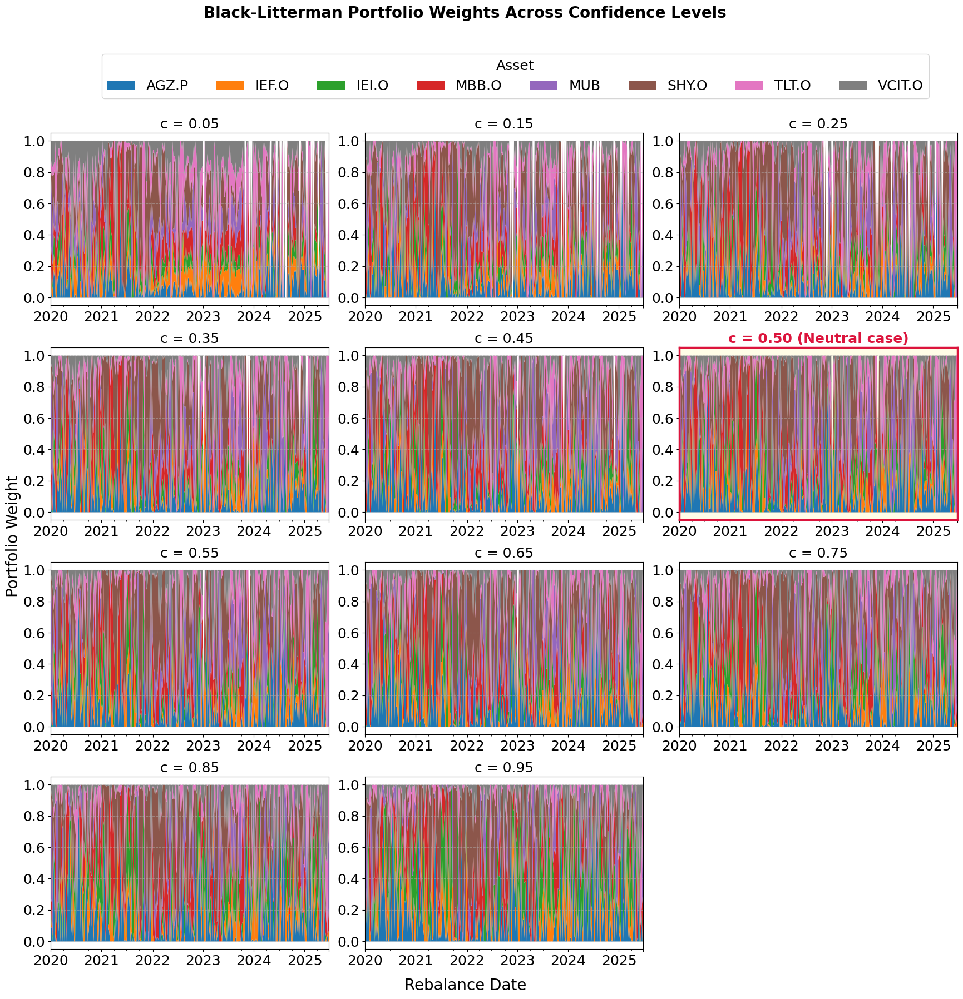

In [ ]:
import math

# Number of subplots
num_c = len(c_results)
cols = 3
rows = math.ceil(num_c / cols)

fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 4.5 * rows), sharex=False, sharey=False)

# Flatten axes array
axes = axes.flatten()

# Store one legend handle to create shared legend later
handles, labels = None, None

for i, result in enumerate(c_results):
    c = result["confidence"]
    bl_weights_panel = result["bl_weights_panel"]

    # Normalize to 100% allocation
    weights_normalised = bl_weights_panel.div(bl_weights_panel.sum(axis=1), axis=0)

    ax = axes[i]
    plot = weights_normalised.plot.area(ax=ax, linewidth=0)

    # Highlight the c=0.5 plot
    if np.isclose(c, 0.5, atol=1e-3):
        ax.set_facecolor("#fffde7")  # Light yellow
        ax.set_title(f"c = {c:.2f} (Neutral case)", fontsize=18, color="crimson", weight="bold")
        # Thicker red border
        for spine in ax.spines.values():
            spine.set_edgecolor("crimson")
            spine.set_linewidth(2.5)
    else:
        ax.set_title(f"c = {c:.2f}", fontsize=18)

    # Keep ticks, remove individual axis titles
    ax.tick_params(axis="both", which="major", labelsize=18)
    ax.grid(True, axis='y', linestyle="--", alpha=0.5)

    # Save legend handles just once
    if handles is None or labels is None:
        handles, labels = ax.get_legend_handles_labels()

    ax.get_legend().remove()  # remove individual legend

# Remove unused axes if any
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Add shared axis titles (but keep ticks on each subplot)
fig.text(0.5, 0.046, "Rebalance Date", ha="center", fontsize=20)
fig.text(0.041, 0.5, "Portfolio Weight", va="center", rotation="vertical", fontsize=20)

# Add a shared legend below all subplots
fig.legend(
    handles,
    labels,
    title="Asset",
    loc="lower center",
    ncol=len(labels),
    fontsize=18,
    title_fontsize=18,
    bbox_to_anchor=(0.55, 0.93)
)

fig.suptitle("Black-Litterman Portfolio Weights Across Confidence Levels", fontsize=20, weight='bold', y=1.03)

plt.tight_layout(rect=[0.05, 0.06, 1, 0.95])
plt.show()


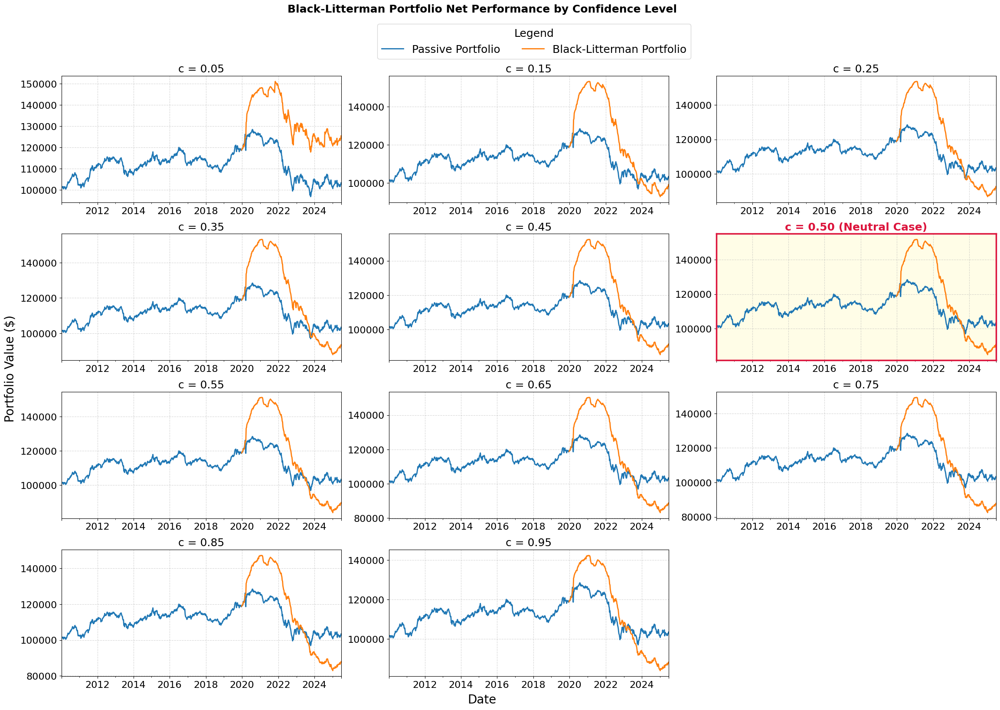

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import math

num_c = len(c_results)
cols = 3  # 3 charts per row
rows = math.ceil(num_c / cols)

fig, axes = plt.subplots(rows, cols, figsize=(8 * cols, 4.2 * rows), sharex=False)

# Flatten axes for easy indexing
axes = axes.flatten()

legend_handles = []
legend_labels = []

for i, result in enumerate(c_results):
    c = result["confidence"]
    bl_returns_net_series = result["bl_returns_net_series"]
    bl_weights_panel = result["bl_weights_panel"]

    # Align weights
    aligned_weights = (
        bl_weights_panel.reindex(weekly_returns.index)
                        .ffill()
                        .fillna(0.0)
    )

    # NET PERFORMANCE
    bl_cum_net = (1 + bl_returns_net_series.loc[anchor_dt:]).cumprod() * portfolio_cum_net.loc[:anchor_dt].iloc[-1]
    bl_cum_net = pd.concat([pd.Series(index=portfolio_cum_net.loc[:anchor_dt].index[:-1]), bl_cum_net])

    df_net = pd.DataFrame({
        "Passive (Net)": portfolio_cum_net,
        "BL (Net)": bl_cum_net,
    })

    ax = axes[i]
    df_net.plot(ax=ax, linewidth=2)

    # HIGHLIGHT c = 0.5 ROW
    if np.isclose(c, 0.5, atol=1e-3):
        ax.set_facecolor("#fffde7")
        ax.set_title(f"c = {c:.2f} (Neutral Case)", fontsize=18, color="crimson", weight="bold")
        for spine in ax.spines.values():
            spine.set_edgecolor("crimson")
            spine.set_linewidth(2.5)
    else:
        ax.set_title(f"c = {c:.2f}", fontsize=18)

    # Increase tick font size
    ax.tick_params(axis="both", which="major", labelsize=16)

    # Keep ticks, remove individual axis titles
    ax.grid(True, linestyle="--", alpha=0.5)

    if i == 0:
        legend_handles, _ = ax.get_legend_handles_labels()
        legend_labels = ["Passive Portfolio", "Black-Litterman Portfolio"]
    ax.get_legend().remove()

# Remove unused axes if any
for j in range(len(c_results), len(axes)):
    fig.delaxes(axes[j])

# Shared legend
fig.legend(
    handles=legend_handles,
    labels=legend_labels,
    title="Legend",
    loc="upper center",
    ncol=2,
    fontsize=18,
    title_fontsize=18,
    bbox_to_anchor=(0.55, 0.98)
)

# Common suptitle for all charts
fig.suptitle(
    "Black-Litterman Portfolio Net Performance by Confidence Level",
    fontsize=18,
    color="black",
    weight="bold",
    y=1.00
)

# === Shared axis labels ===
fig.text(0.5, 0.040, "Date", ha="center", fontsize=20)
fig.text(0.041, 0.5, "Portfolio Value ($)", va="center", rotation="vertical", fontsize=20)

plt.tight_layout(rect=[0.05, 0.05, 1, 0.95])  # leave room for labels + title
plt.show()


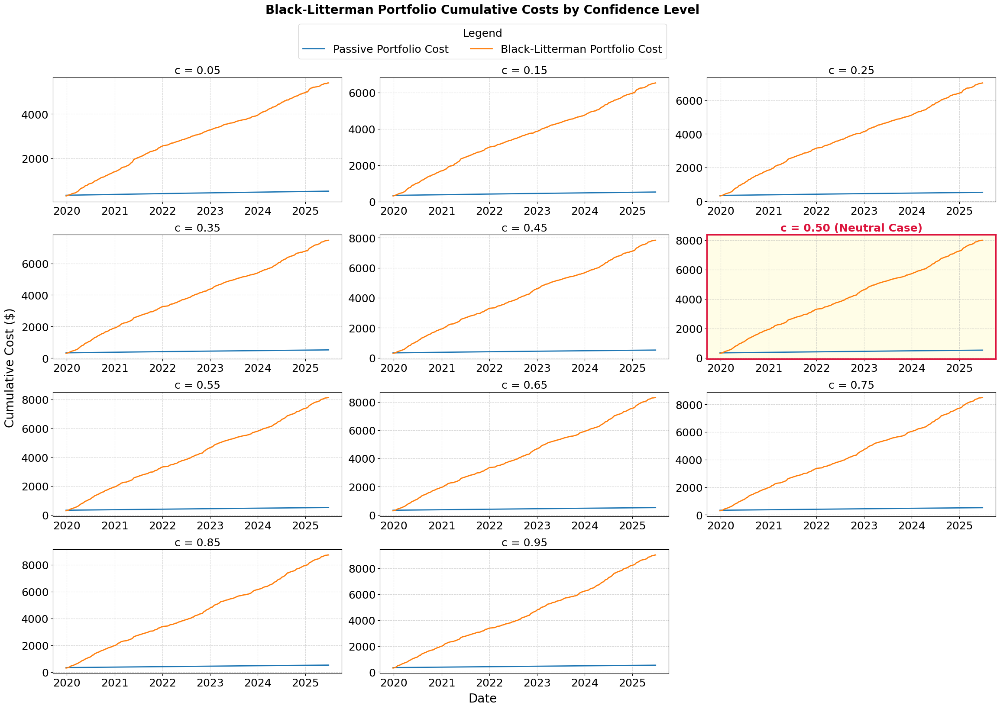

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import math

num_c = len(c_results)
cols = 3  # 3 charts per row
rows = math.ceil(num_c / cols)

fig, axes = plt.subplots(rows, cols, figsize=(8 * cols, 4.2 * rows), sharex=False)
axes = axes.flatten()

legend_handles = []
legend_labels = []

for i, result in enumerate(c_results):
    c = result["confidence"]
    bl_returns_net_series = result["bl_returns_net_series"]
    bl_weights_panel = result["bl_weights_panel"]

    # Align weights
    aligned_weights = (
        bl_weights_panel.reindex(weekly_returns.index)
                        .ffill()
                        .fillna(0.0)
    )

    # CUMULATIVE COST COMPARISON
    txn_cost_rates = pd.Series(etfstxn_costs)
    weight_changes = aligned_weights.diff().abs().fillna(0)
    txn_cost_matrix = weight_changes.mul(txn_cost_rates, axis=1) * initial_investment
    txn_cost_weekly = txn_cost_matrix.sum(axis=1)

    bl_cum_gross = (1 + bl_returns_net_series).cumprod() * initial_investment
    mgmt_cost_bl = bl_cum_gross.shift(1).fillna(initial_investment) * weekly_fee

    total_cost_bl = mgmt_cost_bl + txn_cost_weekly
    cum_cost_bl = total_cost_bl.cumsum()

    ax = axes[i]
    ax.plot(cum_cost_orig.loc[anchor_dt:], label="Passive Portfolio Cost", linewidth=2)
    ax.plot(cum_cost_bl.loc[anchor_dt:], label="Black-Litterman Portfolio Cost", linewidth=2)

    # Highlight c = 0.5
    if np.isclose(c, 0.5, atol=1e-3):
        ax.set_facecolor("#fffde7")
        ax.set_title(f"c = {c:.2f} (Neutral Case)", fontsize=18, color="crimson", weight="bold")
        for spine in ax.spines.values():
            spine.set_edgecolor("crimson")
            spine.set_linewidth(2.5)
    else:
        ax.set_title(f"c = {c:.2f}", fontsize=18)

    # Increase tick font size (axis values)
    ax.tick_params(axis="both", which="major", labelsize=18)

    ax.grid(True, linestyle="--", alpha=0.5)

    if i == 0:
        legend_handles, _ = ax.get_legend_handles_labels()
        legend_labels = ["Passive Portfolio Cost", "Black-Litterman Portfolio Cost"]

    leg = ax.get_legend()
    if leg is not None:
        leg.remove()

# Remove unused axes if any
for j in range(len(c_results), len(axes)):
    fig.delaxes(axes[j])

# Shared legend
fig.legend(
    handles=legend_handles,
    labels=legend_labels,
    title="Legend",
    loc="upper center",
    ncol=2,
    fontsize=18,
    title_fontsize=18,
    bbox_to_anchor=(0.5, 0.98)
)

# Common suptitle for all charts
fig.suptitle(
    "Black-Litterman Portfolio Cumulative Costs by Confidence Level",
    fontsize=20,
    color="black",
    weight="bold",
    y=1.00
)

# === Shared axis labels ===
fig.text(0.5, 0.04, "Date", ha="center", fontsize=20)
fig.text(0.04, 0.5, "Cumulative Cost ($)", va="center", rotation="vertical", fontsize=20)

plt.tight_layout(rect=[0.05, 0.05, 1, 0.95])  # leave room for labels + title
plt.show()


In [ ]:
# Container for results
results = {}

# Loop through each confidence level result
for result in c_results:
    c = result["confidence"]
    bl_ret = result["bl_returns_net_series"].loc[eval_start:eval_end]
    bl_weights_panel = result["bl_weights_panel"]

    # Risk stats for BL portfolio
    stats = risk_stats(bl_ret)

    # Active return/risk vs benchmark
    active = (bl_ret - bench_ret).dropna()
    stats["Active Return"] = active.mean() * 52
    stats["Active Risk"]   = active.std(ddof=0)

    # Turnover
    turnover_weekly = (
        bl_weights_panel.diff().abs().sum(axis=1)
          .reindex(weekly_returns.index).ffill().fillna(0.0)
          .loc[eval_start:eval_end]
    )
    stats["Turnover (wk %)"] = turnover_weekly.mean()

    # Information ratio
    stats["Info Ratio"] = information_ratio(bl_ret, bench_ret)

    # Save under label
    results[f"BL (c={c:.2f})"] = stats

# Always include original passive portfolio for comparison
stats_orig = risk_stats(orig_ret)
active = (orig_ret - bench_ret).dropna()
stats_orig["Active Return"] = active.mean() * 52
stats_orig["Active Risk"]   = active.std(ddof=0)
stats_orig["Turnover (wk %)"] = 0.0
stats_orig["Info Ratio"] = information_ratio(orig_ret, bench_ret)

results["Original"] = stats_orig

# Build final DataFrame
stats_tbl_conf = pd.DataFrame(results).T
stats_tbl_conf.index.name = "Portfolio"

# Format nicely (vertical layout optional)
stats_tbl_conf_vert = stats_tbl_conf.T

fmt_map = {
    "Excess Return"       : "{:.4%}",
    "Standard Deviation"  : "{:.4%}",
    "Variance"            : "{:.6%}",
    "Active Return"       : "{:.4%}",
    "Active Risk"         : "{:.4%}",
    "Max-DD"              : "{:.2%}",
    "VaR 95%"             : "{:.2%}",
    "CVaR 95%"            : "{:.2%}",
    "Turnover (wk %)"     : "{:.2%}",
    "Sharpe Ratio"        : "{:.2f}",
    "Info Ratio"          : "{:.2f}",
    "DD (wks)"            : "{:.0f}",
}

styled_tbl = stats_tbl_conf_vert.style.set_caption(
    "Weekly Performance Metrics Across Confidence Levels"
)

for metric_name, printf_format in fmt_map.items():
    styled_tbl = styled_tbl.format(printf_format, subset=([metric_name], slice(None)))

display(styled_tbl)


Portfolio,BL (c=0.05),BL (c=0.15),BL (c=0.25),BL (c=0.35),BL (c=0.45),BL (c=0.50),BL (c=0.55),BL (c=0.65),BL (c=0.75),BL (c=0.85),BL (c=0.95),Original
Excess Return,-0.0060%,-0.0888%,-0.1131%,-0.1092%,-0.1171%,-0.1197%,-0.1234%,-0.1276%,-0.1314%,-0.1310%,-0.1308%,-0.0733%
Standard Deviation,0.9231%,0.8224%,0.7781%,0.8112%,0.7958%,0.7907%,0.7834%,0.7753%,0.7590%,0.7433%,0.7021%,0.9156%
Variance,0.008521%,0.006763%,0.006055%,0.006581%,0.006333%,0.006252%,0.006137%,0.006011%,0.005761%,0.005526%,0.004929%,0.008383%
Sharpe Ratio,-0.01,-0.11,-0.15,-0.13,-0.15,-0.15,-0.16,-0.16,-0.17,-0.18,-0.19,-0.08
Max-DD,-21.96%,-39.41%,-43.62%,-42.65%,-44.03%,-44.20%,-44.49%,-44.64%,-44.73%,-43.66%,-41.12%,-24.55%
DD (wks),102,206,206,206,206,206,206,206,206,206,206,168
VaR 95%,1.23%,1.21%,1.22%,1.27%,1.28%,1.31%,1.32%,1.36%,1.38%,1.37%,1.28%,1.52%
CVaR 95%,1.55%,1.55%,1.60%,1.65%,1.68%,1.69%,1.70%,1.73%,1.74%,1.72%,1.64%,1.98%
Active Return,3.3696%,-0.9372%,-2.1995%,-2.0008%,-2.4091%,-2.5442%,-2.7388%,-2.9534%,-3.1507%,-3.1343%,-3.1224%,-0.1326%
Active Risk,0.5523%,0.5873%,0.5669%,0.5636%,0.5573%,0.5503%,0.5449%,0.5368%,0.5305%,0.5160%,0.4756%,0.1780%


# ..............................

## **ROLLING BL 2020 WITH REGIME**

# Identify Regimes Probability 2003 to 2025



Full Regime Table 


,VIX,MOVE,Total,Regime_full
Date,,,,
2003-01-03,24.32,120.02,144.34,1
2003-01-10,25.70,116.02,141.72,1
2003-01-17,31.51,109.41,140.92,1
2003-01-24,31.17,110.89,142.06,1
2003-01-31,34.01,115.49,149.50,1
...,...,...,...,...
2025-05-30,16.77,89.65,106.42,1
2025-06-06,20.82,95.31,116.13,1
2025-06-13,20.62,90.10,110.72,1


Regime Summary Table


,VIX,MOVE
Regime_full,,
0,14.282346,69.533291
1,24.573550,107.442862


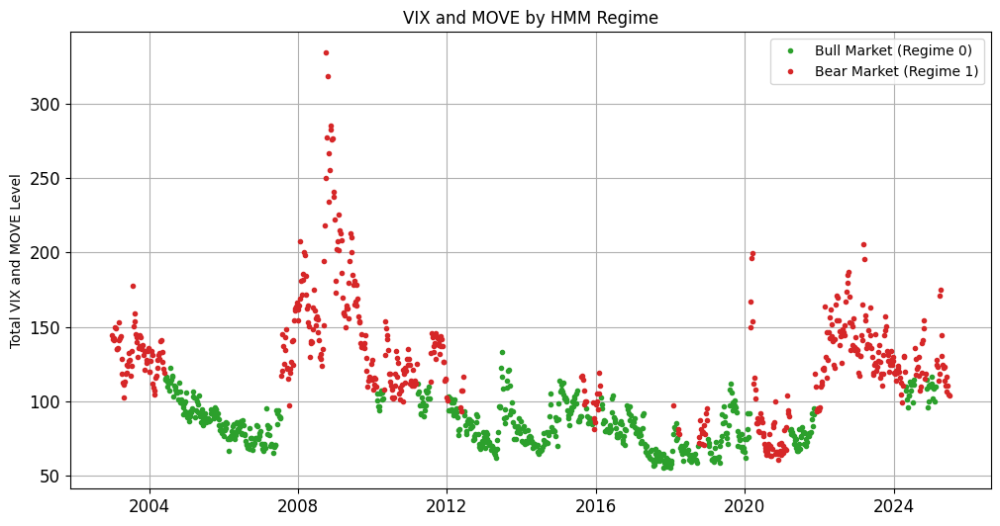

In [ ]:
# Extract and clean the data
vix_df = dfs["VIX Data.csv"].copy()
move_df = dfs["MOVE Data.csv"].copy()

vix_df['Date'] = pd.to_datetime(vix_df['Date'], dayfirst=True)
move_df['Date'] = pd.to_datetime(move_df['Date'], dayfirst=True)

# Filter for 2005 to 2025
vix_df = vix_df[(vix_df['Date'].dt.year >= 2003) & (vix_df['Date'].dt.year <= 2025)]
move_df = move_df[(move_df['Date'].dt.year >= 2003) & (move_df['Date'].dt.year <= 2025)]


# Extract just the 'Price' column and rename
vix_df = vix_df[['Date', 'Price']].rename(columns={"Price": "VIX"})
move_df = move_df[['Date', 'Price']].rename(columns={"Price": "MOVE"})

# Set the date as index
vix_df.set_index('Date', inplace=True)
move_df.set_index('Date', inplace=True)

# Combine and align
macro_df = pd.concat([vix_df, move_df], axis=1).dropna()
macro_df.index = macro_df.index - pd.Timedelta(days=2) # Move from Sunday to Friday

# Scale the features
scaler = StandardScaler().fit(macro_df)
X_scaled = scaler.transform(macro_df)

# Fit HMM
model = GaussianHMM(n_components=2, covariance_type="full", n_iter=1000, random_state=42)
model.fit(X_scaled)
regimes = model.predict(X_scaled)

# Stored combined VIX + MOVE and regimes in DataFrame
macro_df['Total'] = macro_df['VIX'] + macro_df['MOVE']
macro_df['Regime_full'] = regimes

# Compute regime-level average values to help interpret them
regime_summary = macro_df.groupby("Regime_full")[["VIX", "MOVE"]].mean()

print("Full Regime Table ")
display(macro_df)
print("Regime Summary Table")
display(regime_summary)


# Assign custom labels
vol_score = regime_summary["VIX"] + regime_summary["MOVE"]
sorted_regimes = vol_score.sort_values().index.tolist()

regime_name = {
    sorted_regimes[0]: "Bull Market",
    sorted_regimes[1]: "Bear Market"
}

# Colors
label_colors = {
    "Bull Market": '#2ca02c',
    "Bear Market": '#d62728'
}

# Plot regimes
plt.figure(figsize=(12, 6))
ax = plt.gca()
for i in range(model.n_components):
    mask = macro_df['Regime_full'] == i
    plt.plot(macro_df.index[mask], macro_df['Total'][mask], '.', label=f"{regime_name[i]} (Regime {i})", color=label_colors[regime_name[i]])
ax.tick_params(axis="both", which="major", labelsize=12)
plt.legend()
plt.title("VIX and MOVE by HMM Regime")
plt.ylabel("Total VIX and MOVE Level")
plt.grid(True)
plt.show()

,Bull Market,Bear Market
Date,,
2003-01-03,0.0000,1.0000
2003-01-10,0.0000,1.0000
2003-01-17,0.0000,1.0000
2003-01-24,0.0000,1.0000
2003-01-31,0.0000,1.0000
...,...,...
2025-05-30,0.2320,0.7680
2025-06-06,0.2520,0.7480
2025-06-13,0.3504,0.6496


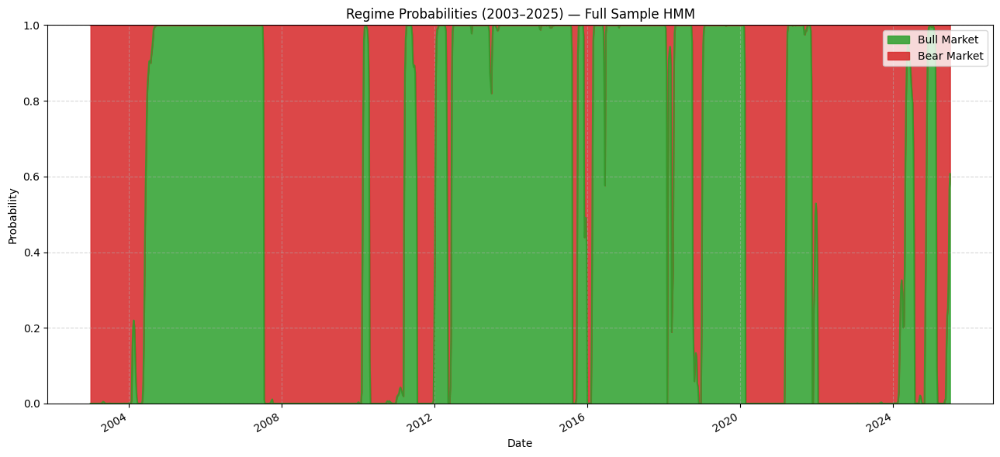

In [ ]:
# Standardize VIX & MOVE over the full period
scaler= StandardScaler()
X_scaled = scaler.fit_transform(macro_df[["VIX", "MOVE"]])

# Get regime probabilities for each week
regime_probs = model.predict_proba(X_scaled)
regime_probs_df = pd.DataFrame(
    regime_probs,
    index=macro_df.index,
    columns=[f"Regime_full {i}" for i in range(model.n_components)]
)

# Determine which regime is high or Bull Market
macro_df["Regime_full"] = model.predict(X_scaled)
regime_summary = macro_df.groupby("Regime_full")[["VIX", "MOVE"]].mean()
vol_score = regime_summary["VIX"] + regime_summary["MOVE"]
sorted_regimes = vol_score.sort_values().index.tolist()

# Rename columns to "Bull Market" and "Bear Market"
regime_name_map = {
    sorted_regimes[0]: "Bull Market",
    sorted_regimes[1]: "Bear Market"
}
regime_probs_df = regime_probs_df.rename(columns={f"Regime_full {i}": regime_name_map[i] for i in range(2)})
regime_probs_df = regime_probs_df.reindex(columns=["Bull Market", "Bear Market"])

# Display table
display(regime_probs_df.round(4))

# Plot stacked area chart of regime probabilities
plt.figure(figsize=(13, 6))
regime_probs_df.plot.area(
    stacked=True,
    ax=plt.gca(),
    alpha=0.85,
    color=["#2ca02c", "#d62728"]  # green = low, red = high
)

plt.title("Regime Probabilities (2003–2025) — Full Sample HMM")
plt.ylabel("Probability")
plt.xlabel("Date")
plt.ylim(0, 1)
plt.grid(True, linestyle="--", alpha=0.5)
plt.legend(loc="upper right")
plt.tight_layout()
plt.show()


# Identify Regimes Probability 2003 - 2019

Full Regime Table (2003–2019)


,VIX,MOVE,Total,Regime_train
Date,,,,
2003-01-03,24.32,120.02,144.34,0
2003-01-10,25.70,116.02,141.72,0
2003-01-17,31.51,109.41,140.92,0
2003-01-24,31.17,110.89,142.06,0
2003-01-31,34.01,115.49,149.50,0
...,...,...,...,...
2019-11-29,13.62,64.07,77.69,1
2019-12-06,12.63,56.44,69.07,1
2019-12-13,12.51,54.19,66.70,1



Regime Summary Table (2003–2019)


,VIX,MOVE
Regime_train,,
0,25.236445,112.039740
1,13.893407,67.951963


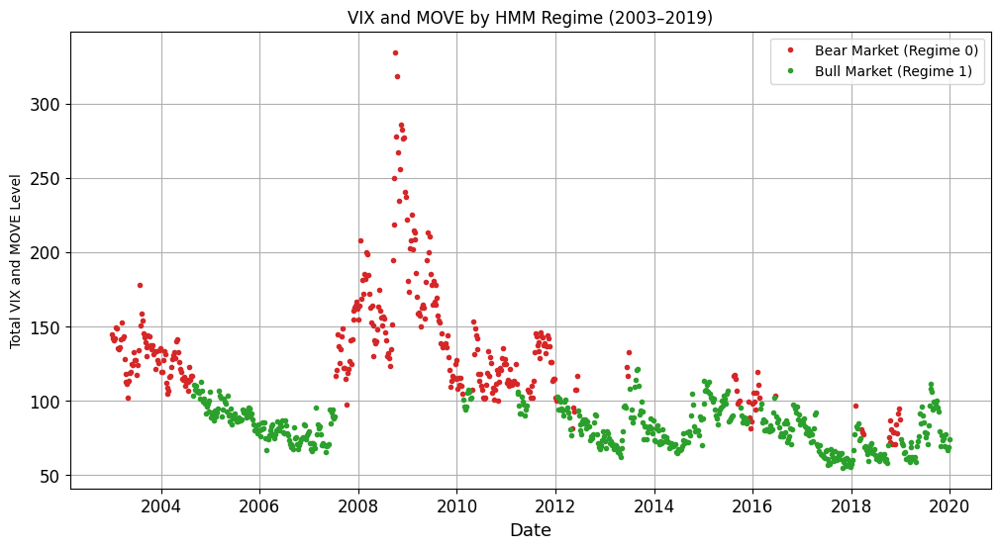

In [ ]:
# Extract and clean the data
vix_df_03_19 = dfs["VIX Data.csv"].copy()
move_df_03_19 = dfs["MOVE Data.csv"].copy()

vix_df_03_19['Date'] = pd.to_datetime(vix_df_03_19['Date'], dayfirst=True)
move_df_03_19['Date'] = pd.to_datetime(move_df_03_19['Date'], dayfirst=True)

# Filter for 2005 to 2025
vix_df_03_19 = vix_df_03_19[(vix_df_03_19['Date'].dt.year >= 2003) & (vix_df_03_19['Date'].dt.year < 2020)]
move_df_03_19 = move_df_03_19[(move_df_03_19['Date'].dt.year >= 2003) & (move_df_03_19['Date'].dt.year < 2020)]

# Extract just the 'Price' column and rename
vix_df_03_19 = vix_df_03_19[['Date', 'Price']].rename(columns={"Price": "VIX"})
move_df_03_19 = move_df_03_19[['Date', 'Price']].rename(columns={"Price": "MOVE"})

# Set the date as index
vix_df_03_19.set_index('Date', inplace=True)
move_df_03_19.set_index('Date', inplace=True)

# Combine and align
macro_df_03_19 = pd.concat([vix_df_03_19, move_df_03_19], axis=1).dropna()
macro_df_03_19.index = macro_df_03_19.index - pd.Timedelta(days=2) # Move from Sunday to Friday

# Scale the features
scaler_03_19 = StandardScaler().fit(macro_df_03_19)
X_scaled_03_19 = scaler_03_19.transform(macro_df_03_19)

# Fit HMM
model_03_19 = GaussianHMM(n_components=2, covariance_type="full", n_iter=1000, random_state=42)
model_03_19.fit(X_scaled_03_19)
regimes_03_19 = model_03_19.predict(X_scaled_03_19)

# Stored combined VIX + MOVE and regimes in DataFrame
macro_df_03_19['Total'] = macro_df_03_19['VIX'] + macro_df_03_19['MOVE']
macro_df_03_19['Regime_train'] = regimes_03_19

# Compute regime-level average values to help interpret them
regime_summary_03_19 = macro_df_03_19.groupby("Regime_train")[["VIX", "MOVE"]].mean()

print("Full Regime Table (2003–2019)")
display(macro_df_03_19)
print("\nRegime Summary Table (2003–2019)")
display(regime_summary_03_19)

# Assign custom labels
vol_score_03_19 = regime_summary_03_19["VIX"] + regime_summary_03_19["MOVE"]
sorted_regimes_03_19 = vol_score_03_19.sort_values().index.tolist()

regime_name_03_19 = {
    sorted_regimes_03_19[0]: "Bull Market",
    sorted_regimes_03_19[1]: "Bear Market"
}

# Colors
label_colors_03_19 = {
    "Bull Market": '#2ca02c',
    "Bear Market": '#d62728'
}

# Plot regimes
plt.figure(figsize=(12, 6))
ax = plt.gca()
for i in range(model_03_19.n_components):
    mask_03_19 = macro_df_03_19['Regime_train'] == i
    plt.plot(macro_df_03_19.index[mask_03_19], macro_df_03_19['Total'][mask_03_19], '.',
             label=f"{regime_name_03_19[i]} (Regime {i})", color=label_colors_03_19[regime_name_03_19[i]])
ax.tick_params(axis="both", which="major", labelsize=12)
plt.legend()
plt.title("VIX and MOVE by HMM Regime (2003–2019)")
plt.xlabel("Date", fontsize=13)
plt.ylabel("Total VIX and MOVE Level")
plt.grid(True)
plt.show()

,Bull Market,Bear Market
Date,,
2003-01-03,0.0000,1.0000
2003-01-10,0.0000,1.0000
2003-01-17,0.0000,1.0000
2003-01-24,0.0000,1.0000
2003-01-31,0.0000,1.0000
...,...,...
2019-11-29,1.0000,0.0000
2019-12-06,1.0000,0.0000
2019-12-13,1.0000,0.0000


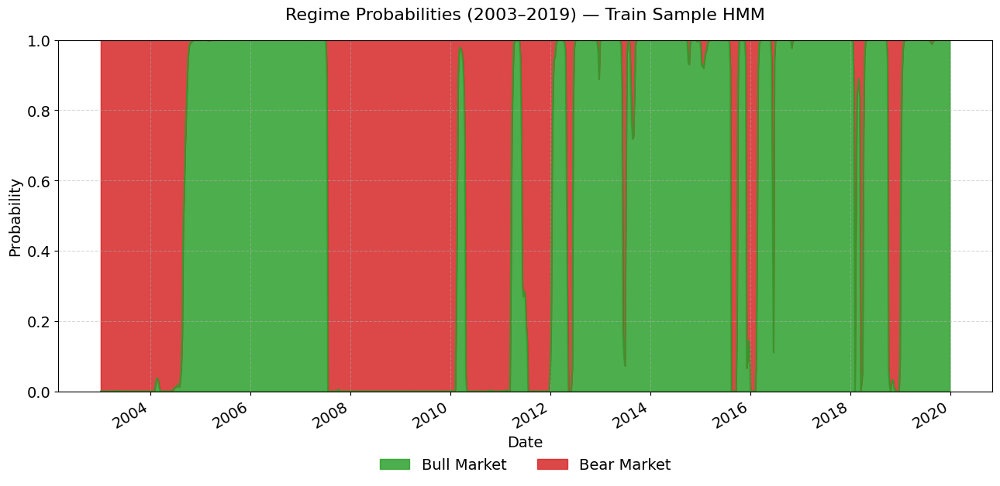

In [ ]:
# Standardize VIX & MOVE over the period
scaler_03_19 = StandardScaler()
X_scaled_03_19 = scaler_03_19.fit_transform(macro_df_03_19[["VIX", "MOVE"]])

# Fit HMM
model_03_19 = GaussianHMM(n_components=2, covariance_type="full", n_iter=1000, random_state=42)
model_03_19.fit(X_scaled_03_19)

# Get regime probabilities for each week
regime_probs_03_19 = model_03_19.predict_proba(X_scaled_03_19)
regime_probs_df_03_19 = pd.DataFrame(
    regime_probs_03_19,
    index=macro_df_03_19.index,
    columns=[f"Regime_train {i}" for i in range(model_03_19.n_components)]
)

# Step 4: Determine which regime is high or Bull Market
macro_df_03_19["Regime_train"] = model_03_19.predict(X_scaled_03_19)
regime_summary_03_19 = macro_df_03_19.groupby("Regime_train")[["VIX", "MOVE"]].mean()
vol_score_03_19 = regime_summary_03_19["VIX"] + regime_summary_03_19["MOVE"]
sorted_regimes_03_19 = vol_score_03_19.sort_values().index.tolist()

# Step 5: Rename columns to "Bull Market" and "Bear Market"
regime_name_map_03_19 = {
    sorted_regimes_03_19[0]: "Bull Market",
    sorted_regimes_03_19[1]: "Bear Market"
}

regime_probs_df_03_19 = regime_probs_df_03_19.rename(columns={f"Regime_train {i}": regime_name_map_03_19[i] for i in range(2)})
regime_probs_df_03_19 = regime_probs_df_03_19.reindex(columns=["Bull Market", "Bear Market"])

# Display table
display(regime_probs_df_03_19.round(4))

# Plot stacked area chart of regime probabilities
plt.figure(figsize=(13, 6))
regime_probs_df_03_19.plot.area(
    stacked=True,
    ax=plt.gca(),
    alpha=0.85,
    color=["#2ca02c", "#d62728"]  # green = low, red = high
)

plt.title("Regime Probabilities (2003–2019) — Train Sample HMM",fontsize=16, y=1.04)
plt.ylabel("Probability", fontsize=14)
plt.xlabel("Date", fontsize=14)
plt.ylim(0, 1)
plt.grid(True, linestyle="--", alpha=0.5)
plt.legend(loc="upper right", fontsize=12)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.tight_layout()

# Move the legend to the bottom center
plt.legend(
    loc="upper center",
    bbox_to_anchor=(0.5, -0.15),  # (horizontal center, below plot)
    ncol=2,            # Number of columns (for horizontal legend)
    fontsize=14,
    frameon=False
)

plt.show()

In [ ]:

# ----------------------------------------------------------------
# 1)  Mapping dictionaries for each fit
regime_labels = ["Bull Market", "Bear Market"]

# ----------------------------------------------------------------
# 2)  Weekly ground-truth series that spans **every Friday**
#     and uses the FULL-sample fit  (no label flip possible)
# ----------------------------------------------------------------
weekly_regime_full = (
    macro_df["Regime_full"]            # untouched numeric states
      .map(regime_name)                # map with the *matching* dictionary
      .resample("W-FRI")
      .agg(lambda s: s.mode().iat[0] if not s.mode().empty else np.nan)
      .ffill()                         # fill market holidays
      .astype(pd.CategoricalDtype(categories=regime_labels, ordered=True))
)

# ----------------------------------------------------------------
# 3)  Helpers  (row probs, transition matrix, rolling forecast)
# ----------------------------------------------------------------
import numpy as np, pandas as pd
from sklearn.metrics import log_loss, brier_score_loss


# --- Helpers ---
def _row_probs(labels: pd.Series, states) -> np.ndarray:
    counts = labels.value_counts().reindex(states, fill_value=0).astype(float)
    s = counts.sum()
    return (counts / s).to_numpy() if s else np.ones(len(states)) / len(states)

def _trans_matrix(labels: pd.Series, states) -> np.ndarray:  # alpha: float = 1e-6, add this in case need smoothing
    tc = (pd.crosstab(labels.shift(), labels)
            .reindex(index=states, columns=states, fill_value=0)
            .astype(float))
    # tc += alpha # uncomment this for smoothing
    tm = tc.div(tc.sum(axis=1), axis=0).fillna(0.0)
    return tm.to_numpy()

def _forecast_with_window(W, weekly_labels, forecast_dates, states=regime_labels):
    """Rolling Markov with a fixed window length W (weeks)."""
    labels_series = weekly_labels.loc[: "2019-12-31"].copy()   # history
    preds, actual = [], []
    for i, t in enumerate(forecast_dates):
        prev_fr = labels_series.index[labels_series.index < t].max()
        win_lbl = labels_series.copy() if i == 0 else labels_series.loc[:prev_fr].iloc[-W:]
        p_t, T_t = _row_probs(win_lbl, states), _trans_matrix(win_lbl, states)
        p_next = p_t @ T_t
        preds.append(p_next)
        actual.append(int(weekly_labels.loc[t] == "Bear Market"))
        labels_series.loc[t] = states[int(p_next.argmax())]
    return np.vstack(preds), np.array(actual)

def evaluate_windows(candidate_W, weekly_labels, forecast_dates):
    rows = []
    for W in candidate_W:
        preds, actual = _forecast_with_window(W, weekly_labels, forecast_dates)
        rows.append((W,
                     log_loss(actual, preds, labels=[0, 1]),
                     brier_score_loss(actual, preds[:, 1])))
    return (pd.DataFrame(rows, columns=["W_weeks", "NLL", "Brier"])
              .set_index("W_weeks")
              .sort_values("NLL"))

# ----------------------------------------------------------------
# 4)  Build the descending grid: full 2003-19 span, minus 1 year steps
# ----------------------------------------------------------------
forecast_dates = pd.date_range("2020-01-03", "2025-06-27", freq="W-FRI")
max_weeks = len(macro_df_03_19)                # already weekly: ≈ 887
candidate_W = list(range(max_weeks, 51, -52))  # 887, 835, …, 52
print("Candidate windows:", candidate_W)

score_df = evaluate_windows(candidate_W, weekly_regime_full, forecast_dates)
display(score_df.style.format({"NLL":"{:.4f}", "Brier":"{:.4f}"}))

best_W = score_df["NLL"].idxmin()
print(f"🏆  Selected rolling window: {best_W} weeks")


Candidate windows: [886, 834, 782, 730, 678, 626, 574, 522, 470, 418, 366, 314, 262, 210, 158, 106, 54]


,NLL,Brier
W_weeks,,
886,1.0401,0.4096
834,1.0627,0.4175
782,1.1121,0.4327
730,1.2307,0.4678
678,1.3928,0.5073
626,1.5924,0.5560
574,1.7758,0.5994
522,1.8804,0.6254
470,1.9634,0.6433


🏆  Selected rolling window: 886 weeks


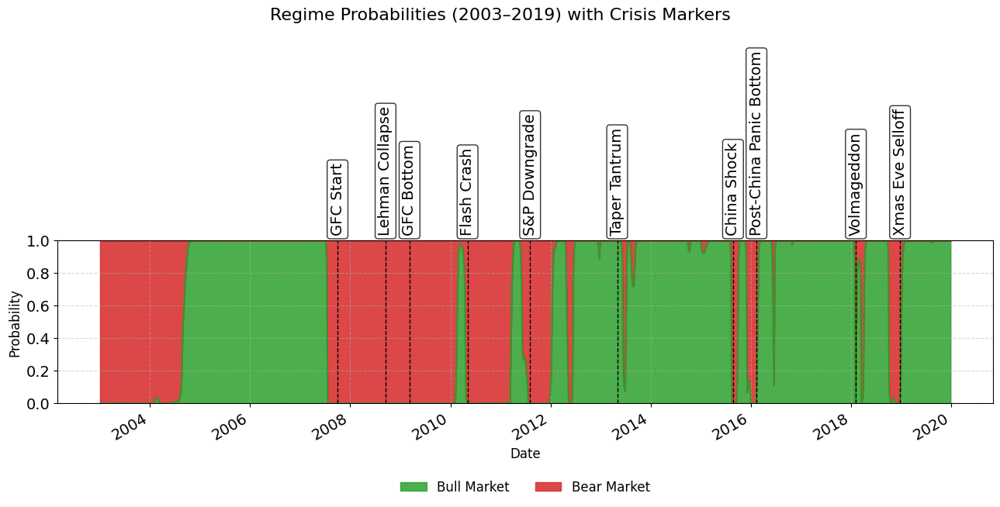

In [ ]:
# Plot stacked area chart of regime probabilities
fig, ax1 = plt.subplots(figsize=(13, 6))

# Plot regime probabilities
regime_probs_df_03_19.plot.area(
    stacked=True,
    ax=ax1,
    alpha=0.85,
    color=["#2ca02c", "#d62728"]
)

# Define crisis periods with labels (for vertical lines + labels)
crisis_events = [
    ("2007-10-01", "GFC Start"),
    ("2008-09-15", "Lehman Collapse"),
    ("2009-03-09", "GFC Bottom"),
    ("2010-05-06", "Flash Crash"),
    ("2011-08-05", "S&P Downgrade"),
    ("2013-05-01", "Taper Tantrum"),
    ("2015-08-24", "China Shock"),
    ("2016-02-11", "Post-China Panic Bottom"),
    ("2018-02-05", "Volmageddon"),
    ("2018-12-24", "Xmas Eve Selloff"),
]

# Add vertical dashed lines and labels
for date_str, label in crisis_events:
    event_date = pd.to_datetime(date_str)
    ax1.axvline(event_date, color="black", linestyle="--", linewidth=1)
    ax1.text(event_date, 1.03, label, rotation=90, ha='center', va='bottom',
             fontsize=14, bbox=dict(boxstyle="round,pad=0.2", fc="white", ec="black", alpha=0.8))

# Clean up legend to avoid duplicates
handles, labels = ax1.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax1.legend(by_label.values(), by_label.keys(), loc="upper right")

# Final plot settings
fig.suptitle("Regime Probabilities (2003–2019) with Crisis Markers", fontsize=16, y=1.)
ax1.set_ylabel("Probability", fontsize=12)
ax1.set_xlabel("Date", fontsize=12)
ax1.set_ylim(0, 1)
ax1.grid(True, linestyle="--", alpha=0.5)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.tight_layout()

# Move the legend to the bottom center
plt.legend(
    loc="upper center",
    bbox_to_anchor=(0.5, -0.40),  # (horizontal center, below plot)
    ncol=2,            # Number of columns (for horizontal legend)
    fontsize=12,
    frameon=False
)

plt.show()

# Predicting Future Regime 2020 - 06/2025

In [ ]:
# --- Define windows ---
train_start, train_end = "2003-01-01", "2019-12-31"

regime_labels_03_19 = ["Bull Market", "Bear Market"]

# --- Map numeric regimes to labels once ---
macro_df_03_19["Regime with Labels"] = macro_df_03_19["Regime_train"].map(regime_name_03_19)
macro_df_03_19["Regime with Labels"] = pd.Categorical(
    macro_df_03_19["Regime with Labels"],
    categories=["Bull Market", "Bear Market"],
    ordered=True
)

# --- Training sample (2003–2019): state probs + transition probs ---
regime_03_19 = macro_df_03_19.loc[train_start:train_end, "Regime with Labels"].dropna()

In [ ]:
# --- Build weekly labeled regimes for 2003–2019
weekly_regime_03_19 = (
    macro_df_03_19["Regime_train"]
    .map(regime_name_03_19)
    .resample("W-FRI")
    .agg(lambda s: s.mode().iat[0] if not s.mode().empty else np.nan)
    .dropna()
).astype(pd.CategoricalDtype(categories=regime_labels_03_19, ordered=True))

# Rolling window length from the WEEKLY series
W_hmm = best_W

# Start labels with the weekly history
labels_series = weekly_regime_03_19.copy()

# Forecast dates (Fridays)
forecast_dates = pd.date_range(start="2020-01-01", end="2025-06-30", freq="W-FRI")

# --- Rolling forecast from 2020-01-03 onward ---
rows = []
row_probs_all = {}
trans_probs_all = {}

for i, t in enumerate(forecast_dates):
    prev_friday = labels_series.index[labels_series.index < t].max()

    # For the first forecast step, use entire pre-2020 history
    if i == 0:
        window_labels = labels_series.copy()
    else:
        window_labels = labels_series.loc[:prev_friday].iloc[-W_hmm:]

    # Compute rolling regime probabilities and transition matrix
    p_t = _row_probs(window_labels, regime_labels_03_19)  # shape (2,)
    T_t = _trans_matrix(window_labels, regime_labels_03_19)  # shape (2,2)
    p_next = p_t @ T_t  # shape (2,)

    # Save probabilities
    rows.append((t, p_next[0], p_next[1]))

    # Store row probs and transition matrix
    row_probs_all[t] = pd.Series(p_t, index=regime_labels_03_19, name=t)
    trans_probs_all[t] = pd.DataFrame(T_t, index=regime_labels_03_19, columns=regime_labels_03_19)

    # Append MAP label for the next step
    labels_series.loc[t] = regime_labels_03_19[int(np.argmax(p_next))]
    labels_series = labels_series.astype(pd.CategoricalDtype(categories=regime_labels_03_19, ordered=True))


# Rolling Window
print(f"\nRolling window length: {W_hmm} weeks")

# Combine row probabilities (each row is one forecast date)
row_probs_all_df = pd.DataFrame(row_probs_all).T
row_probs_all_df.index.name = "Date"
row_probs_all_df.columns.name = "Regime"
print("\nRolling Row Probabilities:")
display(row_probs_all_df)

# Combine transition matrices (each block is one forecast date)
trans_probs_all_df = pd.concat(trans_probs_all, names=["Date", "From"])
trans_probs_all_df.columns.name = "To"
print("\nRolling Transition Matrices:")
display(trans_probs_all_df)

# Combine forecast probabilities
regime_probs_pred_df = pd.DataFrame(rows, columns=["Date"] + regime_labels_03_19).set_index("Date")
print("\nForecasted Regime Probabilities (2020–2025) from Rolling Markov Model")
display(regime_probs_pred_df)



Rolling window length: 886 weeks

Rolling Row Probabilities:


Regime,Bull Market,Bear Market
Date,,
2020-01-03,0.609481,0.390519
2020-01-10,0.610609,0.389391
2020-01-17,0.611738,0.388262
2020-01-24,0.612867,0.387133
2020-01-31,0.613995,0.386005
...,...,...
2025-05-30,0.757336,0.242664
2025-06-06,0.758465,0.241535
2025-06-13,0.759594,0.240406



Rolling Transition Matrices:


To                      Bull Market  Bear Market
Date       From                                 
2020-01-03 Bull Market     0.979592     0.020408
           Bear Market     0.034682     0.965318
2020-01-10 Bull Market     0.979630     0.020370
           Bear Market     0.034783     0.965217
2020-01-17 Bull Market     0.979667     0.020333
...                             ...          ...
2025-06-13 Bear Market     0.051643     0.948357
2025-06-20 Bull Market     0.985141     0.014859
           Bear Market     0.051887     0.948113
2025-06-27 Bull Market     0.985163     0.014837
           Bear Market     0.052133     0.947867

[574 rows x 2 columns]


Forecasted Regime Probabilities (2020–2025) from Rolling Markov Model


,Bull Market,Bear Market
Date,,
2020-01-03,0.610586,0.389414
2020-01-10,0.611715,0.388285
2020-01-17,0.612844,0.387156
2020-01-24,0.613973,0.386027
2020-01-31,0.615101,0.384899
...,...,...
2025-05-30,0.758448,0.241552
2025-06-06,0.759577,0.240423
2025-06-13,0.760706,0.239294


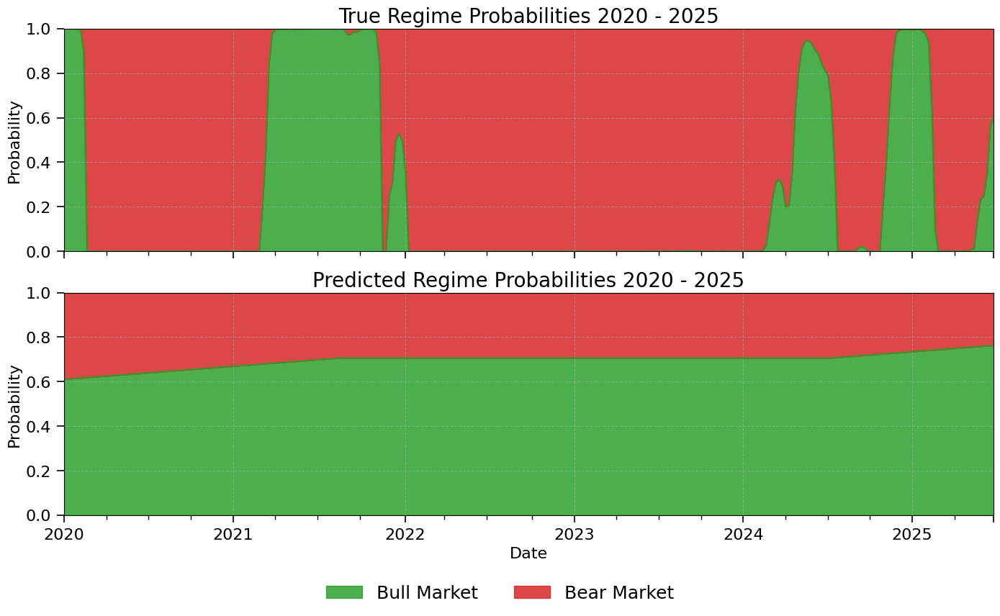

In [ ]:
# Filter regime probabilities to 2020–2025
true_probs_2020_2025 = regime_probs_df.loc["2020-01-01":"2025-06-30"]
pred_probs_2020_2025 = regime_probs_pred_df.loc["2020-01-01":"2025-06-30"]

# Ensure consistent column order
true_probs_2020_2025 = true_probs_2020_2025[pred_probs_2020_2025.columns]

# Define consistent color mapping
regime_colors = {
    "Bull Market": "#2ca02c",
    "Bear Market": "#d62728"
}
color_list = [regime_colors[col] for col in pred_probs_2020_2025.columns]

# Create vertically stacked plots
fig, axs = plt.subplots(2, 1, figsize=(14, 8), sharex=True, sharey=True)

# True probabilities Plot
true_probs_2020_2025.plot.area(
    ax=axs[0], stacked=True, alpha=0.85, color=color_list
)
axs[0].set_title("True Regime Probabilities 2020 - 2025", fontsize=20)
axs[0].set_ylabel("Probability", fontsize=16)
axs[0].grid(True, linestyle="--", alpha=0.5)
axs[0].set_ylim(0, 1)

# Gap
print()

# Predicted probabilities Plot
pred_probs_2020_2025.plot.area(
    ax=axs[1], stacked=True, alpha=0.85, color=color_list
)
axs[1].set_title("Predicted Regime Probabilities 2020 - 2025", fontsize=20)
axs[1].set_xlabel("Date", fontsize=16)
axs[1].set_ylabel("Probability", fontsize=16)
axs[1].grid(True, linestyle="--", alpha=0.5)
axs[1].set_ylim(0, 1)


# Make tick-label numbers and tick marks bigger on both subplots
for ax in axs:
    ax.tick_params(axis="both", which="major",
                   labelsize=16,   # bigger numbers
                   length=7, width=1.2, pad=6)  # bigger tick marks + spacing
    ax.tick_params(axis="both", which="minor",
                   labelsize=14, length=4, width=1.0)

# One shared legend, moved further down
handles, labels = axs[0].get_legend_handles_labels()
for ax in axs:
    leg = ax.get_legend()
    if leg is not None:
        leg.remove()

fig.legend(handles, labels,
           loc="lower center",
           ncol=len(regime_labels),
           frameon=False,
           fontsize=18,
           bbox_to_anchor=(0.5, -0.08))

# Leave space at the bottom for the legend
fig.subplots_adjust(bottom=0.18)

# Final layout
plt.tight_layout()
plt.show()


# Regime Expected Return 2010 - 2019




In [ ]:
# Build a labeled regime series
if "Regime with Labels" in macro_df_03_19.columns:
    regime_series = macro_df_03_19["Regime with Labels"].copy()
else:
    regime_series = macro_df_03_19["Regime_train"].map(regime_name)

# Collapse to weekly Friday by taking the mode (most frequent) within each week
weekly_regime = (
    regime_series.resample("W-FRI")
    .agg(lambda s: s.mode().iat[0] if not s.mode().empty else np.nan)
    .rename("Regime_train")
)

# Weekly return 2010 - 2019
weekly_returns = weekly_prices.pct_change().dropna() # Full from 2003 to 06/2025
returns_10_19 = weekly_returns.loc["2010-01-01":"2019-12-31"] # Slice 2003 to 2019

# Join the label
returns_10_19_labeled = returns_10_19.join(weekly_regime, how="left")

# Make the label an ordered categorical
returns_10_19_labeled["Regime_train"] = pd.Categorical(
    returns_10_19_labeled["Regime_train"],
    categories=["Bull Market", "Bear Market"],
    ordered=True
)

# Split
low_tbl  = returns_10_19_labeled.loc[returns_10_19_labeled["Regime_train"]=="Bull Market"].drop(columns="Regime_train")
high_tbl = returns_10_19_labeled.loc[returns_10_19_labeled["Regime_train"]=="Bear Market"].drop(columns="Regime_train")

low_tbl_percent  = low_tbl * 100
high_tbl_percent = high_tbl * 100

print("=== Weekly Returns — Bull Market (2010–2019) ===")
display(low_tbl_percent.head().style.format("{:.4f}%"))
print("\n=== Weekly Returns — Bear Market (2010–2019) ===")
display(high_tbl_percent.head().style.format("{:.4f}%"))

=== Weekly Returns — Bull Market (2010–2019) ===


,AGZ.P,IEI.O,SHY.O,IEF.O,MUB,MBB.O,TLT.O,VCIT.O,AGG
Date,,,,,,,,,
2010-02-19 00:00:00,-0.4055%,-0.5702%,-0.1675%,-0.6103%,-0.0097%,-0.2983%,-0.8205%,-0.1856%,-0.0192%
2010-02-26 00:00:00,0.7588%,0.8880%,0.2877%,1.2560%,0.3387%,0.3835%,2.4818%,1.0627%,0.5096%
2010-03-05 00:00:00,-0.3949%,-0.3474%,-0.2390%,-0.5017%,0.0000%,-0.1304%,-1.5272%,0.2037%,-0.1339%
2010-03-12 00:00:00,-0.0922%,-0.2503%,-0.1078%,-0.1108%,0.1640%,0.1772%,0.2326%,0.4525%,0.1197%
2010-03-19 00:00:00,-0.0231%,-0.0986%,-0.0480%,0.1109%,0.0289%,0.0838%,0.8621%,0.3917%,0.2248%



=== Weekly Returns — Bear Market (2010–2019) ===


,AGZ.P,IEI.O,SHY.O,IEF.O,MUB,MBB.O,TLT.O,VCIT.O,AGG
Date,,,,,,,,,
2010-01-08 00:00:00,0.4090%,0.3631%,0.3373%,0.4063%,0.2409%,0.5378%,-0.6675%,1.2418%,0.4555%
2010-01-15 00:00:00,0.2407%,0.7236%,0.2285%,1.2253%,0.2937%,0.4880%,2.0047%,0.5144%,0.5841%
2010-01-22 00:00:00,0.4155%,0.4221%,0.1918%,0.6219%,-0.0774%,0.1961%,1.0101%,0.2624%,0.1865%
2010-01-29 00:00:00,-0.0367%,0.1878%,0.0359%,0.0993%,-0.0775%,0.1678%,0.3370%,-0.5889%,0.1819%
2010-02-05 00:00:00,-0.0092%,0.2678%,0.0957%,0.1544%,0.1842%,0.0000%,-0.3575%,0.0790%,-0.2389%


In [ ]:
# Averages by regime
low_mean  = low_tbl.mean(skipna=True)
high_mean = high_tbl.mean(skipna=True)

# Combine means into a single DataFrame
expected_returns_by_regime = pd.DataFrame({
    "Bull Market": low_mean,
    "Bear Market": high_mean,
})

expected_returns_by_regime = expected_returns_by_regime.T

expected_returns_by_regime_pct = expected_returns_by_regime * 100

# Display
display(expected_returns_by_regime_pct.head().style.format("{:.4f}%"))

,AGZ.P,IEI.O,SHY.O,IEF.O,MUB,MBB.O,TLT.O,VCIT.O,AGG
Bull Market,0.0040%,0.0019%,-0.0022%,0.0038%,0.0190%,0.0012%,0.0219%,0.0527%,0.0092%
Bear Market,0.0440%,0.0976%,0.0218%,0.1673%,0.0342%,0.0132%,0.3191%,0.0007%,0.0411%


# Estimated Returns from 2020 to 2025

In [ ]:
rolling_expected_return = returns_10_19_labeled

# Assets
asset_columns = portfolio_tickers + ["AGG"]

# Fixed window length
fixed_len = len(rolling_expected_return)

# Fallback regime means (from 2010–2019 split) if a regime is missing in the window
fallback_mu = expected_returns_by_regime.loc[["Bull Market","Bear Market"], asset_columns].astype(float)

# Forecast date range from first post-history Friday to 2025-06-30
pred_probs_2020_2025 = pred_probs_2020_2025.sort_index()
start_after_macro = macro_df_03_19.index.max() + pd.offsets.Week(weekday=4)  # next Friday
first_dt = pred_probs_2020_2025.index[pred_probs_2020_2025.index.searchsorted(start_after_macro, side="left")]
end_dt   = pd.Timestamp("2025-06-30")

forecast_idx = pred_probs_2020_2025.index[(pred_probs_2020_2025.index >= first_dt) &
                                          (pred_probs_2020_2025.index <= end_dt)]

# Collect each week's ER row
expected_returns_forecast = []

# Collect low and high returns
mu_low_history  = []
mu_high_history = []

for dt in forecast_idx:
    # 1) Current week's predicted regime probabilities
    p = pred_probs_2020_2025.loc[dt, ["Bull Market","Bear Market"]]

    # 2) Recompute rolling regime means from the current window
    low_tbl  = rolling_expected_return.loc[rolling_expected_return["Regime_train"]=="Bull Market",  asset_columns]
    high_tbl = rolling_expected_return.loc[rolling_expected_return["Regime_train"]=="Bear Market", asset_columns]

    mu_low  = low_tbl.mean(skipna=True)
    mu_high = high_tbl.mean(skipna=True)

    mu_low_history.append(mu_low.reindex(asset_columns).rename(dt))
    mu_high_history.append(mu_high.reindex(asset_columns).rename(dt))

    # If a regime is absent in the window, fall back to long-run means for that regime
    if mu_low.isna().all():
        mu_low = fallback_mu.loc["Bull Market"]
    if mu_high.isna().all():
        mu_high = fallback_mu.loc["Bear Market"]

    mu_t = pd.DataFrame({"Bull Market": mu_low, "Bear Market": mu_high}).T.reindex(["Bull Market","Bear Market"])

    # 3) Expected returns for dt: p · mu_t  (safe broadcast)
    er_next = mu_t.T.mul(p).sum(axis=1).reindex(asset_columns)

    # 4) Assign label (MAP)
    label_next = "Bear Market" if float(p["Bear Market"]) > float(p["Bull Market"]) else "Bull Market"

    # 5) Append row and keep constant length
    row = er_next.to_frame().T
    row.index = pd.DatetimeIndex([dt])
    row["Regime_train"] = pd.Categorical([label_next], categories=["Bull Market","Bear Market"], ordered=True)
    row = row.reindex(columns=rolling_expected_return.columns)

    rolling_expected_return = pd.concat([rolling_expected_return, row])
    rolling_expected_return = rolling_expected_return[~rolling_expected_return.index.duplicated(keep="last")]
    rolling_expected_return = rolling_expected_return.tail(fixed_len)

    # 6) Save the forecast row (with label)
    expected_returns_forecast.append(row)


mu_low_df  = pd.DataFrame(mu_low_history).sort_index()
mu_high_df = pd.DataFrame(mu_high_history).sort_index()

# print("\nRolling per-regime means — Bull Market:")
# display(mu_low_df)

# print("\nRolling per-regime means — Bear Market:")
# display(mu_high_df)

# Final forecast path (one row per forecasted Friday)
expected_returns_forecast = pd.concat(expected_returns_forecast)
numeric_cols = expected_returns_forecast.select_dtypes(include=np.number).columns
expected_returns_forecast_pct = expected_returns_forecast
expected_returns_forecast_pct[numeric_cols] = expected_returns_forecast[numeric_cols] * 100

print("\nFinal Forecast path:")
display(expected_returns_forecast_pct.head().style.format({col: "{:.4f}%" for col in numeric_cols}))



Final Forecast path:


,AGZ.P,IEI.O,SHY.O,IEF.O,MUB,MBB.O,TLT.O,VCIT.O,AGG,Regime_train
2020-01-03 00:00:00,0.0195%,0.0392%,0.0071%,0.0675%,0.0249%,0.0058%,0.1377%,0.0324%,0.0216%,Bull Market
2020-01-10 00:00:00,0.0184%,0.0384%,0.0062%,0.0667%,0.0243%,0.0043%,0.1405%,0.0288%,0.0204%,Bull Market
2020-01-17 00:00:00,0.0178%,0.0364%,0.0055%,0.0634%,0.0235%,0.0028%,0.1353%,0.0272%,0.0187%,Bull Market
2020-01-24 00:00:00,0.0166%,0.0354%,0.0050%,0.0619%,0.0238%,0.0023%,0.1330%,0.0264%,0.0182%,Bull Market
2020-01-31 00:00:00,0.0169%,0.0350%,0.0049%,0.0620%,0.0241%,0.0018%,0.1328%,0.0282%,0.0178%,Bull Market


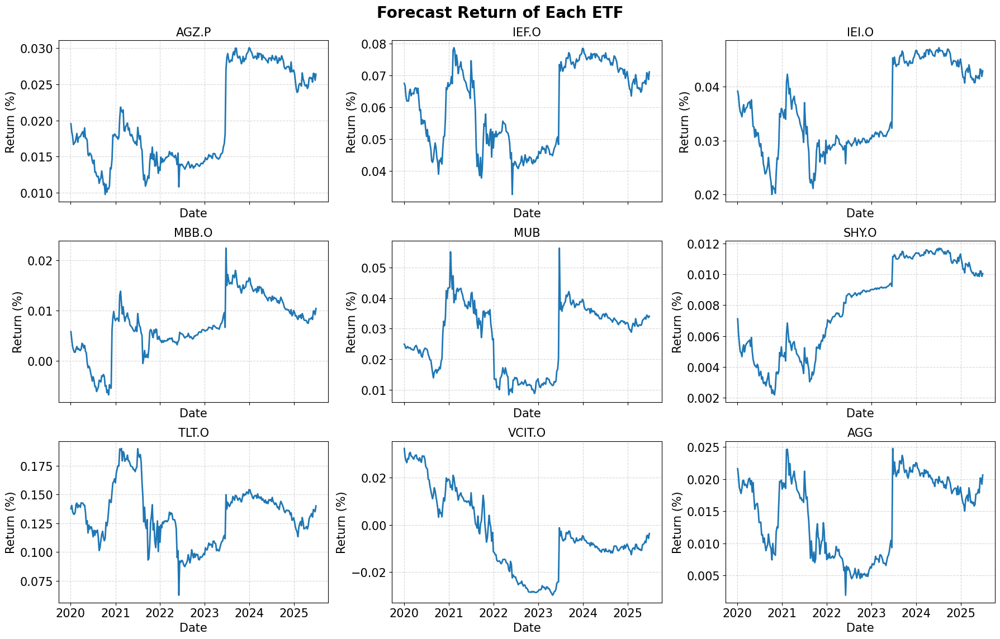

In [ ]:
import matplotlib.pyplot as plt

selected_assets = asset_columns
n_assets = len(selected_assets)
cols = 3
rows = (n_assets + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(18, 4 * rows), sharex=True)
axes = axes.flatten()

for i, asset in enumerate(selected_assets):
    ax = axes[i]
    ax.plot(expected_returns_forecast_pct.index, expected_returns_forecast_pct[asset], linewidth=2)
    ax.set_title(f"{asset}", fontsize=15)
    ax.set_xlabel("Date", fontsize=15)
    ax.set_ylabel("Return (%)", fontsize=15)
    ax.tick_params(axis="both", labelsize=15)
    ax.grid(True, linestyle="--", alpha=0.5)

# Hide unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout(rect=[0, 0.03, 1, 0.96])
fig.suptitle("Forecast Return of Each ETF", fontsize=20, weight="bold", y=0.98)
plt.show()


# Equilibrium Portfolio as 2019

In [ ]:
# reload the correct sheet only
dfs["ETFs Price.xlsx"] = pd.read_excel(
    "ETFs Price.xlsx",
    sheet_name="Net Assets",
)

# Drop the first rows
net_assets = dfs["ETFs Price.xlsx"].copy().iloc[1:].reset_index(drop=True)

# Original first column is the date string; rename it for clarity
net_assets = net_assets.rename(columns={"Unnamed: 0": "Date"})

# Convert the Date column to datetime and set as index
net_assets["Date"] = pd.to_datetime(net_assets["Date"])
net_assets = net_assets.set_index("Date")

# All values are strings right now; convert to numeric
net_assets =net_assets.apply(pd.to_numeric, errors="coerce")

display(net_assets)

,AGZ.P,IEI.O,SHY.O,IEF.O,MUB,MBB.O,TLT.O,VCIT.O,AGG
Date,,,,,,,,,
2010-01-01,257.8999,869.2000,7667.098,2553.4,1610.00,1758.90,2347.70,37.20,11234.0
2010-01-08,257.8999,869.2000,7667.098,2553.4,1610.00,1758.90,2347.70,37.20,11234.0
2010-01-15,257.8999,869.2000,7667.098,2553.4,1610.00,1758.90,2347.70,37.20,11234.0
2010-01-22,257.8999,869.2000,7667.098,2553.4,1610.00,1758.90,2347.70,37.20,11234.0
2010-01-29,260.3999,862.0999,7430.500,2646.0,1636.40,1795.20,2241.60,68.00,11341.2
...,...,...,...,...,...,...,...,...,...
2025-05-30,611.2107,15592.9600,24257.050,34938.2,38772.45,38227.93,50897.13,53150.84,124325.6
2025-06-06,611.2107,15592.9600,24257.050,34938.2,38772.45,38227.93,50897.13,53150.84,124325.6
2025-06-13,611.2107,15592.9600,24257.050,34938.2,38772.45,38227.93,50897.13,53150.84,124325.6


,Net Assets ($B),Weight (%)
AGZ.P,0.586590,0.467768
IEI.O,9.824277,7.834221
MUB,15.033980,11.988620
TLT.O,17.532320,13.980884
SHY.O,17.574590,14.014591
IEF.O,19.275480,15.370940
MBB.O,20.137690,16.058497
VCIT.O,25.437160,20.284479



📦 Total Net Assets of Portfolio: $125.40B
📦 Total Net Assets of Benchmark: $67.16B



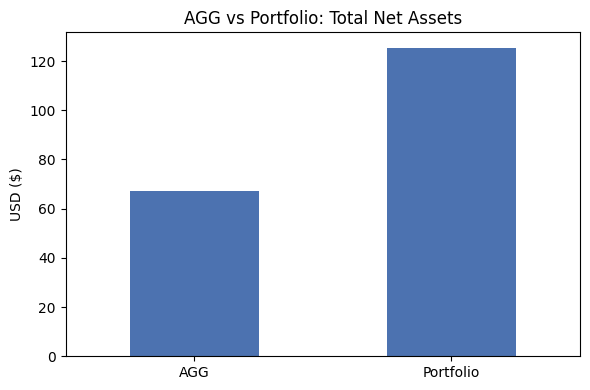

In [ ]:
# Net assets 2019
net_assets_2019 = net_assets.loc[: "2019-12-31"]

# Get the final asset data and convert to billions
latest_assets = net_assets_2019.iloc[-1].dropna() / 1000

# Separate benchmark figure
agg_assets = latest_assets.get("AGG", np.nan)
portfolio_assets = latest_assets.drop("AGG", errors="ignore")

# Create DataFrame and Compute Weights
assets_df = portfolio_assets.to_frame(name="Net Assets ($B)")
assets_df["Weight"] = assets_df["Net Assets ($B)"] / assets_df["Net Assets ($B)"].sum()
assets_df["Weight (%)"] = assets_df["Weight"] * 100
assets_df["Sector"] = assets_df.index.map(sectors)
assets_df["Color"] = assets_df["Sector"].map(sector_colors).fillna("#999999")  # fallback to grey

# Sort for Display
assets_df = assets_df.sort_values("Weight (%)")

display(assets_df[["Net Assets ($B)","Weight (%)"]])
print()

# Compare with portfolio
portfolio_total = assets_df["Net Assets ($B)"].sum()
print(f"📦 Total Net Assets of Portfolio: ${portfolio_total:.2f}B")
print(f"📦 Total Net Assets of Benchmark: ${agg_assets:.2f}B")
print()

# Visual comparison
comparison_df = pd.DataFrame({
    "AGG": [agg_assets],
    "Portfolio": [portfolio_total]
}, index=["Net Assets"])

comparison_df.T.plot.bar(
    legend=False,
    figsize=(6, 4),
    color=["#4C72B0", "#55A868"]
)

plt.title("AGG vs Portfolio: Total Net Assets")
plt.ylabel("USD ($)")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

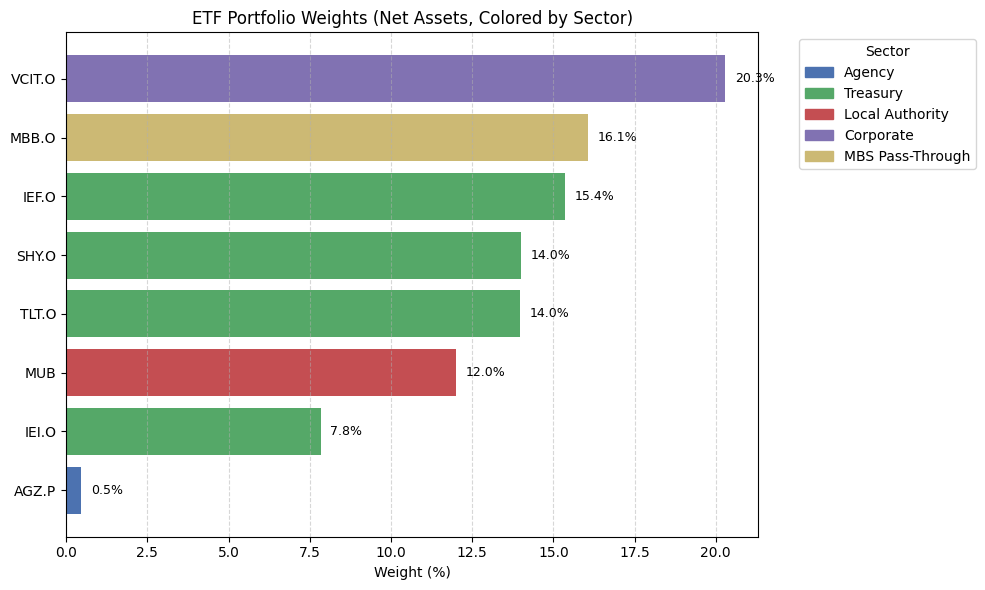

In [ ]:
# Plot Horizontal Bar Chart
plt.figure(figsize=(10, 6))
bars = plt.barh(
    assets_df.index,
    assets_df["Weight (%)"],
    color=assets_df["Color"]
)

for bar in bars:
    width = bar.get_width()
    plt.text(width + 0.3, bar.get_y() + bar.get_height() / 2,
             f"{width:.1f}%", va="center", fontsize=9)

plt.xlabel("Weight (%)")
plt.title("ETF Portfolio Weights (Net Assets, Colored by Sector)")
plt.grid(axis="x", linestyle="--", alpha=0.5)

# Add sector legend
handles = [
    plt.Rectangle((0,0),1,1, color=color)
    for sector, color in sector_colors.items()
]
labels = list(sector_colors.keys())
plt.legend(handles, labels, title="Sector", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


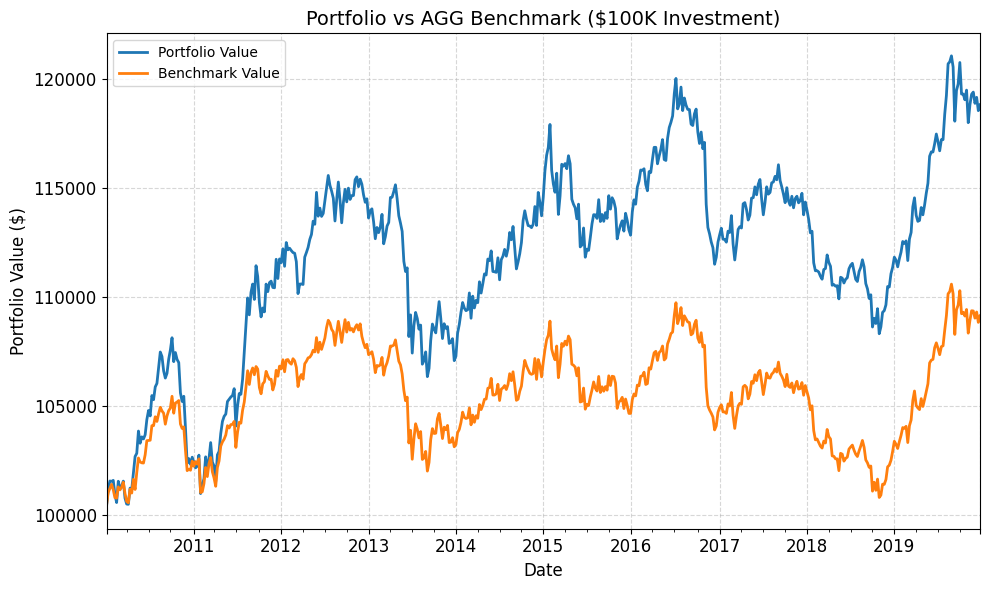

In [ ]:
# Compute portfolio returns using weights
weights = assets_df["Weight"]
portfolio_tickers = weights.index.tolist()  # ensure correct order

# Align returns
weekly_returns = weekly_prices.pct_change().dropna()
returns_10_19 = weekly_returns.loc["2010-01-01":"2019-12-31"]
returns_10_19 = returns_10_19[portfolio_tickers + ["AGG"]]
portfolio_returns_10_19 = (returns_10_19[portfolio_tickers] * weights).sum(axis=1)

# Simulate Cumulative Growth of $100,000 Investment ---
initial_investment = 100000
portfolio_cum = (1 + portfolio_returns_10_19).cumprod() * initial_investment
agg_cum = (1 + returns_10_19["AGG"]).cumprod() * initial_investment

# Combine and Plot
performance_df = pd.DataFrame({
    "Portfolio Simple Return": portfolio_returns_10_19,
    "Benchmark Simple Return": returns_10_19["AGG"],
    "Portfolio Cum Return": (1 + portfolio_returns_10_19).cumprod(),
    "Benchmark Cum Return": (1 + returns_10_19["AGG"]).cumprod(),
    "Portfolio Value": portfolio_cum,
    "Benchmark Value" : agg_cum
})

plt.figure(figsize=(10, 6))
ax = plt.gca()
performance_df[["Portfolio Value", "Benchmark Value"]].plot(ax=plt.gca(), linewidth=2)
plt.title("Portfolio vs AGG Benchmark ($100K Investment)", fontsize=14)
plt.ylabel("Portfolio Value ($)", fontsize=12)
plt.xlabel("Date", fontsize=12)
ax.tick_params(axis="both", which="major", labelsize=12)
plt.grid(True, linestyle="--", alpha=0.5)
plt.legend()
plt.tight_layout()
plt.show()






# Optimal Rolling Window

In [ ]:
# Calculate simple returns
portfolio_tickers = sorted(portfolio_tickers)
weekly_returns = weekly_returns[sorted(weekly_returns.columns)]
rets = weekly_returns[portfolio_tickers]

# Keep only the 2010-01-01 … 2019-12-31 window
rets_2010_2019 = rets.loc["2010-01-01":"2019-12-31"]

# Name the index and columns
rets_2010_2019.index.name  = "Date"
rets_2010_2019.columns.name = "Asset"

# Display return matrix
display(rets_2010_2019)

Asset,AGZ.P,IEF.O,IEI.O,MBB.O,MUB,SHY.O,TLT.O,VCIT.O
Date,,,,,,,,
2010-01-08,0.004090,0.004063,0.003631,0.005378,0.002409,0.003373,-0.006675,0.012418
2010-01-15,0.002407,0.012253,0.007236,0.004880,0.002937,0.002285,0.020047,0.005144
2010-01-22,0.004155,0.006219,0.004221,0.001961,-0.000774,0.001918,0.010101,0.002624
2010-01-29,-0.000367,0.000993,0.001878,0.001678,-0.000775,0.000359,0.003370,-0.005889
2010-02-05,-0.000092,0.001544,0.002678,0.000000,0.001842,0.000957,-0.003575,0.000790
...,...,...,...,...,...,...,...,...
2019-11-29,-0.000114,-0.001074,-0.000317,0.000370,0.001493,0.000413,0.003717,0.001096
2019-12-06,-0.003785,-0.005378,-0.002929,-0.002034,-0.001403,-0.001769,-0.014741,-0.002189
2019-12-13,0.001554,0.001712,0.000556,0.001853,0.002283,0.000591,0.004987,0.003181


In [ ]:
expected_returns_forecast_portfolio = expected_returns_forecast.copy().drop(columns=["Regime"], errors="ignore")

# Make sure the forecast panel has exactly the same columns order
expected_returns_forecast_portfolio = (
    expected_returns_forecast_portfolio
      .loc[:, rets_2010_2019.columns]
)

#  Combine real return 10_19 with hypothical return 20-25
combined_returns = pd.concat(
    [rets_2010_2019, expected_returns_forecast_portfolio],
    axis=0
).sort_index()

# Nice axis labels
combined_returns.index.name   = "Date"
combined_returns.columns.name = "Asset"

display(combined_returns)

Asset,AGZ.P,IEF.O,IEI.O,MBB.O,MUB,SHY.O,TLT.O,VCIT.O
Date,,,,,,,,
2010-01-08,0.004090,0.004063,0.003631,0.005378,0.002409,0.003373,-0.006675,0.012418
2010-01-15,0.002407,0.012253,0.007236,0.004880,0.002937,0.002285,0.020047,0.005144
2010-01-22,0.004155,0.006219,0.004221,0.001961,-0.000774,0.001918,0.010101,0.002624
2010-01-29,-0.000367,0.000993,0.001878,0.001678,-0.000775,0.000359,0.003370,-0.005889
2010-02-05,-0.000092,0.001544,0.002678,0.000000,0.001842,0.000957,-0.003575,0.000790
...,...,...,...,...,...,...,...,...
2025-05-30,0.025307,0.067206,0.041493,0.008274,0.033124,0.009861,0.130416,-0.007462
2025-06-06,0.026527,0.070849,0.043327,0.009968,0.034443,0.010215,0.136948,-0.004577
2025-06-13,0.026496,0.070533,0.043161,0.009954,0.034147,0.010200,0.136498,-0.004361


In [ ]:
# Expected Market Return
index_rets = weekly_returns['AGG']
index_rets_2010_2019 = index_rets.loc["2010-01-01":"2019-12-31"]

expected_returns_forecast_index = expected_returns_forecast['AGG']

# Ensure the forecast series is a plain Series and shares the same name
expected_returns_forecast_index = (
    expected_returns_forecast["AGG"]
      .rename(index_rets.name)
)

# Concatenate realised (2010-19) with forecast (2020-25) and sort
index_returns_extended = (
    pd.concat([index_rets_2010_2019, expected_returns_forecast_index])
      .sort_index()                       # chronological order
)

# Nice axis label
index_returns_extended.index.name = "Date"

index_returns_extended

# expected_market_return_weekly_2010_2019 = index_rets_2010_2019.mean()

# display(expected_market_return_weekly_2010_2019)

,AGG
Date,
2010-01-08,0.004555
2010-01-15,0.005841
2010-01-22,0.001865
2010-01-29,0.001819
2010-02-05,-0.002389
...,...
2025-05-30,0.017864
2025-06-06,0.020164
2025-06-13,0.020121


In [ ]:
# Bench mark weights
w_mkt = assets_df.loc[portfolio_tickers, "Weight"]

w_mkt

,Weight
AGZ.P,0.004678
IEF.O,0.153709
IEI.O,0.078342
MBB.O,0.160585
MUB,0.119886
SHY.O,0.140146
TLT.O,0.139809
VCIT.O,0.202845


In [ ]:
# Risk-free rate
rf = dfs["United States 3-Month Bond Yield.xlsx"].copy()

rf_2019 = rf[rf["Date"].dt.year == 2019].set_index("Date").sort_index() # Restrict to 2019

annual_rf_2019 = rf_2019["Price"].iloc[-1] / 100 # End year 2019

weekly_rf_2019 = (1 + annual_rf_2019)**(1/52) - 1

# --- Output ---
print("\nAnnual 2019 Risk-free rate:")
print(annual_rf_2019)
print("\nWeekly 2019 Risk-free rate:")
print(weekly_rf_2019)


Annual 2019 Risk-free rate:
0.0152

Weekly 2019 Risk-free rate:
0.0002901504974004432


In [ ]:
def run_bl_model(window_length, conf=1/2):
    from datetime import timedelta
    from numpy.linalg import inv

    global rolling_sigma, rolling_index_returns_series, rolling_lambda
    global mu_bl_table, bl_weights_by_date, bl_returns_net_series

    # ───────────────────────────────────────────────────
    # Build rolling covariance matrices (Σ_t)
    # ───────────────────────────────────────────────────
    one_week = timedelta(weeks=1)
    forecast_start = pd.Timestamp("2020-01-03")
    forecast_end   = pd.Timestamp("2025-06-30")
    forecast_dates = pd.date_range(start=forecast_start, end=forecast_end, freq="W-FRI")

    rolling_sigma = {}
    for forecast_date in forecast_dates:
        end_date   = forecast_date - one_week
        start_date = end_date - timedelta(weeks=window_length - 1)


        sigma_source = combined_returns.loc[start_date:end_date, portfolio_tickers]

        # if the rolling slice is too short, skip this date
        if len(sigma_source) < window_length:
            print(f"Skipping {forecast_date.date()} — insufficient data in rolling window.")
            continue

        try:
            sigma_window = (
                sigma_source.cov()
                .loc[portfolio_tickers, portfolio_tickers]
            )

            rolling_sigma[forecast_date] = sigma_window
        except Exception as e:
            print(f"Failed Sigma at {forecast_date.date()}: {e}")
            continue

    if len(rolling_sigma) == 0:
        print("⚠️ No valid Sigma matrices computed. Skipping this window length.")
        return {"window_length": window_length, "sharpe_ratio": np.nan, "bl_cum_return": np.nan}

    # ──────────────────────────────────────────────────────
    # Rolling market mean (AGG) and lambda (risk aversion)
    # ──────────────────────────────────────────────────────
    rolling_index_returns = {}
    rolling_market_var    = {}

    for forecast_date in forecast_dates:
        end_date   = forecast_date - one_week
        start_date = end_date - timedelta(weeks=window_length - 1)

        # rolling slice of the AGG series
        idx_slice = index_returns_extended.loc[start_date:end_date].dropna()

        if len(idx_slice) < window_length:
            # not enough lookback yet for this window_length
            continue

        # rolling mean and variance (sample variance)
        rolling_index_returns[forecast_date] = idx_slice.mean()
        rolling_market_var[forecast_date]    = idx_slice.var(ddof=1)

    # Convert to series
    rolling_index_returns_series = (
        pd.Series(rolling_index_returns)
          .sort_index()
          .rename("Rolling AGG Mean")
    )

    rolling_market_var_series = (
        pd.Series(rolling_market_var)
          .sort_index()
          .rename("Market Variance")
    )

    # Excess return & lambda
    rolling_excess_mkt = (rolling_index_returns_series - weekly_rf_2019).rename("Excess Market Return")
    common_idx = rolling_excess_mkt.index.intersection(rolling_market_var_series.index)

    rolling_lambda = (
        rolling_excess_mkt.loc[common_idx] / rolling_market_var_series.loc[common_idx]
    ).rename("Lambda")

    if len(rolling_lambda) == 0:
        print("⚠️ No valid rolling lambda values. Skipping this window length.")
        return {"window_length": window_length, "sharpe_ratio": np.nan, "bl_cum_return": np.nan}

    # ──────────────────────────────────────────────────────
    # Construct P, Q, Omega, π, μ_BL, Weights
    # ──────────────────────────────────────────────────────
    tau = 1
    n_assets = len(portfolio_tickers)
    absolute_view_definitions_by_date = {}

    for forecast_date, row in expected_returns_forecast_portfolio.iterrows():
        views_for_date = []
        for asset_ticker, expected_return in row.items():
            views_for_date.append({
                "assets+" : [asset_ticker],
                "assets-" : [],
                "Q"       : float(expected_return)
            })
        absolute_view_definitions_by_date[forecast_date] = views_for_date

    PQ_matrices_by_date = {}
    for forecast_date, views in absolute_view_definitions_by_date.items():
        number_of_views = len(views)
        link_matrix_P   = np.zeros((number_of_views, n_assets))
        view_returns_Q  = np.zeros((number_of_views, 1))

        for row_idx, view in enumerate(views):
            view_returns_Q[row_idx, 0] = view["Q"]

            n_plus = len(view["assets+"]) or 1  # avoid div by 0
            n_minus = len(view["assets-"]) or 1

            for long_asset in view["assets+"]:
                link_matrix_P[row_idx, portfolio_tickers.index(long_asset)] += 1.0 / n_plus

            for short_asset in view["assets-"]:
                link_matrix_P[row_idx, portfolio_tickers.index(short_asset)] -= 1.0 / n_minus


        view_labels = [f"View {i+1}" for i in range(number_of_views)]
        P_df = pd.DataFrame(link_matrix_P, index=view_labels, columns=portfolio_tickers)
        Q_df = pd.DataFrame(view_returns_Q, index=view_labels, columns=["Q Values"])

        PQ_matrices_by_date[forecast_date] = {"P": P_df, "Q": Q_df}

    omega_matrices_by_date = {}
    for forecast_date, pq_dict in PQ_matrices_by_date.items():
        if forecast_date not in rolling_sigma:
            continue
        Sigma_sub = rolling_sigma[forecast_date].loc[portfolio_tickers, portfolio_tickers].values
        P = pq_dict["P"].values
        diag_block = np.diag(P @ Sigma_sub @ P.T)
        Omega = np.diag((1/conf - 1) * diag_block)
        view_idx = pq_dict["P"].index
        omega_matrices_by_date[forecast_date] = pd.DataFrame(Omega, index=view_idx, columns=view_idx)

    mu_bl_by_date = {}
    pi_by_date    = {}
    w_vec = w_mkt.values.reshape(-1, 1)

    for forecast_date in sorted(PQ_matrices_by_date):
        if forecast_date not in rolling_sigma or forecast_date not in rolling_lambda:
            continue

        Sigma_sub_t = rolling_sigma[forecast_date].loc[portfolio_tickers, portfolio_tickers].values
        lambda_t = rolling_lambda.loc[forecast_date]
        pi_vector_t = (lambda_t * Sigma_sub_t) @ w_vec

        # π_t  (implied equilibrium return)
        pi_vector_t = (lambda_t * Sigma_sub_t) @ w_vec         # shape (n_assets, 1)
        pi_by_date[forecast_date] = pd.Series(pi_vector_t.flatten(),
                                              index=portfolio_tickers,
                                              name="π_t")



        # weekly P, Q, Ω
        P_matrix = PQ_matrices_by_date[forecast_date]["P"].values
        Q_vector = PQ_matrices_by_date[forecast_date]["Q"].values
        Omega = omega_matrices_by_date[forecast_date].values

        try:
            tauSigma_inv = inv(tau * Sigma_sub_t)
            Omega_inv = inv(Omega)
            mu_bl = inv(tauSigma_inv + P_matrix.T @ Omega_inv @ P_matrix) @ (
                        tauSigma_inv @ pi_vector_t + P_matrix.T @ Omega_inv @ Q_vector
                    )
        except Exception as e:
            print(f"μ_BL failed at {forecast_date.date()}: {e}")
            continue

        mu_bl_by_date[forecast_date] = pd.Series(mu_bl.flatten(), index=portfolio_tickers)

    pi_table = pd.DataFrame(pi_by_date).T.sort_index()
    mu_bl_table = pd.DataFrame(mu_bl_by_date).T.sort_index()

    # ────────────────────────────────────────────────
    # Portfolio Weights (Markowitz long-only)
    # ────────────────────────────────────────────────
    bl_weights_by_date = {}

    for forecast_date in sorted(mu_bl_table.index):
        try:
            Sigma_sub = rolling_sigma[forecast_date].loc[portfolio_tickers, portfolio_tickers].values
            P_matrix = PQ_matrices_by_date[forecast_date]["P"].values
            Omega = omega_matrices_by_date[forecast_date].values
            mu_bl = mu_bl_table.loc[forecast_date]
            lambda_t = float(rolling_lambda.loc[forecast_date])

            middle_inv = inv(P_matrix @ (tau * Sigma_sub) @ P_matrix.T + Omega)
            posterior_cov = Sigma_sub + (tau * Sigma_sub) @ P_matrix.T @ middle_inv @ P_matrix @ (tau * Sigma_sub)

            A = lambda_t * Sigma_sub
            b = mu_bl.values
            raw_weights = np.linalg.solve(A, b)

            raw_weights = np.clip(raw_weights, 0, None)
            norm_weights = raw_weights / raw_weights.sum()

            bl_weights_by_date[forecast_date] = pd.Series(norm_weights, index=mu_bl.index)
        except Exception as e:
            print(f"Weights failed at {forecast_date.date()}: {e}")
            continue

    bl_weights_panel = pd.DataFrame(bl_weights_by_date).T.sort_index()

    if bl_weights_panel.empty:
        print("⚠️ No BL weights generated.")
        return {"window_length": window_length, "sharpe_ratio": np.nan, "bl_cum_return": np.nan}

    # ────────────────────────────────────────
    # Net Returns (fees + txn costs)
    # ────────────────────────────────────────
    aligned_weights = (
        bl_weights_panel
          .reindex(weekly_returns.index)
          .ffill()
          .fillna(0.0)
    )

    etfstxn_costs = {
        "AGZ.P": 0.0007,
        "SHY.O": 0.0001,
        "IEI.O": 0.0001,
        "IEF.O": 0.0001,
        "TLT.O": 0.0001,
        "MUB":  0.0001,
        "VCIT.O":0.0001,
        "MBB.O": 0.0001,
    }

    annual_fee = 0.0003
    weekly_fee = (1 + annual_fee)**(1/52) - 1

    bl_returns_net = []
    last_weights = aligned_weights.iloc[0]

    for t, weights_t in aligned_weights.iterrows():
        if t not in weekly_returns.index:
            continue

        gross_ret = (weekly_returns.loc[t, weights_t.index] * weights_t).sum()
        net_ret = gross_ret * (1 - weekly_fee)
        turnover = (weights_t - last_weights).abs()
        txn_cost = sum(turnover[etf] * etfstxn_costs.get(etf, 0) for etf in turnover.index)
        net_ret -= txn_cost
        bl_returns_net.append((t, net_ret))
        last_weights = weights_t

    bl_returns_net_series = pd.Series(dict(bl_returns_net)).sort_index().rename("BL Net Return")

    # ────────────────────────────────────────────────
    # Performance Metrics
    # ────────────────────────────────────────────────
    anchor_dt = pd.Timestamp("2019-12-27")
    bl_net_returns = bl_returns_net_series.loc[anchor_dt:]

    if len(bl_net_returns) < 52:
        print(f"⚠️ Only {len(bl_net_returns)} weeks of net returns. Skipping.")
        return {"window_length": window_length, "sharpe_ratio": np.nan, "bl_cum_return": np.nan}

    sharpe = bl_net_returns.mean() / bl_net_returns.std() * np.sqrt(52)
    bl_cum_return = (1 + bl_net_returns).prod() - 1

    return {
            "window_length": window_length,
            "sharpe_ratio": sharpe,
            "bl_cum_return": bl_cum_return,
            "rolling_sigma":           rolling_sigma,
            "rolling_index_returns":   rolling_index_returns_series,
            "w_vec":                   w_vec,                       # weight vector
            "rolling_market_var":      rolling_market_var_series,
            "rolling_lambda":          rolling_lambda,
            "pi_table":                pi_table,
            "mu_bl_table":             mu_bl_table,
            "bl_weights_panel":        bl_weights_panel,
            "bl_returns_net_series":   bl_returns_net_series,
            "PQ_matrices_by_date":     PQ_matrices_by_date,
            "omega_matrices_by_date":  omega_matrices_by_date,
            "weekly_fee":              weekly_fee,
            "etfstxn_costs":           etfstxn_costs
    }

In [ ]:
def _avg_diag(df_like):
    import numpy as np, pandas as pd
    V = df_like.values if isinstance(df_like, pd.DataFrame) else df_like
    return float(np.mean(np.diag(V))) if V.size else np.nan


# grid-search over rolling windows
results            = []
objects_by_window  = {}

max_weeks = len(rets_2010_2019)
window_lengths_to_test = list(range(max_weeks, 51, -13))
print("Candidate windows:", window_lengths_to_test)

for win in window_lengths_to_test:
    # run model
    result = run_bl_model(win)
    objects_by_window[win] = result

    # market variance CV
    var_series = pd.Series(result["rolling_market_var"])
    result["cv_var"] = float(var_series.std() / var_series.mean()) if var_series.mean() != 0 else np.nan

    # lambda stability (CV of |lambda|)
    lam = pd.Series(result["rolling_lambda"]).astype(float)
    lam_abs = lam.abs()
    result["lambda_cv_abs"] = float(lam_abs.std() / lam_abs.mean()) if lam_abs.mean() != 0 else np.nan

    # # Σ_t stability:
    sigma_means = [sigma_df.values.mean() for sigma_df in rolling_sigma.values()]
    sigma_means = np.array(sigma_means)
    result["sigma_cv"] = np.std(sigma_means) / np.mean(sigma_means) if np.mean(sigma_means) != 0 else np.nan

    # Ω_t stability: CV of average diagonal (view uncertainty scale)
    omega_items = sorted(result["omega_matrices_by_date"].items())
    omega_diag_means = []
    for _, Om in omega_items:
        val = _avg_diag(Om)
        if not np.isnan(val):
            omega_diag_means.append(val)
    result["omega_diag_cv"] = (np.std(omega_diag_means) / np.mean(omega_diag_means)) if len(omega_diag_means) > 1 and np.mean(omega_diag_means) != 0 else np.nan

    results.append(result)

# build results table
results_df = pd.DataFrame(results)

results_df['stability_score'] = (
    0.25 * results_df['cv_var'] +
    0.25 * results_df['lambda_cv_abs'] +
    0.25 * results_df['sigma_cv'] +
    0.25 * results_df['omega_diag_cv']
)

Candidate windows: [521, 508, 495, 482, 469, 456, 443, 430, 417, 404, 391, 378, 365, 352, 339, 326, 313, 300, 287, 274, 261, 248, 235, 222, 209, 196, 183, 170, 157, 144, 131, 118, 105, 92, 79, 66, 53]


In [ ]:
cols_to_show = [
    "window_length",
    "sharpe_ratio",
    "bl_cum_return",
    "cv_var",
    "lambda_cv_abs",
    "sigma_cv",
    "omega_diag_cv",
    'stability_score'
]
cols_to_show = [c for c in cols_to_show if c in results_df.columns]

display(
    results_df[cols_to_show]
      .set_index("window_length")
      .style
      .format({
          "sharpe_ratio"   : "{:+.3f}",
          "bl_cum_return"  : "{:+.2%}",
          "cv_var"         : "{:.3f}",
          "lambda_cv_abs"  : "{:.3f}",
          "sigma_cv"       : "{:.3f}",
          "omega_diag_cv"  : "{:.3f}",
          'stability_score': "{:.3f}"
      })
      .set_caption("📊 Performance & Stability Metrics by Rolling Window Length")
)


,sharpe_ratio,bl_cum_return,cv_var,lambda_cv_abs,sigma_cv,omega_diag_cv,stability_score
window_length,,,,,,,
521,-0.068,-1.76%,0.263,0.426,0.364,0.379,0.358
508,-0.068,-1.76%,0.260,0.433,0.360,0.375,0.357
495,-0.109,-2.56%,0.257,0.437,0.356,0.372,0.355
482,-0.091,-2.22%,0.254,0.438,0.352,0.368,0.353
469,-0.082,-2.06%,0.251,0.443,0.347,0.365,0.351
456,-0.084,-2.11%,0.247,0.450,0.343,0.361,0.350
443,-0.111,-2.65%,0.241,0.458,0.337,0.357,0.348
430,-0.105,-2.55%,0.235,0.464,0.331,0.352,0.346
417,-0.085,-2.15%,0.228,0.471,0.325,0.348,0.343


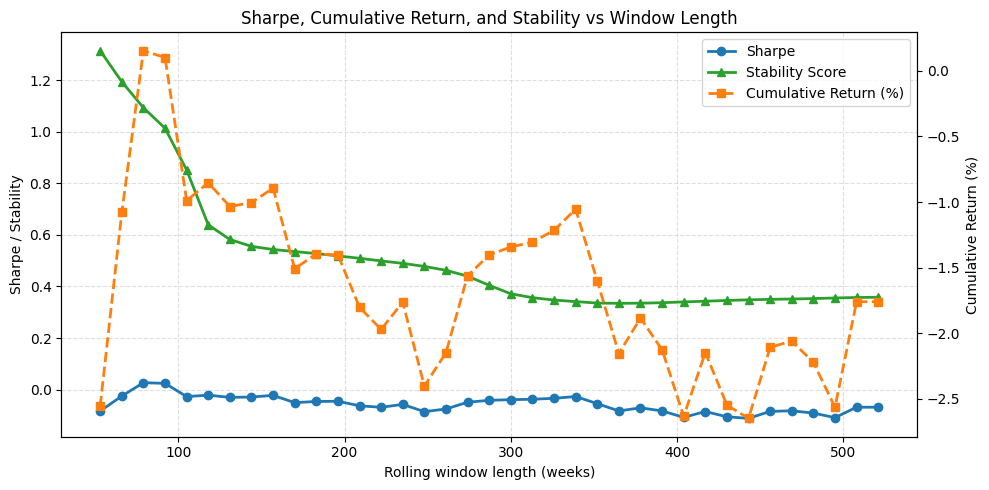

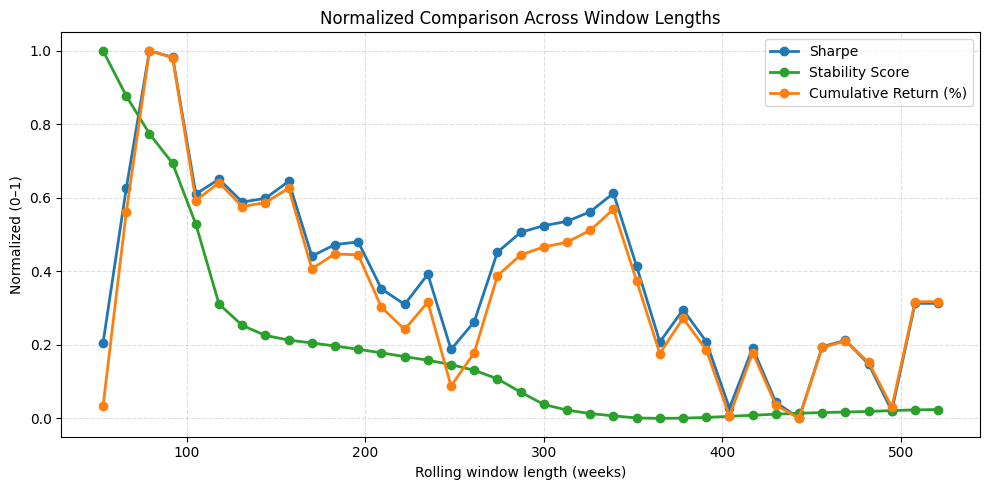

In [ ]:
# Plot Sharpe, BL cumulative return, and stability_score by window length
want_cols = ["sharpe_ratio", "bl_cum_return", "stability_score"]
present   = [c for c in want_cols if c in results_df.columns]

plot_df = (
    results_df[["window_length"] + present]
    .dropna(subset=["window_length"])
    .copy()
)

# guard: make sure types are numeric
plot_df["window_length"] = pd.to_numeric(plot_df["window_length"], errors="coerce")
for c in present:
    plot_df[c] = pd.to_numeric(plot_df[c], errors="coerce")

# sort by window length (ascending)
plot_df = plot_df.sort_values("window_length")

# Consistent colors + legend order
color_map = {
    "sharpe_ratio":    "#1f77b4",  # blue
    "stability_score": "#2ca02c",  # green
    "bl_cum_return":   "#ff7f0e",  # orange
}
legend_order = [
    ("sharpe_ratio", "Sharpe"),
    ("stability_score", "Stability Score"),
    ("bl_cum_return", "Cumulative Return (%)"),
]

# Raw-units plot with twin y-axes
fig, ax1 = plt.subplots(figsize=(10, 5))

# left axis: Sharpe & Stability
if "sharpe_ratio" in plot_df.columns:
    ax1.plot(
        plot_df["window_length"], plot_df["sharpe_ratio"],
        marker="o", linewidth=2, label="Sharpe",
        color=color_map["sharpe_ratio"]
    )
if "stability_score" in plot_df.columns:
    ax1.plot(
        plot_df["window_length"], plot_df["stability_score"],
        marker="^", linewidth=2, label="Stability Score",
        color=color_map["stability_score"]
    )

ax1.set_xlabel("Rolling window length (weeks)")
ax1.set_ylabel("Sharpe / Stability")
ax1.grid(True, linestyle="--", alpha=0.4)

# right axis: cumulative return in %
ax2 = ax1.twinx()
if "bl_cum_return" in plot_df.columns:
    ax2.plot(
        plot_df["window_length"], plot_df["bl_cum_return"] * 100.0,
        marker="s", linewidth=2, linestyle="--", label="Cumulative Return (%)",
        color=color_map["bl_cum_return"]
    )
    ax2.set_ylabel("Cumulative Return (%)")

# One combined legend in the requested order
handles, labels = [], []
for key, lbl in legend_order:
    # find the handle with this label on either axis (if present)
    for ax in (ax1, ax2):
        h, l = ax.get_legend_handles_labels()
        for hh, ll in zip(h, l):
            if ll == lbl:
                handles.append(hh); labels.append(ll)
                break
ax1.legend(handles, labels, loc="best")

ax1.set_title("Sharpe, Cumulative Return, and Stability vs Window Length")
plt.tight_layout()
plt.show()

# Normalized comparison (0–1) for shape-only view
norm_df = plot_df.copy()
for c in present:
    s = norm_df[c].astype(float)
    rng = s.max() - s.min()
    norm_df[c + "_norm"] = (s - s.min()) / (rng if rng != 0 else 1.0)

fig, ax = plt.subplots(figsize=(10, 5))
for key, lbl in legend_order:
    col = key + "_norm"
    if col in norm_df.columns:
        ax.plot(
            norm_df["window_length"], norm_df[col],
            marker="o", linewidth=2, label=lbl,
            color=color_map[key]
        )

ax.set_xlabel("Rolling window length (weeks)")
ax.set_ylabel("Normalized (0–1)")
ax.set_title("Normalized Comparison Across Window Lengths")
ax.grid(True, linestyle="--", alpha=0.4)
ax.legend(loc="best")
plt.tight_layout()
plt.show()


In [ ]:
best_sharpe = results_df['sharpe_ratio'].max()
candidates = results_df[results_df['sharpe_ratio'] == best_sharpe]

if not candidates.empty:
    best_row = candidates.sort_values('stability_score').iloc[0]
    print(f"Best window length: {int(best_row['window_length'])}")
    print(f"Sharpe Ratio: {best_row['sharpe_ratio']:.3f}")
    print(f"Stability Score: {best_row['stability_score']:.3f}")
    print(f"Cumulative Return: {best_row['bl_cum_return']:.2%}")
else:
    print("No candidate windows found.")

best_window_length = int(best_row["window_length"])
print(f"\n🔁  Re-running BL model with selected window ({best_window_length})...")
best_bl_output = run_bl_model(best_window_length)


Best window length: 79
Sharpe Ratio: 0.027
Stability Score: 1.093
Cumulative Return: 0.15%

🔁  Re-running BL model with selected window (79)...


# Black-Litterman Optimize

In [ ]:
rolling_sigma = best_bl_output["rolling_sigma"]

# Combine into MultiIndex DataFrame
rolling_sigma_df = (
    pd.concat(rolling_sigma, names=["Date"])
      .sort_index()
)

display(rolling_sigma_df)

Asset                     AGZ.P     IEF.O         IEI.O     MBB.O  \
Date       Asset                                                    
2020-01-03 AGZ.P   1.364709e-05  0.000027  1.543778e-05  0.000010   
           IEF.O   2.670202e-05  0.000056  3.154936e-05  0.000020   
           IEI.O   1.543778e-05  0.000032  1.841460e-05  0.000012   
           MBB.O   9.980451e-06  0.000020  1.162592e-05  0.000011   
           MUB     1.050784e-05  0.000021  1.220290e-05  0.000009   
...                         ...       ...           ...       ...   
2025-06-27 MBB.O   3.717316e-06  0.000009  4.055870e-06  0.000006   
           MUB     2.874703e-06  0.000007  2.694692e-06  0.000005   
           SHY.O   8.199118e-07  0.000002  1.064405e-06  0.000001   
           TLT.O   1.602878e-05  0.000039  1.710688e-05  0.000023   
           VCIT.O  7.071946e-07  0.000002  1.223083e-07  0.000001   

Asset                       MUB         SHY.O     TLT.O        VCIT.O  
Date       Asset                                                       
2020-01-03 AGZ.P   1.050784e-05  5.600472e-06  0.000061  1.577067e-05  
           IEF.O   2.126881e-05  1.082739e-05  0.000128  3.224204e-05  
           IEI.O   1.220290e-05  6.575013e-06  0.000071  1.837210e-05  
           MBB.O   8.591345e-06  4.336083e-06  0.000044  1.233739e-05  
           MUB     1.114543e-05  4.544097e-06  0.000050  1.318147e-05  
...                         ...           ...       ...           ...  
2025-06-27 MBB.O   4.531834e-06  1.110899e-06  0.000023  1.381981e-06  
           MUB     4.644929e-06  6.600522e-07  0.000020  2.470305e-06  
           SHY.O   6.600522e-07  3.130249e-07  0.000004 -9.549773e-08  
           TLT.O   1.953155e-05  4.394731e-06  0.000102  6.665503e-06  
           VCIT.O  2.470305e-06 -9.549773e-08  0.000007  3.331574e-06  

[2296 rows x 8 columns]

In [ ]:
w_vec                     = best_bl_output["w_vec"]
rolling_market_var        = best_bl_output["rolling_market_var"]
rolling_lambda            = best_bl_output["rolling_lambda"]

rolling_market_var_series = (
    pd.Series(rolling_market_var)
      .sort_index()
      .rename("Market Variance")
)

# Result
print('\nWeight Vector:')
display(w_vec)
print('\nMarket Variance:')
display(rolling_market_var_series)
print('\nLambda Risk Aversion:')
display(rolling_lambda)


Weight Vector:


array([[0.00467768],
       [0.1537094 ],
       [0.07834221],
       [0.16058497],
       [0.1198862 ],
       [0.14014591],
       [0.13980884],
       [0.20284479]])


Market Variance:


,Market Variance
2020-01-03,0.000023
2020-01-10,0.000028
2020-01-17,0.000033
2020-01-24,0.000037
2020-01-31,0.000040
...,...
2025-05-30,0.000003
2025-06-06,0.000003
2025-06-13,0.000003
2025-06-20,0.000003



Lambda Risk Aversion:


,Lambda
2020-01-03,21.583627
2020-01-10,25.506010
2020-01-17,29.276577
2020-01-24,32.342337
2020-01-31,36.086144
...,...
2025-05-30,5754.535063
2025-06-06,5810.874897
2025-06-13,5871.099648
2025-06-20,6072.322232


In [ ]:
PQ_matrices_by_date       = best_bl_output["PQ_matrices_by_date"]

# BUILD ONE MASTER Q-TABLE  (rows = forecast weeks, cols = assets)
q_table = (
    pd.concat(
        [
            # ① grab the Q column (Series)
            pq_dict["Q"]["Q Values"]
              # ② rename the row labels "View 1", … → the real tickers
              .rename(index=dict(zip(pq_dict["Q"].index, portfolio_tickers)))
              # ③ turn it into a 1-row DataFrame
              .to_frame().T
              # ④ tag the row with its forecast date
              .assign(Forecast_Date=forecast_date)
              .set_index("Forecast_Date")
            for forecast_date, pq_dict in PQ_matrices_by_date.items()
        ]
    )
    .sort_index()                     # chronological order
)

q_table.index.name   = "Forecast Week"
q_table.columns.name = "Asset"

display(q_table)

p_table = (
    pd.concat(
        {forecast_date: pq_dict["P"]                  # keeps original P rows
         for forecast_date, pq_dict in PQ_matrices_by_date.items()},
        names=["Forecast Week", "View"]               # name the new index levels
    )
    .sort_index()                                     # chronological order
)

# show fractional strings instead of 0/1 floats
p_table_pretty = p_table.applymap(
    lambda x: "" if x == 0 else "1"                   # identity views → 1 or blank
)

display(p_table)

Asset,AGZ.P,IEF.O,IEI.O,MBB.O,MUB,SHY.O,TLT.O,VCIT.O
Forecast Week,,,,,,,,
2020-01-03,0.019531,0.067476,0.039200,0.005845,0.024907,0.007116,0.137658,0.032448
2020-01-10,0.018420,0.066678,0.038358,0.004272,0.024282,0.006162,0.140451,0.028768
2020-01-17,0.017802,0.063413,0.036424,0.002830,0.023491,0.005523,0.135256,0.027230
2020-01-24,0.016650,0.061932,0.035379,0.002253,0.023811,0.004987,0.133004,0.026433
2020-01-31,0.016855,0.062018,0.035032,0.001755,0.024134,0.004918,0.132767,0.028208
...,...,...,...,...,...,...,...,...
2025-05-30,0.025307,0.067206,0.041493,0.008274,0.033124,0.009861,0.130416,-0.007462
2025-06-06,0.026527,0.070849,0.043327,0.009968,0.034443,0.010215,0.136948,-0.004577
2025-06-13,0.026496,0.070533,0.043161,0.009954,0.034147,0.010200,0.136498,-0.004361


/tmp/ipython-input-919606968.py:37: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  p_table_pretty = p_table.applymap(


AGZ.P  IEF.O  IEI.O  MBB.O  MUB  SHY.O  TLT.O  VCIT.O
Forecast Week View                                                         
2020-01-03    View 1    1.0    0.0    0.0    0.0  0.0    0.0    0.0     0.0
              View 2    0.0    1.0    0.0    0.0  0.0    0.0    0.0     0.0
              View 3    0.0    0.0    1.0    0.0  0.0    0.0    0.0     0.0
              View 4    0.0    0.0    0.0    1.0  0.0    0.0    0.0     0.0
              View 5    0.0    0.0    0.0    0.0  1.0    0.0    0.0     0.0
...                     ...    ...    ...    ...  ...    ...    ...     ...
2025-06-27    View 4    0.0    0.0    0.0    1.0  0.0    0.0    0.0     0.0
              View 5    0.0    0.0    0.0    0.0  1.0    0.0    0.0     0.0
              View 6    0.0    0.0    0.0    0.0  0.0    1.0    0.0     0.0
              View 7    0.0    0.0    0.0    0.0  0.0    0.0    1.0     0.0
              View 8    0.0    0.0    0.0    0.0  0.0    0.0    0.0     1.0

[2296 rows x 8 columns]

In [ ]:
omega_matrices_by_date = best_bl_output["omega_matrices_by_date"]

# big block for inspection
rolling_omega_df = pd.concat(omega_matrices_by_date, names=["Date"]).sort_index()

print("Full Omega Matrix Block:")
display(rolling_omega_df)

Full Omega Matrix Block:


View 1    View 2    View 3    View 4    View 5  \
Date                                                                  
2020-01-03 View 1  0.000014  0.000000  0.000000  0.000000  0.000000   
           View 2  0.000000  0.000056  0.000000  0.000000  0.000000   
           View 3  0.000000  0.000000  0.000018  0.000000  0.000000   
           View 4  0.000000  0.000000  0.000000  0.000011  0.000000   
           View 5  0.000000  0.000000  0.000000  0.000000  0.000011   
...                     ...       ...       ...       ...       ...   
2025-06-27 View 4  0.000000  0.000000  0.000000  0.000006  0.000000   
           View 5  0.000000  0.000000  0.000000  0.000000  0.000005   
           View 6  0.000000  0.000000  0.000000  0.000000  0.000000   
           View 7  0.000000  0.000000  0.000000  0.000000  0.000000   
           View 8  0.000000  0.000000  0.000000  0.000000  0.000000   

                         View 6    View 7    View 8  
Date                                                 
2020-01-03 View 1  0.000000e+00  0.000000  0.000000  
           View 2  0.000000e+00  0.000000  0.000000  
           View 3  0.000000e+00  0.000000  0.000000  
           View 4  0.000000e+00  0.000000  0.000000  
           View 5  0.000000e+00  0.000000  0.000000  
...                         ...       ...       ...  
2025-06-27 View 4  0.000000e+00  0.000000  0.000000  
           View 5  0.000000e+00  0.000000  0.000000  
           View 6  3.130249e-07  0.000000  0.000000  
           View 7  0.000000e+00  0.000102  0.000000  
           View 8  0.000000e+00  0.000000  0.000003  

[2296 rows x 8 columns]

In [ ]:
# Tidy result tables
pi_table = best_bl_output["pi_table"]
mu_bl_table = best_bl_output["mu_bl_table"]

print("\nRolling Priors Returns π_t (first few rows):")
display(pi_table.head().style.format("{:+.6f}"))

print("\nRolling Posterior Return Vector μ_BL(first few rows):")
display(mu_bl_table.head().style.format("{:+.6f}"))


Rolling Priors Returns π_t (first few rows):


,AGZ.P,IEF.O,IEI.O,MBB.O,MUB,SHY.O,TLT.O,VCIT.O
2020-01-03 00:00:00,+0.000447,+0.000925,+0.000522,+0.000347,+0.000372,+0.000182,+0.002187,+0.000577
2020-01-10 00:00:00,+0.000795,+0.002023,+0.001157,+0.000482,+0.000780,+0.000312,+0.004482,+0.001118
2020-01-17 00:00:00,+0.001187,+0.003328,+0.001905,+0.000611,+0.001258,+0.000449,+0.007272,+0.001706
2020-01-24 00:00:00,+0.001581,+0.004649,+0.002663,+0.000710,+0.001749,+0.000579,+0.010119,+0.002291
2020-01-31 00:00:00,+0.002023,+0.006173,+0.003535,+0.000814,+0.002331,+0.000723,+0.013398,+0.002964



Rolling Posterior Return Vector μ_BL(first few rows):


,AGZ.P,IEF.O,IEI.O,MBB.O,MUB,SHY.O,TLT.O,VCIT.O
2020-01-03 00:00:00,+0.021977,+0.046290,+0.026087,+0.014229,+0.018726,+0.008731,+0.110665,+0.027929
2020-01-10 00:00:00,+0.018442,+0.049931,+0.028570,+0.008785,+0.019154,+0.007014,+0.110176,+0.026315
2020-01-17 00:00:00,+0.016680,+0.049730,+0.028496,+0.006465,+0.018693,+0.006106,+0.108284,+0.024441
2020-01-24 00:00:00,+0.015861,+0.049569,+0.028393,+0.005197,+0.018587,+0.005585,+0.107621,+0.023505
2020-01-31 00:00:00,+0.015762,+0.050894,+0.029141,+0.004510,+0.019163,+0.005416,+0.110322,+0.023750


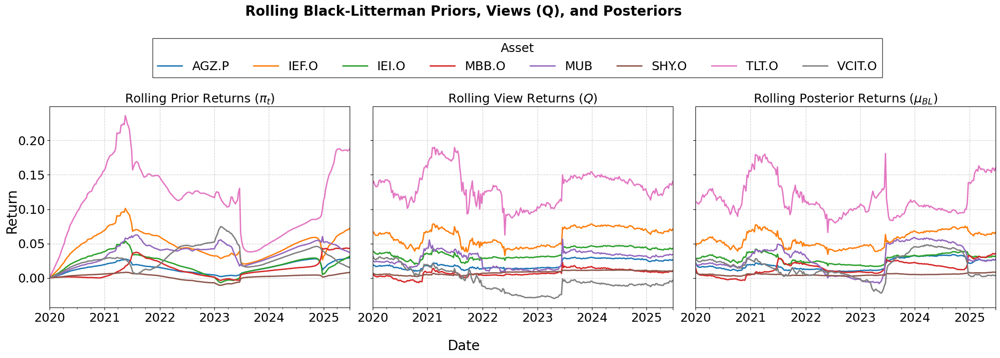

In [ ]:
# Select assets to plot (all columns)
asset_list = pi_table.columns

# Remove index name to prevent automatic axis label
pi_table.index.name = None
mu_bl_table.index.name = None
q_table.index.name = None

# Find global y-limits across all three tables
ymin = min(
    pi_table[asset_list].min().min(),
    mu_bl_table[asset_list].min().min(),
    q_table[asset_list].min().min()
)
ymax = max(
    pi_table[asset_list].max().max(),
    mu_bl_table[asset_list].max().max(),
    q_table[asset_list].max().max()
)
ymargin = 0.05 * (ymax - ymin)
ymin -= ymargin
ymax += ymargin

fig, axes = plt.subplots(1, 3, figsize=(22, 6), sharex=True, sharey=True)  # <-- sharey here!

# --- π_t (priors) ---
pi_table[asset_list].plot(ax=axes[0], linewidth=2)
axes[0].set_title("Rolling Prior Returns ($\\pi_t$)", fontsize=18)
axes[0].grid(True, linestyle="--", alpha=0.6)
axes[0].legend().remove()
axes[0].tick_params(axis="both", labelsize=18)
axes[0].set_ylim(ymin, ymax)

# --- Q (views) ---  <------ now in the middle!
q_table[asset_list].plot(ax=axes[1], linewidth=2)
axes[1].set_title("Rolling View Returns ($Q$)", fontsize=18)
axes[1].grid(True, linestyle="--", alpha=0.6)
axes[1].legend().remove()
axes[1].tick_params(axis="both", labelsize=18)
axes[1].set_ylim(ymin, ymax)

# --- μ_BL (posteriors) ---  <----- now on the right!
mu_bl_table[asset_list].plot(ax=axes[2], linewidth=2)
axes[2].set_title("Rolling Posterior Returns ($\\mu_{BL}$)", fontsize=18)
axes[2].grid(True, linestyle="--", alpha=0.6)
axes[2].legend().remove()
axes[2].tick_params(axis="both", labelsize=18)
axes[2].set_ylim(ymin, ymax)

# --- Shared y-label for all subplots ---
fig.text(0.5, 0.04, "Date", ha="center", va="center", fontsize=20)
fig.text(0.075, 0.5, "Return", va="center", rotation="vertical", fontsize=20)



# --- Shared legend at the top center ---
handles, labels = axes[0].get_legend_handles_labels()
leg = fig.legend(
    handles, labels,
    loc="upper center",
    bbox_to_anchor=(0.55, 1.15),    # Centered horizontally, above the charts
    ncol=len(labels),              # All assets in one row
    fontsize=18,
    title="Asset",
    title_fontsize=18,
    frameon=True,
    borderaxespad=1.5,
    fancybox=False
)
frame = leg.get_frame()
frame.set_edgecolor("black")
frame.set_linewidth(1)

fig.suptitle(
    "Rolling Black-Litterman Priors, Views (Q), and Posteriors",
    fontsize=20,
    weight="bold",
    y=1.20
)

plt.tight_layout(rect=[0.08, 0.09, 1, 1]) # adjust rect to allow y-label
plt.show()

,AGZ.P,IEF.O,IEI.O,MBB.O,MUB,SHY.O,TLT.O,VCIT.O
2020-01-03,0.000000,0.199846,0.371116,0.0,0.289672,0.000000,0.045859,0.093508
2020-01-10,0.000000,0.186808,0.320931,0.0,0.336986,0.000000,0.070988,0.084286
2020-01-17,0.087586,0.151095,0.253705,0.0,0.329937,0.000000,0.066100,0.111576
2020-01-24,0.067894,0.140000,0.225398,0.0,0.370297,0.000000,0.065818,0.130594
2020-01-31,0.096265,0.124275,0.183640,0.0,0.339033,0.000000,0.059901,0.196886
...,...,...,...,...,...,...,...,...
2025-05-30,0.001312,0.076997,0.242169,0.0,0.138951,0.499972,0.040599,0.000000
2025-06-06,0.000217,0.082805,0.252063,0.0,0.142733,0.480028,0.042155,0.000000
2025-06-13,0.000000,0.084664,0.254754,0.0,0.145094,0.472129,0.043358,0.000000
2025-06-20,0.000000,0.089916,0.256020,0.0,0.165198,0.439904,0.048962,0.000000


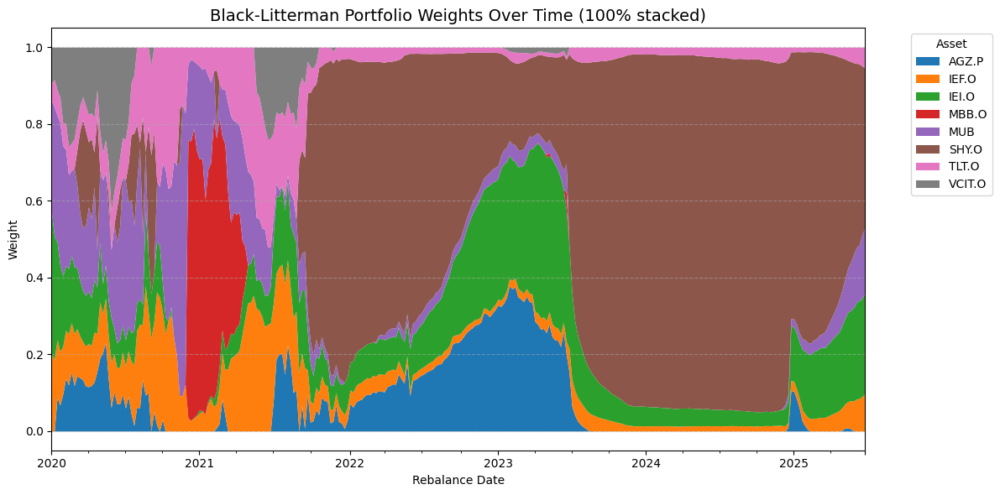

In [ ]:
bl_weights_panel = best_bl_output["bl_weights_panel"]
display(bl_weights_panel.round(6))

# Stacked Area Plot of Weights
weights_normalised = bl_weights_panel.div(bl_weights_panel.sum(axis=1), axis=0)

fig, ax = plt.subplots(figsize=(12, 6))
weights_normalised.plot.area(ax=ax, linewidth=0)

ax.set_title("Black-Litterman Portfolio Weights Over Time (100% stacked)", fontsize=14)
ax.set_ylabel("Weight")
ax.set_xlabel("Rebalance Date")
ax.grid(True, axis='y', linestyle="--", alpha=0.5)
ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left", ncol=1, title="Asset")

plt.tight_layout()
plt.show()

# Performance


Portfolio cumulative values since 27/12/2019:


,Original Portfolio,Black-Litterman Portfolio
Date,,
2019-12-27,118829.363660,118829.363660
2020-01-03,119400.711511,119417.397901
2020-01-10,119340.170237,119406.542133
2020-01-17,119384.782970,119487.319238
2020-01-24,120405.943555,120387.248245
...,...,...
2025-05-30,102559.612927,119128.088028
2025-06-06,101662.843271,118277.985722
2025-06-13,102392.868685,118836.573570


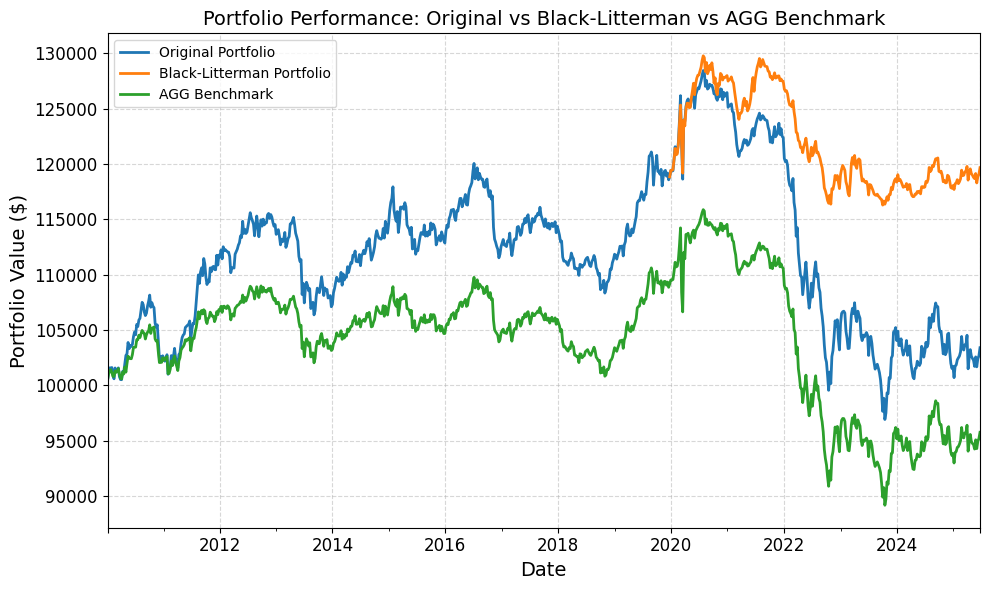

In [ ]:
# Align weight panel to weekly return index (forward-fill)
aligned_weights = (
    bl_weights_panel
      .reindex(weekly_returns.index) # align dates
      .ffill() # carry last weight until next rebalance
      .fillna(0.0) # before first rebalance, weight = 0
)

# Align returns
weekly_returns = weekly_returns[portfolio_tickers + ["AGG"]]
portfolio_returns = (weekly_returns[portfolio_tickers] * weights).sum(axis=1)

# Compute BL portfolio weekly returns
bl_weekly_returns = (weekly_returns[aligned_weights.columns] * aligned_weights).sum(axis=1)

# Simulate Cumulative Growth of $100,000 Investment
initial_investment = 100000
portfolio_cum = (1 + portfolio_returns).cumprod() * initial_investment
agg_cum = (1 + weekly_returns["AGG"]).cumprod() * initial_investment

# Build cumulative series, anchored to 27 Dec-2019
anchor_dt = pd.Timestamp("2019-12-27")
orig_anchor_val = portfolio_cum.loc[:anchor_dt].iloc[-1]

bl_cum = (1 + bl_weekly_returns.loc[anchor_dt:]).cumprod() * orig_anchor_val

# Pre-pend the anchor value so BL has the same 27-Dec-2019 level
bl_cum = pd.concat([pd.Series(index=portfolio_cum.loc[:anchor_dt].index[:-1]), bl_cum])

# Combine for comparison
performance_compare_df = pd.DataFrame({
    "Original Portfolio": portfolio_cum,
    "Black-Litterman Portfolio": bl_cum,
    "AGG Benchmark": agg_cum,
})

# Performance table
window_start = anchor_dt
print("\nPortfolio cumulative values since 27/12/2019:")
perfromance_since_anchor = performance_compare_df[
    ["Original Portfolio", "Black-Litterman Portfolio"]].loc[window_start:]
display(perfromance_since_anchor)


# Plot performance comparison
plt.figure(figsize=(10, 6))
ax = plt.gca()
performance_compare_df.plot(ax=ax, linewidth=2)
ax.set_title("Portfolio Performance: Original vs Black-Litterman vs AGG Benchmark", fontsize=14)
ax.set_ylabel("Portfolio Value ($)", fontsize=14)
ax.set_xlabel("Date", fontsize=14)
ax.grid(True, linestyle="--", alpha=0.5)
ax.tick_params(axis="both", which="major", labelsize=12)
plt.legend()
plt.tight_layout()
plt.show()


Portfolio cumulative values since 27/12/2019:


,Passive Portfolio (Net),Black-Litterman (Net),Orig Mgmt Cost ($),BL Mgmt Cost ($),BL Txn Cost ($),Orig Cumulative Cost ($),BL Cumulative Cost ($)
2019-12-27,118829.2522,118829.2522,0.6839,0.5768,0.0000,335.8935,300.5327
2020-01-03,119400.5963,119405.3996,0.6855,0.5768,10.0000,336.5790,311.1096
2020-01-10,119340.0554,119392.8150,0.6887,0.5796,1.4489,337.2677,313.1381
2020-01-17,119384.6678,119464.5649,0.6884,0.5796,7.5527,337.9561,321.2703
2020-01-24,120405.8215,120361.4872,0.6887,0.5799,2.3691,338.6448,324.2193
...,...,...,...,...,...,...,...
2025-05-30,102559.6110,118488.1164,0.5866,0.5730,0.8472,519.1677,1005.8805
2025-06-06,101662.8465,117642.0094,0.5916,0.5752,0.4865,519.7593,1006.9422
2025-06-13,102392.8677,118197.3843,0.5864,0.5711,0.1753,520.3457,1007.6886
2025-06-20,102658.1668,118421.5780,0.5906,0.5738,0.6445,520.9363,1008.9068


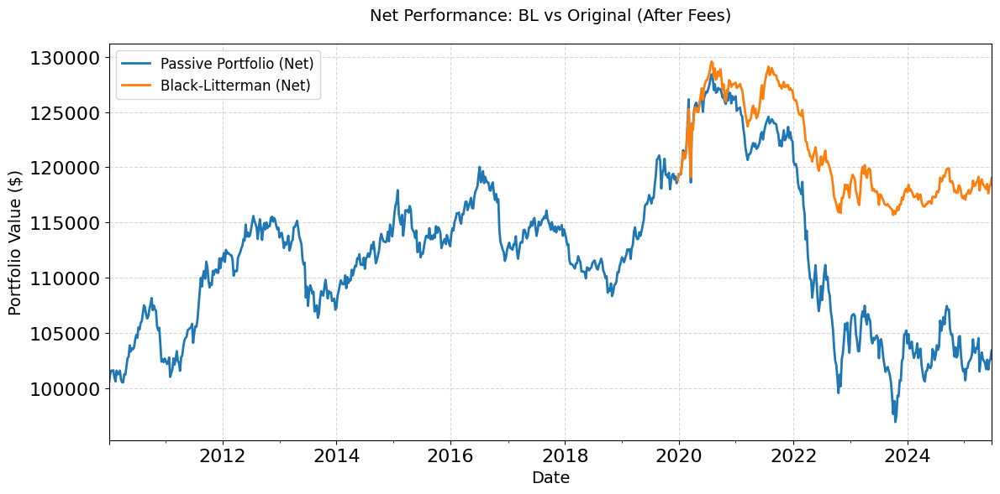

In [ ]:
bl_returns_net_series     = best_bl_output["bl_returns_net_series"]
weekly_fee                = best_bl_output["weekly_fee"]
etfstxn_costs             = best_bl_output["etfstxn_costs"]

# Apply same mgmt fee to Original Portfolio and AGG Benchmark
portfolio_returns_net = portfolio_returns * (1 - weekly_fee)
agg_returns_net       = weekly_returns["AGG"] * (1 - weekly_fee)

# Build cumulative value series
initial_investment = 100000
anchor_dt = pd.Timestamp("2019-12-27")

# Anchor value from original portfolio at 27-Dec-2019
orig_anchor_val = (1 + portfolio_returns_net.loc[:anchor_dt]).cumprod().iloc[-1] * initial_investment

# Cumulative series
portfolio_cum_net = (1 + portfolio_returns_net).cumprod() * initial_investment
agg_cum_net       = (1 + agg_returns_net).cumprod() * initial_investment
bl_cum_net        = (1 + bl_returns_net_series.loc[anchor_dt:]).cumprod() * orig_anchor_val
bl_cum_net        = pd.concat([pd.Series(index=portfolio_cum_net.loc[:anchor_dt].index[:-1]), bl_cum_net])

# --- Final comparison DataFrame ---
performance_compare_net_df = pd.DataFrame({
    "Passive Portfolio (Net)": portfolio_cum_net,
    "Black-Litterman (Net)": bl_cum_net,
    # "AGG Benchmark (Net)": agg_cum_net,
})

# Table
window_start = anchor_dt
print("\nPortfolio cumulative values since 27/12/2019:")
perfromance_net_since_anchor = performance_compare_net_df[
    ["Passive Portfolio (Net)", "Black-Litterman (Net)"]].loc[window_start:]


# Transaction cost rates
txn_cost_rates = pd.Series(etfstxn_costs)

# weight turnover and transaction cost
weight_changes = aligned_weights.diff().abs().fillna(0)
txn_cost_matrix = weight_changes.mul(txn_cost_rates, axis=1) * initial_investment
txn_cost_weekly = txn_cost_matrix.sum(axis=1)

# Management fees for both portfolios (based on gross AUM)
portfolio_cum_gross = (1 + portfolio_returns).cumprod() * initial_investment
bl_cum_gross        = (1 + bl_returns_net_series).cumprod() * initial_investment

mgmt_cost_orig = portfolio_cum_gross.shift(1).fillna(initial_investment) * weekly_fee
mgmt_cost_bl   = bl_cum_gross.shift(1).fillna(initial_investment) * weekly_fee

# Combine costs
txn_cost_orig     = pd.Series(0.0, index=mgmt_cost_orig.index)  # No txn cost for Original
total_cost_orig   = mgmt_cost_orig + txn_cost_orig
total_cost_bl     = mgmt_cost_bl + txn_cost_weekly

# Cumulative cost
cum_cost_orig = total_cost_orig.cumsum()
cum_cost_bl   = total_cost_bl.cumsum()

# Add cost columns to performance table
perfromance_net_since_anchor = perfromance_net_since_anchor.copy()
perfromance_net_since_anchor["Orig Mgmt Cost ($)"]      = mgmt_cost_orig.loc[window_start:]
perfromance_net_since_anchor["BL Mgmt Cost ($)"]        = mgmt_cost_bl.loc[window_start:]
perfromance_net_since_anchor["BL Txn Cost ($)"]         = txn_cost_weekly.loc[window_start:]
perfromance_net_since_anchor["Orig Cumulative Cost ($)"] = cum_cost_orig.loc[window_start:]
perfromance_net_since_anchor["BL Cumulative Cost ($)"]   = cum_cost_bl.loc[window_start:]


# Display cost table
display(perfromance_net_since_anchor.round(4))

# Plot results
plt.figure(figsize=(12, 6))
performance_compare_net_df.plot(ax=plt.gca(), linewidth=2)
plt.title("Net Performance: BL vs Original (After Fees)", fontsize=14, pad=20)
plt.ylabel("Portfolio Value ($)", fontsize=14)
plt.xlabel("Date", fontsize=14)
plt.tick_params(axis="both", which="major", labelsize=16)
plt.grid(True, linestyle="--", alpha=0.5)
plt.legend(loc="upper left", fontsize = 12)
plt.tight_layout()
plt.show()

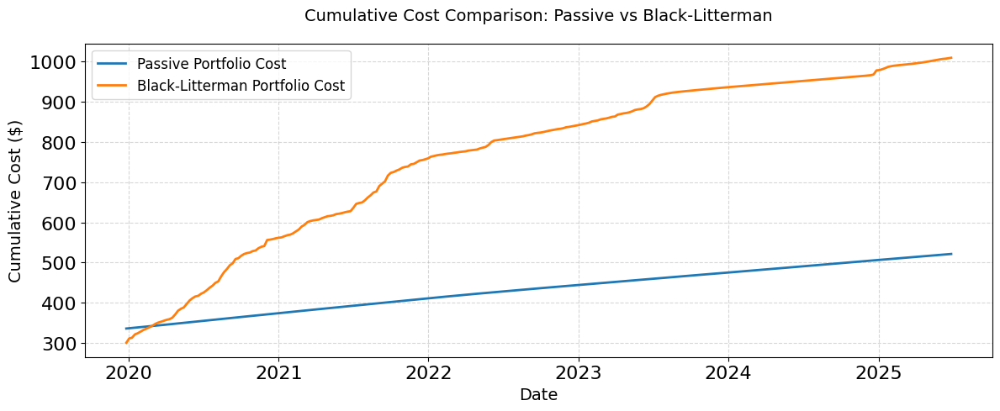

In [ ]:
# Plot cumulative cost comparison
plt.figure(figsize=(12, 5))
plt.plot(
    cum_cost_orig.loc[window_start:],
    label="Passive Portfolio Cost",
    linewidth=2
)
plt.plot(
    cum_cost_bl.loc[window_start:],
    label="Black-Litterman Portfolio Cost",
    linewidth=2
)
plt.title("Cumulative Cost Comparison: Passive vs Black-Litterman", fontsize=14, pad=20)
plt.ylabel("Cumulative Cost ($)", fontsize=14)
plt.xlabel("Date", fontsize=14)
plt.grid(True, linestyle="--", alpha=0.5)
plt.tick_params(axis="both", which="major", labelsize=16)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()



In [ ]:
# Define the evaluation window
eval_start = pd.Timestamp("2020-01-03")   # first Friday of 2020
eval_end   = pd.Timestamp("2025-06-27")   # last Friday before 30-Jun-25

# Prepare weekly return series *inside* that window
orig_ret = portfolio_returns.loc[eval_start:eval_end]
bl_ret   = bl_weekly_returns.loc[eval_start:eval_end]

rets_df = pd.DataFrame({
    "Original"        : orig_ret,
    "Black-Litterman" : bl_ret
})

# ────────────────────────────────────────────────
# Turnover (BL only) – restrict to same dates
# ────────────────────────────────────────────────
turnover_weekly = (
    bl_weights_panel.diff().abs().sum(axis=1)
      .reindex(weekly_returns.index).ffill().fillna(0.0)
      .loc[eval_start:eval_end]
)

# Helper for IR
def information_ratio(port_ret, bench_ret, periods=52):

    active = (port_ret - bench_ret).dropna()
    if active.empty:
        return np.nan
    ann_active = active.mean() * periods
    te         = active.std(ddof=0) * np.sqrt(periods)
    return ann_active / te if te else np.nan


# Risk-statistics helper
def risk_stats(r, weekly_rf_2019=weekly_rf_2019):
    r = r.dropna()

    # weekly excess vs risk-free
    weekly_excess = r - weekly_rf_2019
    w_mu  = weekly_excess.mean()
    w_std = r.std(ddof=0)
    w_var = w_std**2
    w_sharpe = w_mu / w_std if w_std else np.nan

    # draw-down
    nav = (1 + r).cumprod()
    dd  = nav / nav.cummax() - 1
    max_dd = dd.min()
    end_idx   = dd.idxmin()
    start_idx = dd.loc[:end_idx][dd.loc[:end_idx] == 0].index.max()
    dd_len = (end_idx - start_idx).days // 7

    # tails
    var95  = -np.percentile(r, 5)
    cvar95 = -r[r <= -var95].mean()

    return pd.Series({
        "Excess Return"       : w_mu,
        "Standard Deviation"  : w_std,
        "Variance"            : w_var,
        "Sharpe Ratio"        : w_sharpe,
        "Max-DD"              : max_dd,
        "DD (wks)"            : dd_len,
        "VaR 95%"             : var95,
        "CVaR 95%"            : cvar95,
    })


# Assemble the comparison table
bench_ret = weekly_returns["AGG"].loc[eval_start:eval_end]

stats_tbl = pd.concat({
    "Original":        risk_stats(orig_ret),
    "Black-Litterman": risk_stats(bl_ret),
}, axis=1).T

for lbl, series in {"Original": orig_ret, "Black-Litterman": bl_ret}.items():
    active   = (series - bench_ret).dropna()
    stats_tbl.loc[lbl, "Active Return"]   = active.mean()*52
    stats_tbl.loc[lbl, "Active Risk"]     = active.std(ddof=0)

stats_tbl["Turnover (wk %)"] = [0.0, turnover_weekly.mean()]
stats_tbl["Info Ratio"] = [
    information_ratio(orig_ret, bench_ret),
    information_ratio(bl_ret,   bench_ret)
]



stats_tbl.index.name = "Portfolio"

# Display
stats_tbl_vert = stats_tbl.T
stats_tbl_vert.index.name = "Metric"

# formatting
fmt_map = {
    "Excess Return"       : "{:.4%}",
    "Standard Deviation"  : "{:.4%}",
    "Variance"            : "{:.6%}",
    "Active Return"       : "{:.4%}",
    "Active Risk"         : "{:.4%}",
    "Max-DD"              : "{:.2%}",
    "VaR 95%"             : "{:.2%}",
    "CVaR 95%"            : "{:.2%}",
    "Turnover (wk %)"     : "{:.2%}",
    "Sharpe Ratio"        : "{:.2f}",
    "Info Ratio"          : "{:.2f}",
    "DD (wks)"            : "{:.0f}",
}

# build the Vertical Table Styler
vertical_table_styler = stats_tbl_vert.style

# Apply the appropriate format string to every metric (row)
for metric_name, printf_format in fmt_map.items():
    # subset = ( [row-label],   all_columns )
    vertical_table_styler = vertical_table_styler.format(
        printf_format,
        subset=([metric_name], slice(None))
    )

# Add a title
vertical_table_styler = vertical_table_styler.set_caption(
    "Weekly Performance Metrics (01/01/2020 to 30/06/2025)"
)


# Show the final, formatted table
display(vertical_table_styler)

Portfolio,Original,Black-Litterman
Metric,,
Excess Return,-0.0733%,-0.0251%
Standard Deviation,0.9156%,0.5571%
Variance,0.008383%,0.003103%
Sharpe Ratio,-0.08,-0.04
Max-DD,-24.55%,-10.39%
DD (wks),168,166
VaR 95%,1.52%,0.80%
CVaR 95%,1.98%,1.13%
Active Return,-0.1326%,2.3771%


# Confidence Tilt

Running model for confidence level: 0.05
Running model for confidence level: 0.15
Running model for confidence level: 0.25
Running model for confidence level: 0.35
Running model for confidence level: 0.45
Running model for confidence level: 0.50
Running model for confidence level: 0.55
Running model for confidence level: 0.65
Running model for confidence level: 0.75
Running model for confidence level: 0.85
Running model for confidence level: 0.95


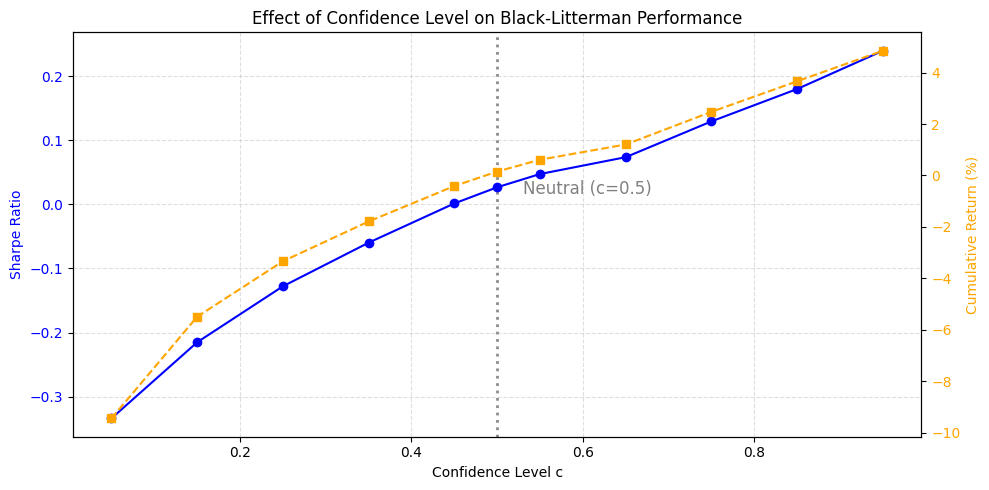

In [ ]:
c_values = np.linspace(0.05, 0.95, 10)
if 0.5 not in np.round(c_values, 4):
    c_values = np.append(c_values, 0.5)
c_values = np.sort(c_values)
window_length = best_window_length  # or set manually

c_results = []

for c in c_values:
    print(f"Running model for confidence level: {c:.2f}")
    result = run_bl_model(window_length=window_length, conf=c)
    result["confidence"] = c
    c_results.append(result)

# Collect into DataFrame
c_results_df = pd.DataFrame(c_results)

# Plot
fig, ax1 = plt.subplots(figsize=(10, 5))

ax1.plot(c_results_df["confidence"], c_results_df["sharpe_ratio"], label="Sharpe", marker="o", color="blue")
ax1.set_ylabel("Sharpe Ratio", color="blue")
ax1.tick_params(axis="y", labelcolor="blue")

# Add vertical line for c = 0.5
ax1.axvline(x=0.5, color="grey", linestyle=":", lw=2, alpha=0.9, zorder=0)
ax1.annotate(
    "Neutral (c=0.5)",
    xy=(0.53, ax1.get_ylim()[0] + 0.6 * (ax1.get_ylim()[1] - ax1.get_ylim()[0])),
    color="grey", fontsize=12
)

ax2 = ax1.twinx()
ax2.plot(c_results_df["confidence"], c_results_df["bl_cum_return"] * 100, label="Cumulative Return (%)", marker="s", linestyle="--", color="orange")
ax2.set_ylabel("Cumulative Return (%)", color="orange")
ax2.tick_params(axis="y", labelcolor="orange")

ax1.set_xlabel("Confidence Level c")
ax1.set_title("Effect of Confidence Level on Black-Litterman Performance")
ax1.grid(True, linestyle="--", alpha=0.4)

plt.tight_layout()
plt.show()


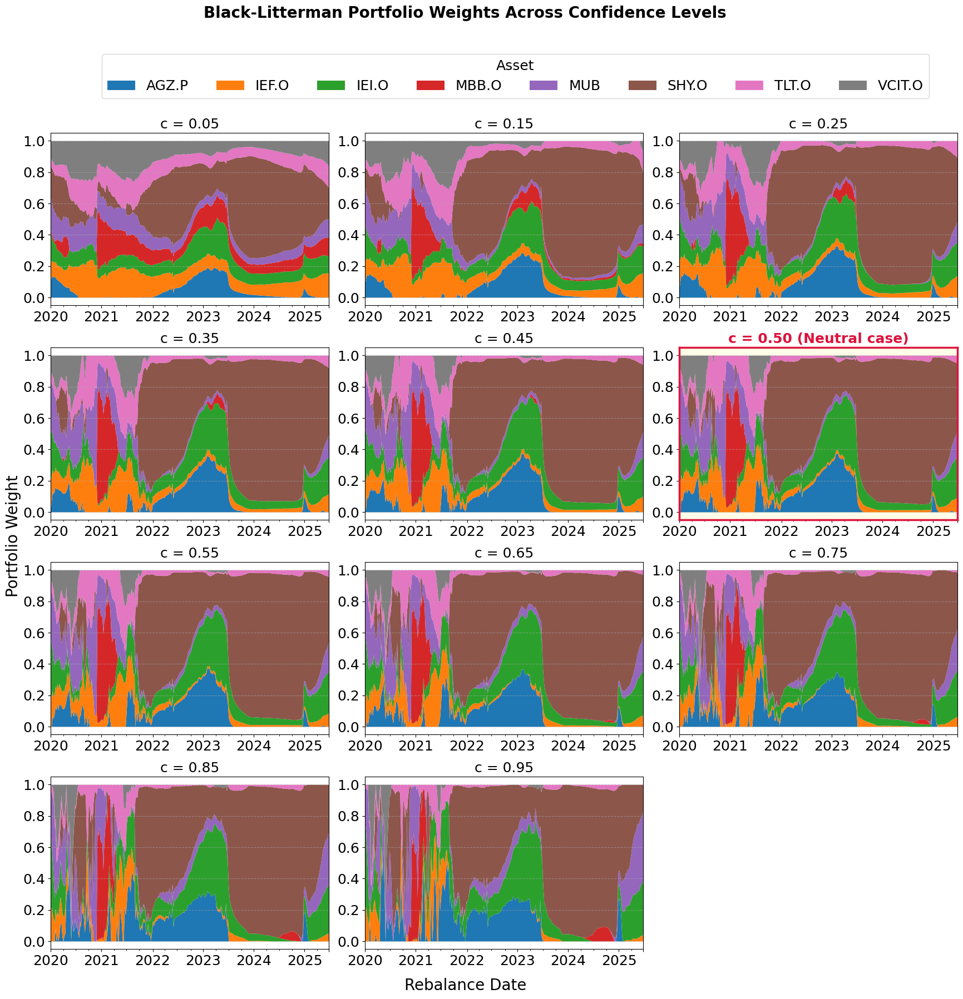

In [ ]:
import math

# Number of subplots
num_c = len(c_results)
cols = 3
rows = math.ceil(num_c / cols)

fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 4.5 * rows), sharex=False, sharey=False)

# Flatten axes array
axes = axes.flatten()

# Store one legend handle to create shared legend later
handles, labels = None, None

for i, result in enumerate(c_results):
    c = result["confidence"]
    bl_weights_panel = result["bl_weights_panel"]

    # Normalize to 100% allocation
    weights_normalised = bl_weights_panel.div(bl_weights_panel.sum(axis=1), axis=0)

    ax = axes[i]
    plot = weights_normalised.plot.area(ax=ax, linewidth=0)

    # Highlight the c=0.5 plot
    if np.isclose(c, 0.5, atol=1e-3):
        ax.set_facecolor("#fffde7")  # Light yellow
        ax.set_title(f"c = {c:.2f} (Neutral case)", fontsize=18, color="crimson", weight="bold")
        # Thicker red border
        for spine in ax.spines.values():
            spine.set_edgecolor("crimson")
            spine.set_linewidth(2.5)
    else:
        ax.set_title(f"c = {c:.2f}", fontsize=18)

    # Keep ticks, remove individual axis titles
    ax.tick_params(axis="both", which="major", labelsize=18)
    ax.grid(True, axis='y', linestyle="--", alpha=0.5)

    # Save legend handles just once
    if handles is None or labels is None:
        handles, labels = ax.get_legend_handles_labels()

    ax.get_legend().remove()  # remove individual legend

# Remove unused axes if any
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Add shared axis titles (but keep ticks on each subplot)
fig.text(0.5, 0.046, "Rebalance Date", ha="center", fontsize=20)
fig.text(0.041, 0.5, "Portfolio Weight", va="center", rotation="vertical", fontsize=20)

# Add a shared legend below all subplots
fig.legend(
    handles,
    labels,
    title="Asset",
    loc="lower center",
    ncol=len(labels),
    fontsize=18,
    title_fontsize=18,
    bbox_to_anchor=(0.55, 0.93)
)

fig.suptitle("Black-Litterman Portfolio Weights Across Confidence Levels", fontsize=20, weight='bold', y=1.03)

plt.tight_layout(rect=[0.05, 0.06, 1, 0.95])
plt.show()


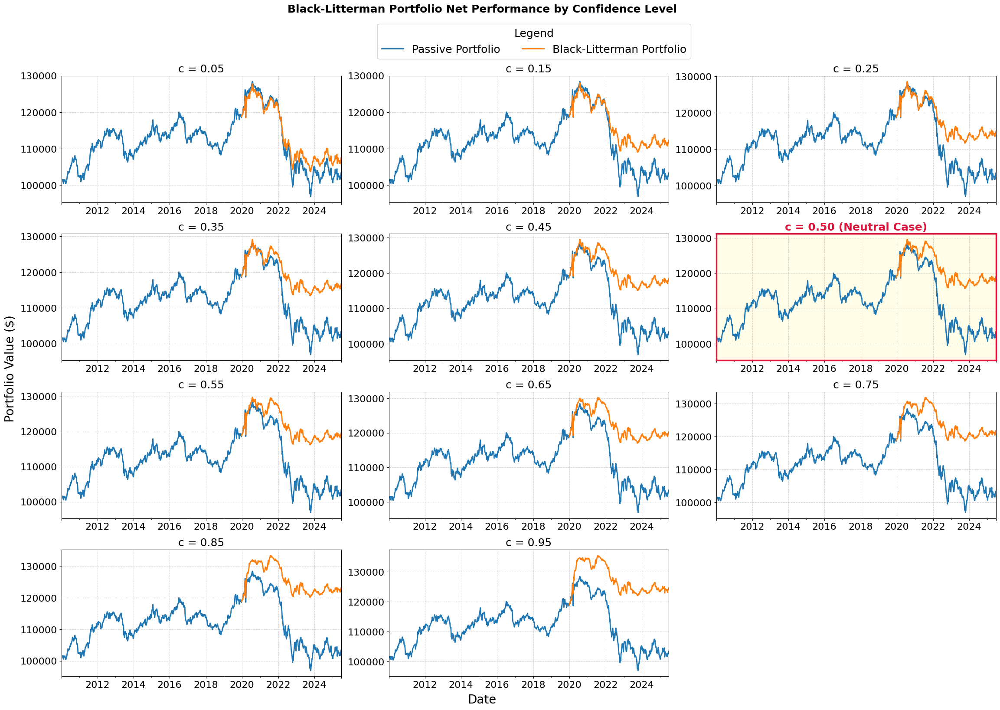

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import math

num_c = len(c_results)
cols = 3  # 3 charts per row
rows = math.ceil(num_c / cols)

fig, axes = plt.subplots(rows, cols, figsize=(8 * cols, 4.2 * rows), sharex=False)

# Flatten axes for easy indexing
axes = axes.flatten()

legend_handles = []
legend_labels = []

for i, result in enumerate(c_results):
    c = result["confidence"]
    bl_returns_net_series = result["bl_returns_net_series"]
    bl_weights_panel = result["bl_weights_panel"]

    # Align weights
    aligned_weights = (
        bl_weights_panel.reindex(weekly_returns.index)
                        .ffill()
                        .fillna(0.0)
    )

    # === (Only) NET PERFORMANCE ===
    bl_cum_net = (1 + bl_returns_net_series.loc[anchor_dt:]).cumprod() * portfolio_cum_net.loc[:anchor_dt].iloc[-1]
    bl_cum_net = pd.concat([pd.Series(index=portfolio_cum_net.loc[:anchor_dt].index[:-1]), bl_cum_net])

    df_net = pd.DataFrame({
        "Passive (Net)": portfolio_cum_net,
        "BL (Net)": bl_cum_net,
    })

    ax = axes[i]
    df_net.plot(ax=ax, linewidth=2)

    # === HIGHLIGHT c = 0.5 ROW ===
    if np.isclose(c, 0.5, atol=1e-3):
        ax.set_facecolor("#fffde7")
        ax.set_title(f"c = {c:.2f} (Neutral Case)", fontsize=18, color="crimson", weight="bold")
        for spine in ax.spines.values():
            spine.set_edgecolor("crimson")
            spine.set_linewidth(2.5)
    else:
        ax.set_title(f"c = {c:.2f}", fontsize=18)

    # Increase tick font size
    ax.tick_params(axis="both", which="major", labelsize=16)

    # Keep ticks, remove individual axis titles
    ax.grid(True, linestyle="--", alpha=0.5)

    if i == 0:
        legend_handles, _ = ax.get_legend_handles_labels()
        legend_labels = ["Passive Portfolio", "Black-Litterman Portfolio"]
    ax.get_legend().remove()

# Remove unused axes if any
for j in range(len(c_results), len(axes)):
    fig.delaxes(axes[j])

# Shared legend
fig.legend(
    handles=legend_handles,
    labels=legend_labels,
    title="Legend",
    loc="upper center",
    ncol=2,
    fontsize=18,
    title_fontsize=18,
    bbox_to_anchor=(0.55, 0.98)
)

# Common suptitle for all charts
fig.suptitle(
    "Black-Litterman Portfolio Net Performance by Confidence Level",
    fontsize=18,
    color="black",
    weight="bold",
    y=1.00
)

# === Shared axis labels ===
fig.text(0.5, 0.040, "Date", ha="center", fontsize=20)
fig.text(0.041, 0.5, "Portfolio Value ($)", va="center", rotation="vertical", fontsize=20)

plt.tight_layout(rect=[0.05, 0.05, 1, 0.95])
plt.show()


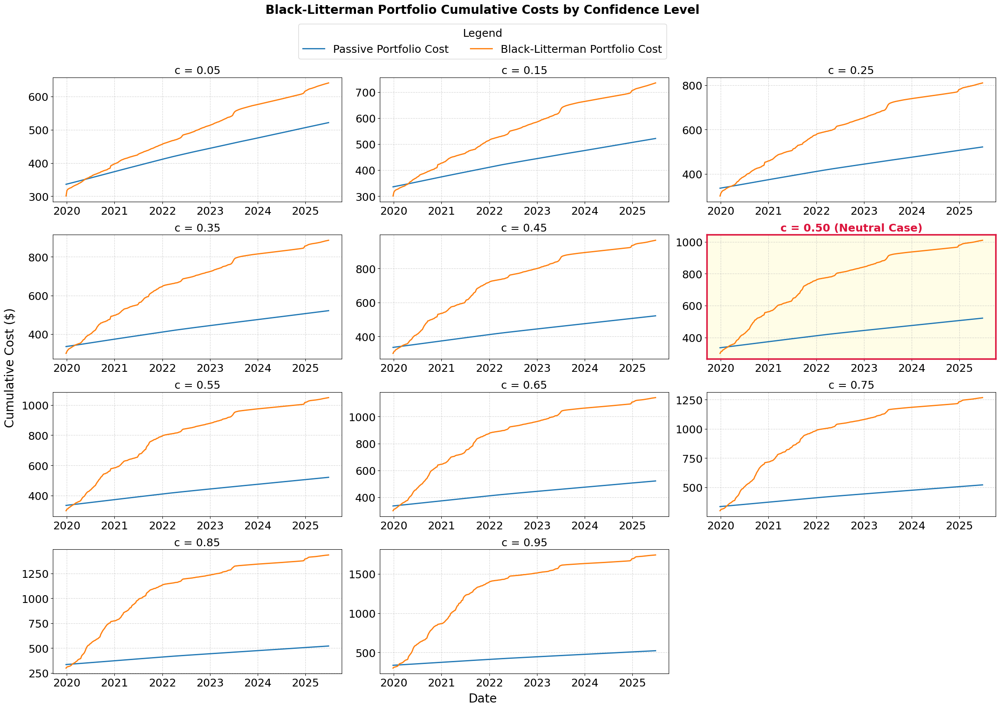

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import math

num_c = len(c_results)
cols = 3  # 3 charts per row
rows = math.ceil(num_c / cols)

fig, axes = plt.subplots(rows, cols, figsize=(8 * cols, 4.2 * rows), sharex=False)
axes = axes.flatten()

legend_handles = []
legend_labels = []

for i, result in enumerate(c_results):
    c = result["confidence"]
    bl_returns_net_series = result["bl_returns_net_series"]
    bl_weights_panel = result["bl_weights_panel"]

    # Align weights
    aligned_weights = (
        bl_weights_panel.reindex(weekly_returns.index)
                        .ffill()
                        .fillna(0.0)
    )

    # --- CUMULATIVE COST COMPARISON ---
    txn_cost_rates = pd.Series(etfstxn_costs)
    weight_changes = aligned_weights.diff().abs().fillna(0)
    txn_cost_matrix = weight_changes.mul(txn_cost_rates, axis=1) * initial_investment
    txn_cost_weekly = txn_cost_matrix.sum(axis=1)

    bl_cum_gross = (1 + bl_returns_net_series).cumprod() * initial_investment
    mgmt_cost_bl = bl_cum_gross.shift(1).fillna(initial_investment) * weekly_fee

    total_cost_bl = mgmt_cost_bl + txn_cost_weekly
    cum_cost_bl = total_cost_bl.cumsum()

    ax = axes[i]
    ax.plot(cum_cost_orig.loc[anchor_dt:], label="Passive Portfolio Cost", linewidth=2)
    ax.plot(cum_cost_bl.loc[anchor_dt:], label="Black-Litterman Portfolio Cost", linewidth=2)

    # Highlight c = 0.5
    if np.isclose(c, 0.5, atol=1e-3):
        ax.set_facecolor("#fffde7")
        ax.set_title(f"c = {c:.2f} (Neutral Case)", fontsize=18, color="crimson", weight="bold")
        for spine in ax.spines.values():
            spine.set_edgecolor("crimson")
            spine.set_linewidth(2.5)
    else:
        ax.set_title(f"c = {c:.2f}", fontsize=18)

    # Increase tick font size (axis values)
    ax.tick_params(axis="both", which="major", labelsize=18)

    ax.grid(True, linestyle="--", alpha=0.5)

    if i == 0:
        legend_handles, _ = ax.get_legend_handles_labels()
        legend_labels = ["Passive Portfolio Cost", "Black-Litterman Portfolio Cost"]

    leg = ax.get_legend()
    if leg is not None:
        leg.remove()

# Remove unused axes if any
for j in range(len(c_results), len(axes)):
    fig.delaxes(axes[j])

# Shared legend
fig.legend(
    handles=legend_handles,
    labels=legend_labels,
    title="Legend",
    loc="upper center",
    ncol=2,
    fontsize=18,
    title_fontsize=18,
    bbox_to_anchor=(0.5, 0.98)
)

# Common suptitle for all charts
fig.suptitle(
    "Black-Litterman Portfolio Cumulative Costs by Confidence Level",
    fontsize=20,
    color="black",
    weight="bold",
    y=1.00
)

# === Shared axis labels ===
fig.text(0.5, 0.04, "Date", ha="center", fontsize=20)
fig.text(0.04, 0.5, "Cumulative Cost ($)", va="center", rotation="vertical", fontsize=20)

plt.tight_layout(rect=[0.05, 0.05, 1, 0.95])
plt.show()


In [ ]:
# Container for results
results = {}

# Loop through each confidence level result
for result in c_results:
    c = result["confidence"]
    bl_ret = result["bl_returns_net_series"].loc[eval_start:eval_end]
    bl_weights_panel = result["bl_weights_panel"]

    # Risk stats for BL portfolio
    stats = risk_stats(bl_ret)

    # Active return/risk vs benchmark
    active = (bl_ret - bench_ret).dropna()
    stats["Active Return"] = active.mean() * 52
    stats["Active Risk"]   = active.std(ddof=0)

    # Turnover
    turnover_weekly = (
        bl_weights_panel.diff().abs().sum(axis=1)
          .reindex(weekly_returns.index).ffill().fillna(0.0)
          .loc[eval_start:eval_end]
    )
    stats["Turnover (wk %)"] = turnover_weekly.mean()

    # Information ratio
    stats["Info Ratio"] = information_ratio(bl_ret, bench_ret)

    # Save under label
    results[f"BL (c={c:.2f})"] = stats

# Always include original passive portfolio for comparison
stats_orig = risk_stats(orig_ret)
active = (orig_ret - bench_ret).dropna()
stats_orig["Active Return"] = active.mean() * 52
stats_orig["Active Risk"]   = active.std(ddof=0)
stats_orig["Turnover (wk %)"] = 0.0
stats_orig["Info Ratio"] = information_ratio(orig_ret, bench_ret)

results["Original"] = stats_orig

# Build final DataFrame
stats_tbl_conf = pd.DataFrame(results).T
stats_tbl_conf.index.name = "Portfolio"

# Format nicely (vertical layout optional)
stats_tbl_conf_vert = stats_tbl_conf.T

fmt_map = {
    "Excess Return"       : "{:.4%}",
    "Standard Deviation"  : "{:.4%}",
    "Variance"            : "{:.6%}",
    "Active Return"       : "{:.4%}",
    "Active Risk"         : "{:.4%}",
    "Max-DD"              : "{:.2%}",
    "VaR 95%"             : "{:.2%}",
    "CVaR 95%"            : "{:.2%}",
    "Turnover (wk %)"     : "{:.2%}",
    "Sharpe Ratio"        : "{:.2f}",
    "Info Ratio"          : "{:.2f}",
    "DD (wks)"            : "{:.0f}",
}

styled_tbl = stats_tbl_conf_vert.style.set_caption(
    "Weekly Performance Metrics Across Confidence Levels"
)

for metric_name, printf_format in fmt_map.items():
    styled_tbl = styled_tbl.format(printf_format, subset=([metric_name], slice(None)))

display(styled_tbl)


Portfolio,BL (c=0.05),BL (c=0.15),BL (c=0.25),BL (c=0.35),BL (c=0.45),BL (c=0.50),BL (c=0.55),BL (c=0.65),BL (c=0.75),BL (c=0.85),BL (c=0.95),Original
Excess Return,-0.0612%,-0.0469%,-0.0392%,-0.0337%,-0.0289%,-0.0269%,-0.0253%,-0.0233%,-0.0190%,-0.0149%,-0.0111%,-0.0733%
Standard Deviation,0.6917%,0.5974%,0.5723%,0.5647%,0.5586%,0.5571%,0.5566%,0.5565%,0.5575%,0.5623%,0.5370%,0.9156%
Variance,0.004785%,0.003569%,0.003275%,0.003189%,0.003120%,0.003104%,0.003098%,0.003097%,0.003109%,0.003162%,0.002884%,0.008383%
Sharpe Ratio,-0.09,-0.08,-0.07,-0.06,-0.05,-0.05,-0.05,-0.04,-0.03,-0.03,-0.02,-0.08
Max-DD,-18.80%,-14.77%,-13.19%,-12.18%,-11.18%,-10.73%,-10.40%,-10.17%,-10.04%,-9.94%,-9.95%,-24.55%
DD (wks),168,166,166,166,166,166,166,114,114,114,114,168
VaR 95%,1.11%,0.88%,0.87%,0.85%,0.84%,0.81%,0.77%,0.74%,0.72%,0.72%,0.69%,1.52%
CVaR 95%,1.50%,1.27%,1.23%,1.20%,1.16%,1.13%,1.12%,1.11%,1.08%,1.06%,1.03%,1.98%
Active Return,0.4993%,1.2409%,1.6417%,1.9270%,2.1772%,2.2792%,2.3622%,2.4682%,2.6942%,2.9042%,3.1036%,-0.1326%
Active Risk,0.2958%,0.4112%,0.4544%,0.4699%,0.4758%,0.4774%,0.4785%,0.4791%,0.4772%,0.4787%,0.5066%,0.1780%


# ..............................

## APPLICATION FOR FUTURE PERIODS ##

# Identify Regimes Probability 2003 to 2025

Full Regime Table 


,VIX,MOVE,Total,Regime_full
Date,,,,
2003-01-03,24.32,120.02,144.34,1
2003-01-10,25.70,116.02,141.72,1
2003-01-17,31.51,109.41,140.92,1
2003-01-24,31.17,110.89,142.06,1
2003-01-31,34.01,115.49,149.50,1
...,...,...,...,...
2025-05-30,16.77,89.65,106.42,1
2025-06-06,20.82,95.31,116.13,1
2025-06-13,20.62,90.10,110.72,1


Regime Summary Table


,VIX,MOVE
Regime_full,,
0,14.282346,69.533291
1,24.573550,107.442862


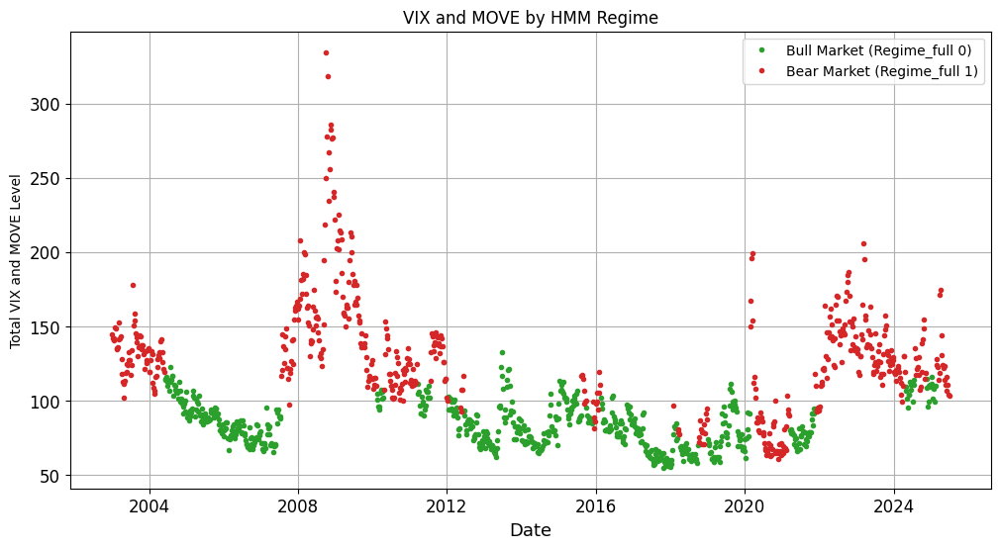

In [ ]:
# Extract and clean the data
vix_df = dfs["VIX Data.csv"].copy()
move_df = dfs["MOVE Data.csv"].copy()

vix_df['Date'] = pd.to_datetime(vix_df['Date'], dayfirst=True)
move_df['Date'] = pd.to_datetime(move_df['Date'], dayfirst=True)

# Filter for 2005 to 2025
vix_df = vix_df[(vix_df['Date'].dt.year >= 2003) & (vix_df['Date'].dt.year <= 2025)]
move_df = move_df[(move_df['Date'].dt.year >= 2003) & (move_df['Date'].dt.year <= 2025)]


# Extract just the 'Price' column and rename
vix_df = vix_df[['Date', 'Price']].rename(columns={"Price": "VIX"})
move_df = move_df[['Date', 'Price']].rename(columns={"Price": "MOVE"})

# Set the date as index
vix_df.set_index('Date', inplace=True)
move_df.set_index('Date', inplace=True)

# Combine and align
macro_df = pd.concat([vix_df, move_df], axis=1).dropna()
macro_df.index = macro_df.index - pd.Timedelta(days=2) # Move from Sunday to Friday

# Scale the features
scaler = StandardScaler().fit(macro_df)
X_scaled = scaler.transform(macro_df)

# Fit HMM
model = GaussianHMM(n_components=2, covariance_type="full", n_iter=1000, random_state=42)
model.fit(X_scaled)
regimes = model.predict(X_scaled)

# Stored combined VIX + MOVE and regimes in DataFrame
macro_df['Total'] = macro_df['VIX'] + macro_df['MOVE']
macro_df['Regime_full'] = regimes

# Compute regime-level average values to help interpret them
regime_summary = macro_df.groupby("Regime_full")[["VIX", "MOVE"]].mean()

print("Full Regime Table ")
display(macro_df)
print("Regime Summary Table")
display(regime_summary)

# Assign custom labels
vol_score = regime_summary["VIX"] + regime_summary["MOVE"]
sorted_regimes = vol_score.sort_values().index.tolist()

regime_name = {
    sorted_regimes[0]: "Bull Market",
    sorted_regimes[1]: "Bear Market"
}

# Colors
label_colors = {
    "Bull Market": '#2ca02c',
    "Bear Market": '#d62728'
}

# Plot regimes
plt.figure(figsize=(12, 6))
ax = plt.gca()
for i in range(model.n_components):
    mask = macro_df['Regime_full'] == i
    plt.plot(macro_df.index[mask], macro_df['Total'][mask], '.', label=f"{regime_name[i]} (Regime_full {i})", color=label_colors[regime_name[i]])
ax.tick_params(axis="both", which="major", labelsize=12)
plt.legend()
plt.title("VIX and MOVE by HMM Regime")
plt.xlabel("Date", fontsize=13)
plt.ylabel("Total VIX and MOVE Level")
plt.grid(True)
plt.show()

,Bull Market,Bear Market
Date,,
2003-01-03,0.0000,1.0000
2003-01-10,0.0000,1.0000
2003-01-17,0.0000,1.0000
2003-01-24,0.0000,1.0000
2003-01-31,0.0000,1.0000
...,...,...
2025-05-30,0.2320,0.7680
2025-06-06,0.2520,0.7480
2025-06-13,0.3504,0.6496


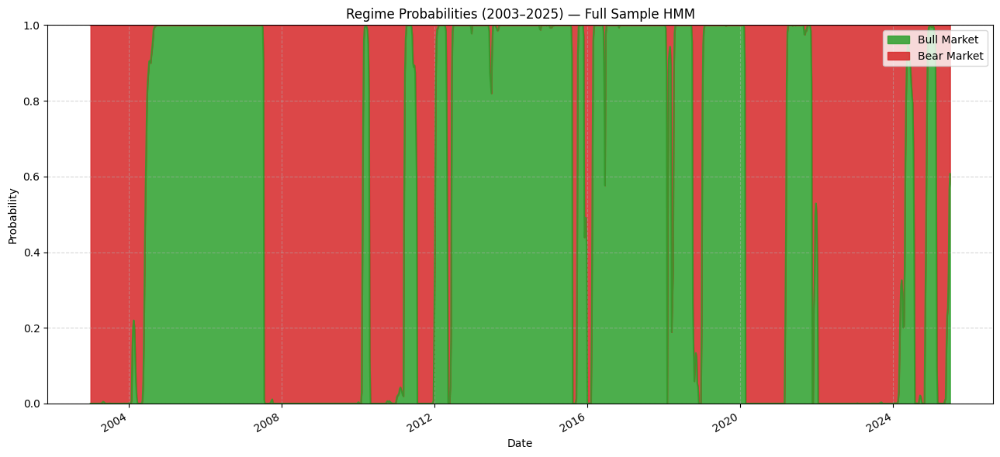

In [ ]:
# Standardize VIX & MOVE over the full period
scaler= StandardScaler()
X_scaled = scaler.fit_transform(macro_df[["VIX", "MOVE"]])

# Get regime probabilities for each week
regime_probs = model.predict_proba(X_scaled)
regime_probs_df = pd.DataFrame(
    regime_probs,
    index=macro_df.index,
    columns=[f"Regime_full {i}" for i in range(model.n_components)]
)

# Determine which regime is high or Bull Market
macro_df["Regime_full"] = model.predict(X_scaled)
regime_summary = macro_df.groupby("Regime_full")[["VIX", "MOVE"]].mean()
vol_score = regime_summary["VIX"] + regime_summary["MOVE"]
sorted_regimes = vol_score.sort_values().index.tolist()

# Rename columns to "Bull Market" and "Bear Market"
regime_name_map = {
    sorted_regimes[0]: "Bull Market",
    sorted_regimes[1]: "Bear Market"
}
regime_probs_df = regime_probs_df.rename(columns={f"Regime_full {i}": regime_name_map[i] for i in range(2)})
regime_probs_df = regime_probs_df.reindex(columns=["Bull Market", "Bear Market"])

# Display table
display(regime_probs_df.round(4))

# Plot stacked area chart of regime probabilities
plt.figure(figsize=(13, 6))
regime_probs_df.plot.area(
    stacked=True,
    ax=plt.gca(),
    alpha=0.85,
    color=["#2ca02c", "#d62728"]  # green = low, red = high
)

plt.title("Regime Probabilities (2003–2025) — Full Sample HMM")
plt.ylabel("Probability")
plt.xlabel("Date")
plt.ylim(0, 1)
plt.grid(True, linestyle="--", alpha=0.5)
plt.legend(loc="upper right")
plt.tight_layout()
plt.show()


In [ ]:
# ----------------------------------------------------------------
# Mapping dictionaries for each fit
regime_labels = ["Bull Market", "Bear Market"]

# ----------------------------------------------------------------
# Weekly ground-truth series that spans **every Friday** and uses the FULL-sample fit  (no label flip possible)
# ----------------------------------------------------------------
weekly_regime_full = (
    macro_df["Regime_full"]            # untouched numeric states
      .map(regime_name)                # map with the *matching* dictionary
      .resample("W-FRI")
      .agg(lambda s: s.mode().iat[0] if not s.mode().empty else np.nan)
      .ffill()                         # fill market holidays
      .astype(pd.CategoricalDtype(categories=regime_labels, ordered=True))
)
# ----------------------------------------------------------------
# Helpers  (row probs, transition matrix, rolling forecast)
# ----------------------------------------------------------------

def _row_probs(labels: pd.Series, states) -> np.ndarray:
    counts = labels.value_counts().reindex(states, fill_value=0).astype(float)
    s = counts.sum()
    return (counts / s).to_numpy() if s else np.ones(len(states)) / len(states)

def _trans_matrix(labels: pd.Series, states) -> np.ndarray:  # alpha: float = 1e-6, add this in case need smoothing
    tc = (pd.crosstab(labels.shift(), labels)
            .reindex(index=states, columns=states, fill_value=0)
            .astype(float))
    # tc += alpha # uncomment this for smoothing
    tm = tc.div(tc.sum(axis=1), axis=0).fillna(0.0)
    return tm.to_numpy()

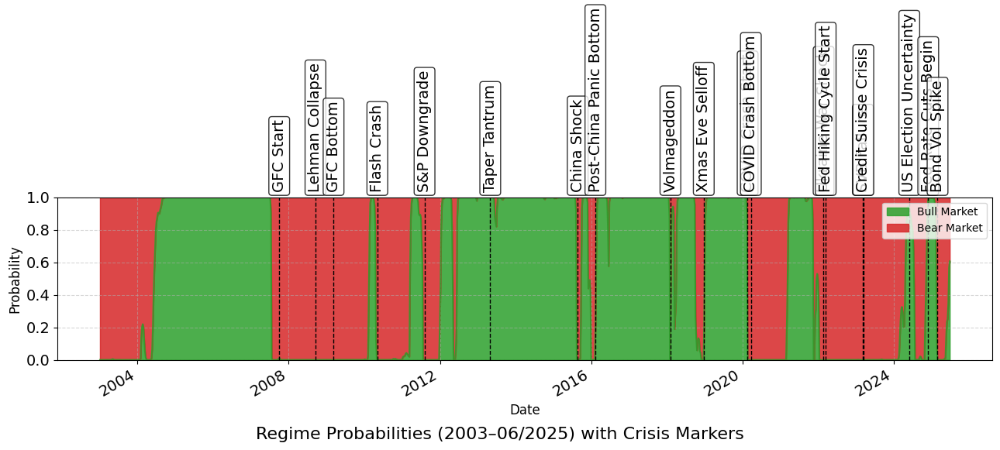

In [ ]:
# Plot stacked area chart of regime probabilities
fig, ax1 = plt.subplots(figsize=(13, 6))

# Plot regime probabilities
regime_probs_df.plot.area(
    stacked=True,
    ax=ax1,
    alpha=0.85,
    color=["#2ca02c", "#d62728"]
)

# Define crisis periods with labels (for vertical lines + labels)
crisis_events = [
    ("2007-10-01", "GFC Start"),
    ("2008-09-15", "Lehman Collapse"),
    ("2009-03-09", "GFC Bottom"),
    ("2010-05-06", "Flash Crash"),
    ("2011-08-05", "S&P Downgrade"),
    ("2013-05-01", "Taper Tantrum"),
    ("2015-08-24", "China Shock"),
    ("2016-02-11", "Post-China Panic Bottom"),
    ("2018-02-05", "Volmageddon"),
    ("2018-12-24", "Xmas Eve Selloff"),
    ("2020-02-21", "COVID Crash Start"),
    ("2020-03-23", "COVID Crash Bottom"),
    ("2022-02-24", "Ukraine War Shock"),
    ("2022-03-16", "Fed Hiking Cycle Start"),
    ("2023-03-10", "SVB Failure"),
    ("2023-03-15", "Credit Suisse Crisis"),
    ("2024-06-01", "US Election Uncertainty"),
    ("2024-12-01", "Fed Rate Cuts Begin"),
    ("2025-03-01", "Bond Vol Spike"),
]

# Add vertical dashed lines and labels
for date_str, label in crisis_events:
    event_date = pd.to_datetime(date_str)
    ax1.axvline(event_date, color="black", linestyle="--", linewidth=1)
    ax1.text(event_date, 1.03, label, rotation=90, ha='center', va='bottom',
             fontsize=14, bbox=dict(boxstyle="round,pad=0.2", fc="white", ec="black", alpha=0.8))

# Clean up legend to avoid duplicates
handles, labels = ax1.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax1.legend(by_label.values(), by_label.keys(), loc="upper right")

# Final plot settings
fig.suptitle("Regime Probabilities (2003–06/2025) with Crisis Markers", fontsize=16, y=0.005)
ax1.set_ylabel("Probability", fontsize=12)
ax1.set_xlabel("Date", fontsize=12)
ax1.set_ylim(0, 1)
ax1.grid(True, linestyle="--", alpha=0.5)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.tight_layout()
plt.show()


# Predicting Future Regime 07/2020 - 2030

In [ ]:
# Define windows
train_start, train_end = "2003-01-01", "2025-06-30"

regime_labels = ["Bull Market", "Bear Market"]

# Map numeric regimes to labels once
macro_df["Regime with Labels"] = macro_df["Regime_full"].map(regime_name)
macro_df["Regime with Labels"] = pd.Categorical(
    macro_df["Regime with Labels"],
    categories=["Bull Market", "Bear Market"],
    ordered=True
)

# Training sample (2003–2006/2025): state probs + transition probs
regime = macro_df.loc[train_start:train_end, "Regime with Labels"].dropna()

regime

,Regime with Labels
Date,
2003-01-03,Bear Market
2003-01-10,Bear Market
2003-01-17,Bear Market
2003-01-24,Bear Market
2003-01-31,Bear Market
...,...
2025-05-30,Bear Market
2025-06-06,Bear Market
2025-06-13,Bear Market


In [ ]:
# Build weekly labeled regimes for 2003–2019
weekly_regime = (
    macro_df["Regime_full"]
    .map(regime_name)
    .resample("W-FRI")
    .agg(lambda s: s.mode().iat[0] if not s.mode().empty else np.nan)
    .dropna()
).astype(pd.CategoricalDtype(categories=regime_labels, ordered=True))

# Rolling window length from the WEEKLY series
W_hmm = 886

# Start labels with the weekly history
labels_series = weekly_regime.copy()

# Forecast dates (Fridays)
forecast_dates = pd.date_range(start="2025-07-04", end="2030-12-31", freq="W-FRI")

# Rolling forecast from 2020-01-03 onward
rows = []
row_probs_all = {}
trans_probs_all = {}

for i, t in enumerate(forecast_dates):
    prev_friday = labels_series.index[labels_series.index < t].max()

    # For the first forecast step, use entire pre-2020 history
    if i == 0:
        window_labels = labels_series.copy()
    else:
        window_labels = labels_series.loc[:prev_friday].iloc[-W_hmm:]

    # Compute rolling regime probabilities and transition matrix
    p_t = _row_probs(window_labels, regime_labels)  # shape (2,)
    T_t = _trans_matrix(window_labels, regime_labels)  # shape (2,2)
    p_next = p_t @ T_t  # shape (2,)

    # Save probabilities
    rows.append((t, p_next[0], p_next[1]))

    # Store row probs and transition matrix
    row_probs_all[t] = pd.Series(p_t, index=regime_labels, name=t)
    trans_probs_all[t] = pd.DataFrame(T_t, index=regime_labels, columns=regime_labels)

    # Append MAP label for the next step
    labels_series.loc[t] = regime_labels[int(np.argmax(p_next))]
    labels_series = labels_series.astype(pd.CategoricalDtype(categories=regime_labels, ordered=True))


# Rolling Window
print(f"\nRolling window length: {W_hmm} weeks")

# Combine row probabilities (each row is one forecast date)
row_probs_all_df = pd.DataFrame(row_probs_all).T
row_probs_all_df.index.name = "Date"
row_probs_all_df.columns.name = "Regime"
print("\nRolling Row Probabilities:")
display(row_probs_all_df)

# Combine transition matrices (each block is one forecast date)
trans_probs_all_df = pd.concat(trans_probs_all, names=["Date", "From"])
trans_probs_all_df.columns.name = "To"
print("\nRolling Transition Matrices:")
display(trans_probs_all_df)

# Combine forecast probabilities
regime_probs_pred_df = pd.DataFrame(rows, columns=["Date"] + regime_labels).set_index("Date")
print("\nForecasted Regime Probabilities (2020–2025) from Rolling Markov Model")
display(regime_probs_pred_df)



Rolling window length: 886 weeks

Rolling Row Probabilities:


Regime,Bull Market,Bear Market
Date,,
2025-07-04,0.541347,0.458653
2025-07-11,0.533860,0.466140
2025-07-18,0.534989,0.465011
2025-07-25,0.536117,0.463883
2025-08-01,0.537246,0.462754
...,...,...
2030-11-29,0.714447,0.285553
2030-12-06,0.714447,0.285553
2030-12-13,0.714447,0.285553



Rolling Transition Matrices:


To                      Bull Market  Bear Market
Date       From                                 
2025-07-04 Bull Market     0.979528     0.020472
           Bear Market     0.024209     0.975791
2025-07-11 Bull Market     0.974576     0.025424
           Bear Market     0.031477     0.968523
2025-07-18 Bull Market     0.974630     0.025370
...                             ...          ...
2030-12-13 Bear Market     0.035573     0.964427
2030-12-20 Bull Market     0.985759     0.014241
           Bear Market     0.035573     0.964427
2030-12-27 Bull Market     0.985759     0.014241
           Bear Market     0.035573     0.964427

[574 rows x 2 columns]


Forecasted Regime Probabilities (2020–2025) from Rolling Markov Model


,Bull Market,Bear Market
Date,,
2025-07-04,0.541368,0.458632
2025-07-11,0.534960,0.465040
2025-07-18,0.536089,0.463911
2025-07-25,0.537217,0.462783
2025-08-01,0.538346,0.461654
...,...,...
2030-11-29,0.714431,0.285569
2030-12-06,0.714431,0.285569
2030-12-13,0.714431,0.285569


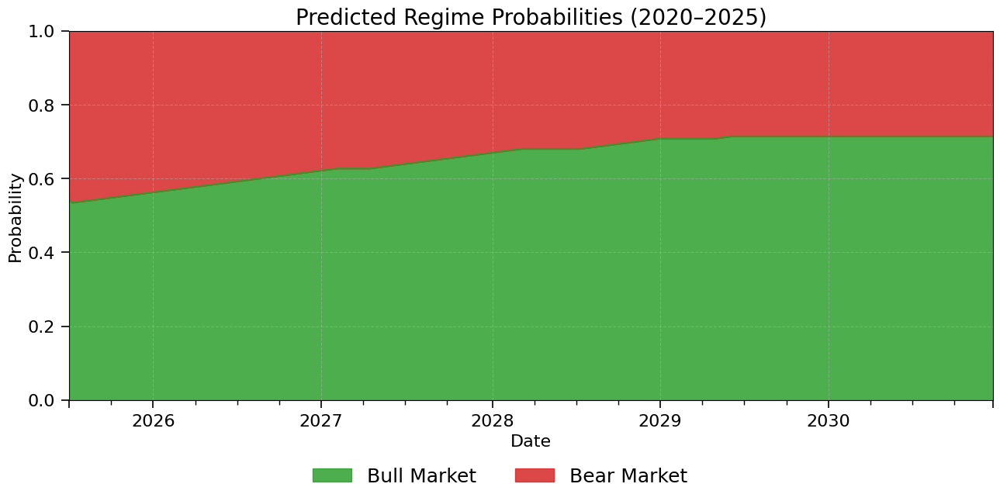

In [ ]:
# Filter regime probabilities to 2020–2025
pred_probs_2025_2030 = regime_probs_pred_df

import matplotlib.pyplot as plt

# Assume regime_probs_pred_df columns: ["Bull Market", "Bear Market"]
regime_colors = {
    "Bull Market": "#2ca02c",
    "Bear Market": "#d62728"
}
color_list = [regime_colors[col] for col in pred_probs_2025_2030.columns]

fig, ax = plt.subplots(figsize=(13, 6))

pred_probs_2025_2030.plot.area(
    ax=ax, stacked=True, alpha=0.85, color=color_list
)
ax.set_title("Predicted Regime Probabilities (2020–2025)", fontsize=20)
ax.set_xlabel("Date", fontsize=16)
ax.set_ylabel("Probability", fontsize=16)
ax.grid(True, linestyle="--", alpha=0.5)
ax.set_ylim(0, 1)

# Make tick-label numbers and tick marks bigger
ax.tick_params(axis="both", which="major",
               labelsize=16, length=7, width=1.2, pad=6)
ax.tick_params(axis="both", which="minor",
               labelsize=14, length=4, width=1.0)

# Clean up legend and place it below
handles, labels = ax.get_legend_handles_labels()
ax.get_legend().remove()
fig.legend(
    handles, labels,
    loc="lower center",
    ncol=len(pred_probs_2025_2030.columns),
    frameon=False,
    fontsize=18,
    bbox_to_anchor=(0.5, -0.09)
)

fig.subplots_adjust(bottom=0.16)  # More space for legend

plt.tight_layout()
plt.show()



# Regime Expected Return 2010 - 06/2025




In [ ]:
# Build a labeled regime series
if "Regime with Labels" in macro_df.columns:
    regime_series = macro_df["Regime with Labels"].copy()
else:
    regime_series = macro_df["Regime_full"].map(regime_name)

# Collapse to weekly Friday by taking the mode (most frequent) within each week
weekly_regime = (
    regime_series.resample("W-FRI")
    .agg(lambda s: s.mode().iat[0] if not s.mode().empty else np.nan)
    .rename("Regime_full")
)

# Weekly return 2010 -06/2025
weekly_returns = weekly_prices.pct_change().dropna()

# Join the label
weekly_returns_labeled = weekly_returns.join(weekly_regime, how="left")

# make the label an ordered categorical
weekly_returns_labeled["Regime_full"] = pd.Categorical(
    weekly_returns_labeled["Regime_full"],
    categories=["Bull Market", "Bear Market"],
    ordered=True
)

# Split
low_tbl  = weekly_returns_labeled.loc[weekly_returns_labeled["Regime_full"]=="Bull Market"].drop(columns="Regime_full")
high_tbl = weekly_returns_labeled.loc[weekly_returns_labeled["Regime_full"]=="Bear Market"].drop(columns="Regime_full")

low_tbl_percent  = low_tbl * 100
high_tbl_percent = high_tbl * 100

print("=== Weekly Returns — Bull Market (2010 - 06/2025) ===")
display(low_tbl_percent.head().style.format("{:.4f}%"))
print("\n=== Weekly Returns — Bear Market (2010 - 06/2025) ===")
display(high_tbl_percent.head().style.format("{:.4f}%"))

=== Weekly Returns — Bull Market (2010 - 06/2025) ===


,AGZ.P,IEI.O,SHY.O,IEF.O,MUB,MBB.O,TLT.O,VCIT.O,AGG
Date,,,,,,,,,
2010-02-12 00:00:00,-0.1564%,-0.3828%,-0.1553%,-0.7926%,0.0194%,-0.2141%,-1.9461%,-0.7893%,-0.3640%
2010-02-19 00:00:00,-0.4055%,-0.5702%,-0.1675%,-0.6103%,-0.0097%,-0.2983%,-0.8205%,-0.1856%,-0.0192%
2010-02-26 00:00:00,0.7588%,0.8880%,0.2877%,1.2560%,0.3387%,0.3835%,2.4818%,1.0627%,0.5096%
2010-03-05 00:00:00,-0.3949%,-0.3474%,-0.2390%,-0.5017%,0.0000%,-0.1304%,-1.5272%,0.2037%,-0.1339%
2010-03-12 00:00:00,-0.0922%,-0.2503%,-0.1078%,-0.1108%,0.1640%,0.1772%,0.2326%,0.4525%,0.1197%



=== Weekly Returns — Bear Market (2010 - 06/2025) ===


,AGZ.P,IEI.O,SHY.O,IEF.O,MUB,MBB.O,TLT.O,VCIT.O,AGG
Date,,,,,,,,,
2010-01-08 00:00:00,0.4090%,0.3631%,0.3373%,0.4063%,0.2409%,0.5378%,-0.6675%,1.2418%,0.4555%
2010-01-15 00:00:00,0.2407%,0.7236%,0.2285%,1.2253%,0.2937%,0.4880%,2.0047%,0.5144%,0.5841%
2010-01-22 00:00:00,0.4155%,0.4221%,0.1918%,0.6219%,-0.0774%,0.1961%,1.0101%,0.2624%,0.1865%
2010-01-29 00:00:00,-0.0367%,0.1878%,0.0359%,0.0993%,-0.0775%,0.1678%,0.3370%,-0.5889%,0.1819%
2010-02-05 00:00:00,-0.0092%,0.2678%,0.0957%,0.1544%,0.1842%,0.0000%,-0.3575%,0.0790%,-0.2389%


In [ ]:
# Averages by regime
low_mean  = low_tbl.mean(skipna=True)
high_mean = high_tbl.mean(skipna=True)

# Combine means into a single DataFrame
expected_returns_by_regime = pd.DataFrame({
    "Bull Market": low_mean,
    "Bear Market": high_mean,
})

expected_returns_by_regime = expected_returns_by_regime.T

# Display
display(expected_returns_by_regime)

,AGZ.P,IEI.O,SHY.O,IEF.O,MUB,MBB.O,TLT.O,VCIT.O,AGG
Bull Market,0.000052,0.000069,-1.997624e-06,0.000129,0.000175,0.000047,0.000459,0.000490,0.000142
Bear Market,-0.000009,0.000152,7.318382e-08,0.000117,-0.000109,-0.000406,-0.000283,-0.000305,-0.000291


# Estimated Returns from 07/2025 to 2030

In [ ]:
rolling_expected_return = weekly_returns_labeled

# Assets
asset_columns = portfolio_tickers + ["AGG"]

# Fixed window length
fixed_len = len(rolling_expected_return)

# Fallback regime means (from 2010–2019 split) if a regime is missing in the window
fallback_mu = expected_returns_by_regime.loc[["Bull Market","Bear Market"], asset_columns].astype(float)

# Forecast date range from first post-history Friday to 2025-06-30
regime_probs_pred_df = regime_probs_pred_df.sort_index()
start_after_macro = macro_df.index.max() + pd.offsets.Week(weekday=4)  # next Friday
first_dt = regime_probs_pred_df.index[regime_probs_pred_df.index.searchsorted(start_after_macro, side="left")]
end_dt   = pd.Timestamp("2030-12-31")

forecast_idx = regime_probs_pred_df.index[(regime_probs_pred_df.index >= first_dt) &
                                          (regime_probs_pred_df.index <= end_dt)]

# Collect each week's ER row
expected_returns_forecast = []

# Collect low and high returns
mu_low_history  = []
mu_high_history = []

for dt in forecast_idx:
    # Current week's predicted regime probabilities
    p = regime_probs_pred_df.loc[dt, ["Bull Market","Bear Market"]]

    # Recompute rolling regime means from the current window
    low_tbl  = rolling_expected_return.loc[rolling_expected_return["Regime_full"]=="Bull Market",  asset_columns]
    high_tbl = rolling_expected_return.loc[rolling_expected_return["Regime_full"]=="Bear Market", asset_columns]

    mu_low  = low_tbl.mean(skipna=True)
    mu_high = high_tbl.mean(skipna=True)

    mu_low_history.append(mu_low.reindex(asset_columns).rename(dt))
    mu_high_history.append(mu_high.reindex(asset_columns).rename(dt))

    # If a regime is absent in the window, fall back to long-run means for that regime
    if mu_low.isna().all():
        mu_low = fallback_mu.loc["Bull Market"]
    if mu_high.isna().all():
        mu_high = fallback_mu.loc["Bear Market"]

    mu_t = pd.DataFrame({"Bull Market": mu_low, "Bear Market": mu_high}).T.reindex(["Bull Market","Bear Market"])

    # Expected returns for dt: p · mu_t  (safe broadcast)
    er_next = mu_t.T.mul(p).sum(axis=1).reindex(asset_columns)

    # Assign label (MAP)
    label_next = "Bear Market" if float(p["Bear Market"]) > float(p["Bull Market"]) else "Bull Market"

    # Append row and keep constant length
    row = er_next.to_frame().T
    row.index = pd.DatetimeIndex([dt])
    row["Regime_full"] = pd.Categorical([label_next], categories=["Bull Market","Bear Market"], ordered=True)
    row = row.reindex(columns=rolling_expected_return.columns)

    rolling_expected_return = pd.concat([rolling_expected_return, row])
    rolling_expected_return = rolling_expected_return[~rolling_expected_return.index.duplicated(keep="last")]
    rolling_expected_return = rolling_expected_return.tail(fixed_len)

    # Save the forecast row (with label)
    expected_returns_forecast.append(row)


mu_low_df  = pd.DataFrame(mu_low_history).sort_index()
mu_high_df = pd.DataFrame(mu_high_history).sort_index()

print("\nRolling per-regime means — Bull Market:")
display(mu_low_df)

print("\nRolling per-regime means — Bear Market:")
display(mu_high_df)

# Final forecast path (one row per forecasted Friday)
expected_returns_forecast = pd.concat(expected_returns_forecast)
numeric_cols = expected_returns_forecast.select_dtypes(include=np.number).columns
expected_returns_forecast_pct = expected_returns_forecast
expected_returns_forecast_pct[numeric_cols] = expected_returns_forecast[numeric_cols] * 100



Rolling per-regime means — Bull Market:


,AGZ.P,IEF.O,IEI.O,MBB.O,MUB,SHY.O,TLT.O,VCIT.O,AGG
2025-07-04,0.000052,0.000129,0.000069,0.000047,0.000175,-0.000002,0.000459,0.000490,0.000142
2025-07-11,0.000052,0.000129,0.000069,0.000047,0.000175,-0.000002,0.000458,0.000489,0.000142
2025-07-18,0.000052,0.000129,0.000069,0.000046,0.000175,-0.000002,0.000458,0.000488,0.000141
2025-07-25,0.000052,0.000129,0.000069,0.000046,0.000175,-0.000002,0.000457,0.000488,0.000141
2025-08-01,0.000052,0.000129,0.000069,0.000045,0.000174,-0.000002,0.000456,0.000487,0.000140
...,...,...,...,...,...,...,...,...,...
2030-11-29,0.000011,0.000019,-0.000003,-0.000110,0.000074,-0.000028,0.000270,0.000259,0.000029
2030-12-06,0.000026,0.000062,0.000019,-0.000090,0.000089,-0.000024,0.000345,0.000291,0.000055
2030-12-13,0.000025,0.000059,0.000017,-0.000090,0.000086,-0.000024,0.000339,0.000292,0.000054
2030-12-20,0.000015,0.000038,0.000004,-0.000099,0.000080,-0.000028,0.000321,0.000275,0.000044



Rolling per-regime means — Bear Market:


,AGZ.P,IEF.O,IEI.O,MBB.O,MUB,SHY.O,TLT.O,VCIT.O,AGG
2025-07-04,-0.000009,0.000117,0.000152,-0.000406,-0.000109,7.318382e-08,-0.000283,-0.000305,-0.000291
2025-07-11,-0.000021,0.000106,0.000142,-0.000423,-0.000116,-1.002453e-05,-0.000264,-0.000343,-0.000305
2025-07-18,-0.000028,0.000069,0.000121,-0.000439,-0.000125,-1.691639e-05,-0.000325,-0.000359,-0.000324
2025-07-25,-0.000041,0.000051,0.000108,-0.000446,-0.000123,-2.274377e-05,-0.000357,-0.000368,-0.000330
2025-08-01,-0.000040,0.000048,0.000103,-0.000453,-0.000121,-2.389676e-05,-0.000368,-0.000352,-0.000337
...,...,...,...,...,...,...,...,...,...
2030-11-29,-0.000183,-0.000471,-0.000123,-0.000572,-0.000258,-6.006018e-05,-0.001693,-0.000621,-0.000580
2030-12-06,-0.000183,-0.000471,-0.000123,-0.000572,-0.000258,-6.006018e-05,-0.001693,-0.000621,-0.000580
2030-12-13,-0.000183,-0.000471,-0.000123,-0.000572,-0.000258,-6.006018e-05,-0.001693,-0.000621,-0.000580
2030-12-20,-0.000183,-0.000471,-0.000123,-0.000572,-0.000258,-6.006018e-05,-0.001693,-0.000621,-0.000580


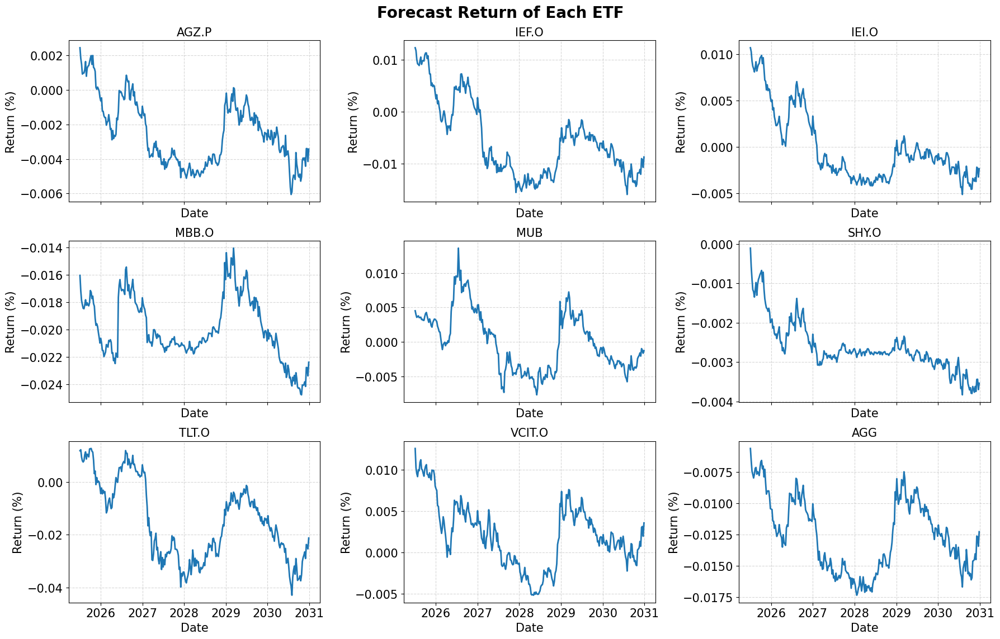

In [ ]:
import matplotlib.pyplot as plt

selected_assets = asset_columns
n_assets = len(selected_assets)
cols = 3
rows = (n_assets + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(18, 4 * rows), sharex=True)
axes = axes.flatten()

for i, asset in enumerate(selected_assets):
    ax = axes[i]
    ax.plot(expected_returns_forecast_pct.index, expected_returns_forecast_pct[asset], linewidth=2)
    ax.set_title(f"{asset}", fontsize=15)
    ax.set_xlabel("Date", fontsize=15)
    ax.set_ylabel("Return (%)", fontsize=15)
    ax.tick_params(axis="both", labelsize=15)
    ax.grid(True, linestyle="--", alpha=0.5)

# Hide unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout(rect=[0, 0.03, 1, 0.96])
fig.suptitle("Forecast Return of Each ETF", fontsize=20, weight="bold", y=0.98)
plt.show()


# Equilibrium Portfolio as 06/2025

In [ ]:
# reload the correct sheet only
dfs["ETFs Price.xlsx"] = pd.read_excel(
    "ETFs Price.xlsx",
    sheet_name="Net Assets",
)

# Drop the first rows
net_assets = dfs["ETFs Price.xlsx"].copy().iloc[1:].reset_index(drop=True)

# Original first column is the date string; rename it for clarity
net_assets = net_assets.rename(columns={"Unnamed: 0": "Date"})

# Convert the Date column to datetime and set as index
net_assets["Date"] = pd.to_datetime(net_assets["Date"])
net_assets = net_assets.set_index("Date")

# All values are strings right now; convert to numeric
net_assets =net_assets.apply(pd.to_numeric, errors="coerce")

display(net_assets)

,AGZ.P,IEI.O,SHY.O,IEF.O,MUB,MBB.O,TLT.O,VCIT.O,AGG
Date,,,,,,,,,
2010-01-01,257.8999,869.2000,7667.098,2553.4,1610.00,1758.90,2347.70,37.20,11234.0
2010-01-08,257.8999,869.2000,7667.098,2553.4,1610.00,1758.90,2347.70,37.20,11234.0
2010-01-15,257.8999,869.2000,7667.098,2553.4,1610.00,1758.90,2347.70,37.20,11234.0
2010-01-22,257.8999,869.2000,7667.098,2553.4,1610.00,1758.90,2347.70,37.20,11234.0
2010-01-29,260.3999,862.0999,7430.500,2646.0,1636.40,1795.20,2241.60,68.00,11341.2
...,...,...,...,...,...,...,...,...,...
2025-05-30,611.2107,15592.9600,24257.050,34938.2,38772.45,38227.93,50897.13,53150.84,124325.6
2025-06-06,611.2107,15592.9600,24257.050,34938.2,38772.45,38227.93,50897.13,53150.84,124325.6
2025-06-13,611.2107,15592.9600,24257.050,34938.2,38772.45,38227.93,50897.13,53150.84,124325.6


,Net Assets ($B),Weight (%)
AGZ.P,0.611211,0.238337
IEI.O,15.592960,6.080365
SHY.O,24.257050,9.458866
IEF.O,34.938200,13.623905
MBB.O,38.227930,14.906712
MUB,38.772450,15.119043
TLT.O,50.897130,19.846977
VCIT.O,53.150840,20.725795



📦 Total Net Assets of Portfolio: $256.45B
📦 Total Net Assets of Benchmark: $124.33B



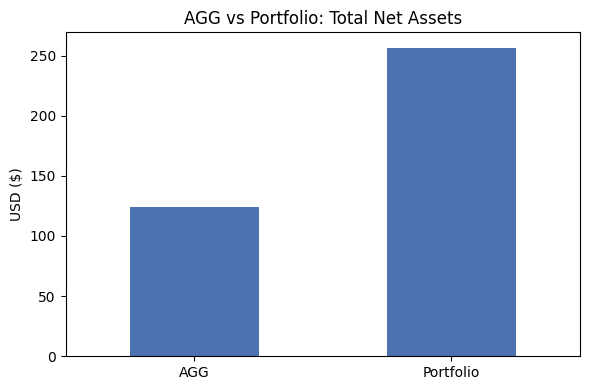

In [ ]:
# Net assets 06/2025
net_assets_2025 = net_assets.loc[: "2025-06-30"]

# Get the final asset data and convert to billions
latest_assets = net_assets_2025.iloc[-1].dropna() / 1000

# Separate benchmark figure
agg_assets = latest_assets.get("AGG", np.nan)
portfolio_assets = latest_assets.drop("AGG", errors="ignore")

# Create DataFrame and Compute Weights
assets_df = portfolio_assets.to_frame(name="Net Assets ($B)")
assets_df["Weight"] = assets_df["Net Assets ($B)"] / assets_df["Net Assets ($B)"].sum()
assets_df["Weight (%)"] = assets_df["Weight"] * 100
assets_df["Sector"] = assets_df.index.map(sectors)
assets_df["Color"] = assets_df["Sector"].map(sector_colors).fillna("#999999")  # fallback to grey

# Sort for Display
assets_df = assets_df.sort_values("Weight (%)")

display(assets_df[["Net Assets ($B)","Weight (%)"]])
print()

# Compare with portfolio
portfolio_total = assets_df["Net Assets ($B)"].sum()
print(f"📦 Total Net Assets of Portfolio: ${portfolio_total:.2f}B")
print(f"📦 Total Net Assets of Benchmark: ${agg_assets:.2f}B")
print()

# Visual comparison
comparison_df = pd.DataFrame({
    "AGG": [agg_assets],
    "Portfolio": [portfolio_total]
}, index=["Net Assets"])

comparison_df.T.plot.bar(
    legend=False,
    figsize=(6, 4),
    color=["#4C72B0", "#55A868"]
)

plt.title("AGG vs Portfolio: Total Net Assets")
plt.ylabel("USD ($)")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

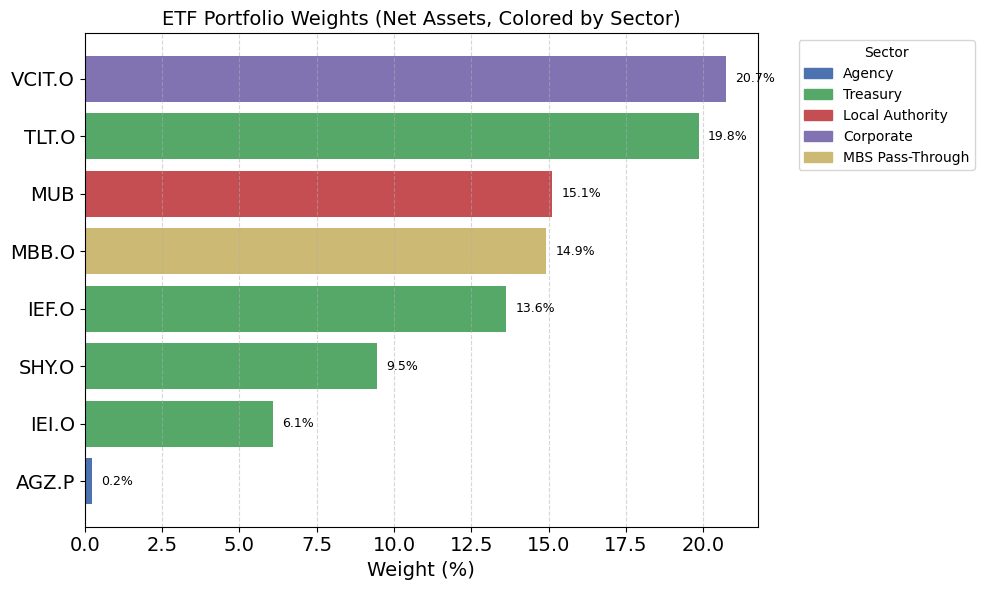

In [ ]:
# Plot Horizontal Bar Chart
plt.figure(figsize=(10, 6))
bars = plt.barh(
    assets_df.index,
    assets_df["Weight (%)"],
    color=assets_df["Color"]
)

for bar in bars:
    width = bar.get_width()
    plt.text(width + 0.3, bar.get_y() + bar.get_height() / 2,
             f"{width:.1f}%", va="center", fontsize=9)

plt.xlabel("Weight (%)", fontsize=14)
plt.title("ETF Portfolio Weights (Net Assets, Colored by Sector)", fontsize=14)
plt.grid(axis="x", linestyle="--", alpha=0.5)

# Increase axis tick label font sizes
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Add sector legend
handles = [
    plt.Rectangle((0,0),1,1, color=color)
    for sector, color in sector_colors.items()
]
labels = list(sector_colors.keys())
plt.legend(handles, labels, title="Sector", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

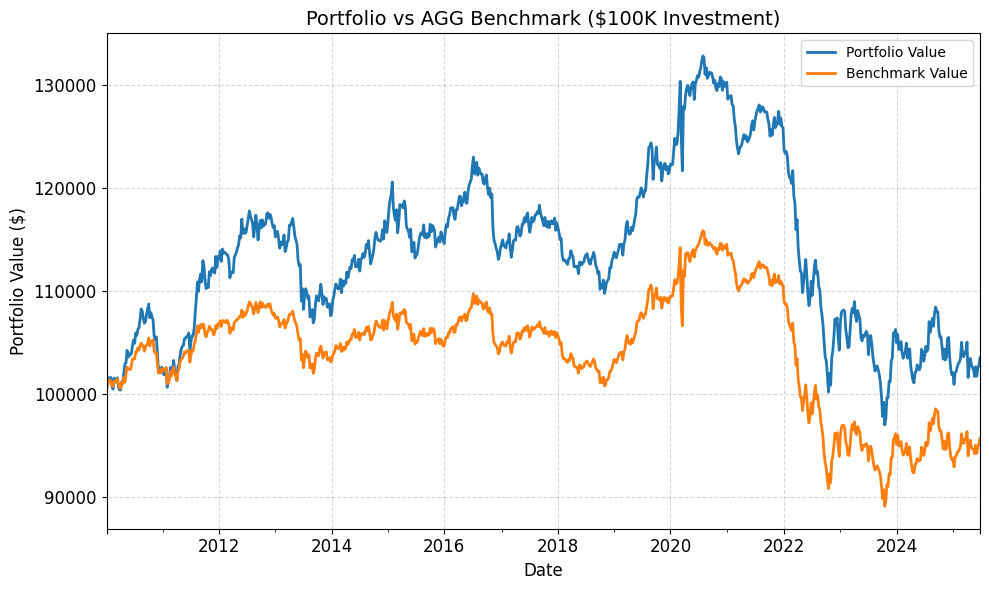

In [ ]:
# Compute portfolio returns using weights
weights = assets_df["Weight"]
portfolio_tickers = weights.index.tolist()  # ensure correct order

# Align returns
weekly_returns = weekly_prices.pct_change().dropna()
returns_10_25 = weekly_returns[portfolio_tickers + ["AGG"]]
portfolio_returns_10_25 = (returns_10_25[portfolio_tickers] * weights).sum(axis=1)

# Simulate Cumulative Growth of $100,000 Investment
initial_investment = 100000
portfolio_cum = (1 + portfolio_returns_10_25).cumprod() * initial_investment
agg_cum = (1 + returns_10_25["AGG"]).cumprod() * initial_investment

# Combine and Plot
performance_df = pd.DataFrame({
    "Portfolio Simple Return": portfolio_returns_10_25,
    "Benchmark Simple Return": returns_10_25["AGG"],
    "Portfolio Cum Return": (1 + portfolio_returns_10_25).cumprod(),
    "Benchmark Cum Return": (1 + returns_10_25["AGG"]).cumprod(),
    "Portfolio Value": portfolio_cum,
    "Benchmark Value" : agg_cum
})

plt.figure(figsize=(10, 6))
ax = plt.gca()
performance_df[["Portfolio Value", "Benchmark Value"]].plot(ax=plt.gca(), linewidth=2)
plt.title("Portfolio vs AGG Benchmark ($100K Investment)", fontsize=14)
plt.ylabel("Portfolio Value ($)", fontsize=12)
plt.xlabel("Date", fontsize=12)
ax.tick_params(axis="both", which="major", labelsize=12)
plt.grid(True, linestyle="--", alpha=0.5)
plt.legend()
plt.tight_layout()
plt.show()






# Black-Litterman Inputs

In [ ]:
# Calculate simple returns
portfolio_tickers = sorted(portfolio_tickers)
weekly_returns = weekly_returns[sorted(weekly_returns.columns)]
rets = weekly_returns[portfolio_tickers]

# Name the index and columns
rets.index.name  = "Date"
rets.columns.name = "Asset"

rets

Asset,AGZ.P,IEF.O,IEI.O,MBB.O,MUB,SHY.O,TLT.O,VCIT.O
Date,,,,,,,,
2010-01-08,0.004090,0.004063,0.003631,0.005378,0.002409,0.003373,-0.006675,0.012418
2010-01-15,0.002407,0.012253,0.007236,0.004880,0.002937,0.002285,0.020047,0.005144
2010-01-22,0.004155,0.006219,0.004221,0.001961,-0.000774,0.001918,0.010101,0.002624
2010-01-29,-0.000367,0.000993,0.001878,0.001678,-0.000775,0.000359,0.003370,-0.005889
2010-02-05,-0.000092,0.001544,0.002678,0.000000,0.001842,0.000957,-0.003575,0.000790
...,...,...,...,...,...,...,...,...
2025-05-30,0.002573,0.008532,0.005359,0.009039,0.000964,0.001940,0.020461,0.009886
2025-06-06,-0.006214,-0.011209,-0.009138,-0.009714,-0.006259,-0.005324,-0.010779,-0.008443
2025-06-13,0.003896,0.008341,0.005550,0.008610,0.006589,0.002433,0.011482,0.006541


In [ ]:
expected_returns_forecast_portfolio = expected_returns_forecast.copy().drop(columns=["Regime"], errors="ignore")

# Make sure the forecast panel has exactly the same columns order
expected_returns_forecast_portfolio = (
    expected_returns_forecast_portfolio
      .loc[:, rets.columns]
)

#  Combine real return 10_19 with hypothical return 20-25
combined_returns = pd.concat(
    [rets, expected_returns_forecast_portfolio],
    axis=0
).sort_index()


# Nice axis labels
combined_returns.index.name   = "Date"
combined_returns.columns.name = "Asset"

display(combined_returns)

Asset,AGZ.P,IEF.O,IEI.O,MBB.O,MUB,SHY.O,TLT.O,VCIT.O
Date,,,,,,,,
2010-01-08,0.004090,0.004063,0.003631,0.005378,0.002409,0.003373,-0.006675,0.012418
2010-01-15,0.002407,0.012253,0.007236,0.004880,0.002937,0.002285,0.020047,0.005144
2010-01-22,0.004155,0.006219,0.004221,0.001961,-0.000774,0.001918,0.010101,0.002624
2010-01-29,-0.000367,0.000993,0.001878,0.001678,-0.000775,0.000359,0.003370,-0.005889
2010-02-05,-0.000092,0.001544,0.002678,0.000000,0.001842,0.000957,-0.003575,0.000790
...,...,...,...,...,...,...,...,...
2030-11-29,-0.004422,-0.012061,-0.003718,-0.024160,-0.002062,-0.003747,-0.029017,0.000738
2030-12-06,-0.003399,-0.009030,-0.002172,-0.022773,-0.000976,-0.003440,-0.023694,0.003027
2030-12-13,-0.003404,-0.009251,-0.002269,-0.022790,-0.001216,-0.003437,-0.024108,0.003122


In [ ]:
# Expected Market Return
index_rets= weekly_returns['AGG']

expected_returns_forecast_index = expected_returns_forecast['AGG']

# Ensure the forecast series is a plain Series and shares the same name
expected_returns_forecast_index = (
    expected_returns_forecast["AGG"]
      .rename(index_rets.name)
)

# Concatenate realised (2010-19) with forecast (2020-25) and sort
index_returns_extended = (
    pd.concat([index_rets, expected_returns_forecast_index])
      .sort_index()                       # chronological order
)

# Nice axis label
index_returns_extended.index.name = "Date"

index_returns_extended

,AGG
Date,
2010-01-08,0.004555
2010-01-15,0.005841
2010-01-22,0.001865
2010-01-29,0.001819
2010-02-05,-0.002389
...,...
2030-11-29,-0.014496
2030-12-06,-0.012621
2030-12-13,-0.012673


In [ ]:
# Bench mark weights
w_mkt = assets_df.loc[portfolio_tickers, "Weight"]

w_mkt

,Weight
AGZ.P,0.002383
IEF.O,0.136239
IEI.O,0.060804
MBB.O,0.149067
MUB,0.151190
SHY.O,0.094589
TLT.O,0.198470
VCIT.O,0.207258


In [ ]:
# Risk-free rate
rf = dfs["United States 3-Month Bond Yield.xlsx"].copy()

rf["Date"] = pd.to_datetime(rf["Date"])

rf_2025 = rf[rf["Date"] <= "2025-06-30"].set_index("Date").sort_index() # Restrict to 06/2025

annual_rf_2025 = rf_2025["Price"].iloc[-1] / 100

weekly_rf_2025 = (1 + annual_rf_2025)**(1/52) - 1

#  Output
print("\nAnnual 06/2025 Risk-free rate:")
print(annual_rf_2025)
print("\nWeekly 06/2025 Risk-free rate:")
print(weekly_rf_2025)


Annual 06/2025 Risk-free rate:
0.04364

Weekly 06/2025 Risk-free rate:
0.0008217721315320059


In [ ]:
def run_bl_model(window_length, conf=1/2):
    from datetime import timedelta
    from numpy.linalg import inv

    global rolling_sigma, rolling_index_returns_series, rolling_lambda
    global mu_bl_table, bl_weights_by_date, bl_returns_net_series

    # ───────────────────────────────────────────────────
    # Build rolling covariance matrices (Σ_t)
    # ───────────────────────────────────────────────────
    one_week = timedelta(weeks=1)
    forecast_start = pd.Timestamp("2025-07-04")
    forecast_end   = pd.Timestamp("2030-12-31")
    forecast_dates = pd.date_range(start=forecast_start, end=forecast_end, freq="W-FRI")

    rolling_sigma = {}
    for forecast_date in forecast_dates:
        end_date   = forecast_date - one_week
        start_date = end_date - timedelta(weeks=window_length - 1)


        sigma_source = combined_returns.loc[start_date:end_date, portfolio_tickers]

        # if the rolling slice is too short, skip this date
        if len(sigma_source) < window_length:
            print(f"Skipping {forecast_date.date()} — insufficient data in rolling window.")
            continue

        try:
            sigma_window = (
                sigma_source.cov()
                .loc[portfolio_tickers, portfolio_tickers]
            )

            rolling_sigma[forecast_date] = sigma_window
        except Exception as e:
            print(f"Failed Sigma at {forecast_date.date()}: {e}")
            continue

    if len(rolling_sigma) == 0:
        print("⚠️ No valid Sigma matrices computed. Skipping this window length.")
        return {"window_length": window_length, "sharpe_ratio": np.nan, "bl_cum_return": np.nan}

    # ──────────────────────────────────────────────────────
    # Rolling market mean (AGG) and lambda (risk aversion)
    # ──────────────────────────────────────────────────────
    rolling_index_returns = {}
    rolling_market_var    = {}

    for forecast_date in forecast_dates:
        end_date   = forecast_date - one_week
        start_date = end_date - timedelta(weeks=window_length - 1)

        # rolling slice of the AGG series
        idx_slice = index_returns_extended.loc[start_date:end_date].dropna()

        if len(idx_slice) < window_length:
            # not enough lookback yet for this window_length
            continue

        # rolling mean and variance (sample variance)
        rolling_index_returns[forecast_date] = idx_slice.mean()
        rolling_market_var[forecast_date]    = idx_slice.var(ddof=1)

    # Convert to series
    rolling_index_returns_series = (
        pd.Series(rolling_index_returns)
          .sort_index()
          .rename("Rolling AGG Mean")
    )

    rolling_market_var_series = (
        pd.Series(rolling_market_var)
          .sort_index()
          .rename("Market Variance")
    )

    # Excess return & lambda
    rolling_excess_mkt = (rolling_index_returns_series - weekly_rf_2025).rename("Excess Market Return")
    common_idx = rolling_excess_mkt.index.intersection(rolling_market_var_series.index)

    rolling_lambda = (
        rolling_excess_mkt.loc[common_idx] / rolling_market_var_series.loc[common_idx]
    ).rename("Lambda")

    if len(rolling_lambda) == 0:
        print("⚠️ No valid rolling lambda values. Skipping this window length.")
        return {"window_length": window_length, "sharpe_ratio": np.nan, "bl_cum_return": np.nan}

    # ──────────────────────────────────────────────────────
    # Construct P, Q, Omega, π, μ_BL, Weights
    # ──────────────────────────────────────────────────────
    tau = 1
    n_assets = len(portfolio_tickers)
    absolute_view_definitions_by_date = {}

    for forecast_date, row in expected_returns_forecast_portfolio.iterrows():
        views_for_date = []
        for asset_ticker, expected_return in row.items():
            views_for_date.append({
                "assets+" : [asset_ticker],
                "assets-" : [],
                "Q"       : float(expected_return)
            })
        absolute_view_definitions_by_date[forecast_date] = views_for_date

    PQ_matrices_by_date = {}
    for forecast_date, views in absolute_view_definitions_by_date.items():
        number_of_views = len(views)
        link_matrix_P   = np.zeros((number_of_views, n_assets))
        view_returns_Q  = np.zeros((number_of_views, 1))

        for row_idx, view in enumerate(views):
            view_returns_Q[row_idx, 0] = view["Q"]

            n_plus = len(view["assets+"]) or 1  # avoid div by 0
            n_minus = len(view["assets-"]) or 1

            for long_asset in view["assets+"]:
                link_matrix_P[row_idx, portfolio_tickers.index(long_asset)] += 1.0 / n_plus

            for short_asset in view["assets-"]:
                link_matrix_P[row_idx, portfolio_tickers.index(short_asset)] -= 1.0 / n_minus


        view_labels = [f"View {i+1}" for i in range(number_of_views)]
        P_df = pd.DataFrame(link_matrix_P, index=view_labels, columns=portfolio_tickers)
        Q_df = pd.DataFrame(view_returns_Q, index=view_labels, columns=["Q Values"])

        PQ_matrices_by_date[forecast_date] = {"P": P_df, "Q": Q_df}

    omega_matrices_by_date = {}
    for forecast_date, pq_dict in PQ_matrices_by_date.items():
        if forecast_date not in rolling_sigma:
            continue
        Sigma_sub = rolling_sigma[forecast_date].loc[portfolio_tickers, portfolio_tickers].values
        P = pq_dict["P"].values
        diag_block = np.diag(P @ Sigma_sub @ P.T)
        Omega = np.diag((1/conf - 1) * diag_block)
        view_idx = pq_dict["P"].index
        omega_matrices_by_date[forecast_date] = pd.DataFrame(Omega, index=view_idx, columns=view_idx)

    mu_bl_by_date = {}
    pi_by_date    = {}
    w_vec = w_mkt.values.reshape(-1, 1)

    for forecast_date in sorted(PQ_matrices_by_date):
        if forecast_date not in rolling_sigma or forecast_date not in rolling_lambda:
            continue

        Sigma_sub_t = rolling_sigma[forecast_date].loc[portfolio_tickers, portfolio_tickers].values
        lambda_t = rolling_lambda.loc[forecast_date]
        pi_vector_t = (lambda_t * Sigma_sub_t) @ w_vec

        # π_t  (implied equilibrium return)
        pi_vector_t = (lambda_t * Sigma_sub_t) @ w_vec         # shape (n_assets, 1)
        pi_by_date[forecast_date] = pd.Series(pi_vector_t.flatten(),
                                              index=portfolio_tickers,
                                              name="π_t")



        # weekly P, Q, Ω
        P_matrix = PQ_matrices_by_date[forecast_date]["P"].values
        Q_vector = PQ_matrices_by_date[forecast_date]["Q"].values
        Omega = omega_matrices_by_date[forecast_date].values

        try:
            tauSigma_inv = inv(tau * Sigma_sub_t)
            Omega_inv = inv(Omega)
            mu_bl = inv(tauSigma_inv + P_matrix.T @ Omega_inv @ P_matrix) @ (
                        tauSigma_inv @ pi_vector_t + P_matrix.T @ Omega_inv @ Q_vector
                    )
        except Exception as e:
            print(f"μ_BL failed at {forecast_date.date()}: {e}")
            continue

        mu_bl_by_date[forecast_date] = pd.Series(mu_bl.flatten(), index=portfolio_tickers)

    pi_table = pd.DataFrame(pi_by_date).T.sort_index()
    mu_bl_table = pd.DataFrame(mu_bl_by_date).T.sort_index()

    # ────────────────────────────────────────────────
    # Portfolio Weights (Markowitz long-only)
    # ────────────────────────────────────────────────
    bl_weights_by_date = {}

    for forecast_date in sorted(mu_bl_table.index):
        try:
            Sigma_sub = rolling_sigma[forecast_date].loc[portfolio_tickers, portfolio_tickers].values
            P_matrix = PQ_matrices_by_date[forecast_date]["P"].values
            Omega = omega_matrices_by_date[forecast_date].values
            mu_bl = mu_bl_table.loc[forecast_date]
            lambda_t = float(rolling_lambda.loc[forecast_date])

            middle_inv = inv(P_matrix @ (tau * Sigma_sub) @ P_matrix.T + Omega)
            posterior_cov = Sigma_sub + (tau * Sigma_sub) @ P_matrix.T @ middle_inv @ P_matrix @ (tau * Sigma_sub)

            A = lambda_t * Sigma_sub
            b = mu_bl.values
            raw_weights = np.linalg.solve(A, b)

            raw_weights = np.clip(raw_weights, 0, None)
            norm_weights = raw_weights / raw_weights.sum()

            bl_weights_by_date[forecast_date] = pd.Series(norm_weights, index=mu_bl.index)
        except Exception as e:
            print(f"Weights failed at {forecast_date.date()}: {e}")
            continue

    bl_weights_panel = pd.DataFrame(bl_weights_by_date).T.sort_index()

    if bl_weights_panel.empty:
        print("⚠️ No BL weights generated.")
        return {"window_length": window_length, "sharpe_ratio": np.nan, "bl_cum_return": np.nan}

    return {
            "window_length": window_length,
            "rolling_sigma":           rolling_sigma,
            "rolling_index_returns":   rolling_index_returns_series,
            "w_vec":                   w_vec,
            "rolling_market_var":      rolling_market_var_series,
            "rolling_lambda":          rolling_lambda,
            "pi_table":                pi_table,
            "mu_bl_table":             mu_bl_table,
            "bl_weights_panel":        bl_weights_panel,
            "PQ_matrices_by_date":     PQ_matrices_by_date,
            "omega_matrices_by_date":  omega_matrices_by_date,
    }

In [ ]:
# Run function using optimal window defined by BL2020
best_window_length = 79
print(f"\n🔁  Re-running BL model with selected window ({best_window_length})...")
best_bl_output = run_bl_model(best_window_length)


🔁  Re-running BL model with selected window (79)...


# Black-Litterman Optimize

In [ ]:
rolling_sigma = best_bl_output["rolling_sigma"]

# Combine into MultiIndex DataFrame
rolling_sigma_df = (
    pd.concat(rolling_sigma, names=["Date"])
      .sort_index()
)

display(rolling_sigma_df)

Asset                     AGZ.P         IEF.O         IEI.O         MBB.O  \
Date       Asset                                                            
2025-07-04 AGZ.P   2.025507e-05  4.255576e-05  2.713765e-05  3.644262e-05   
           IEF.O   4.255576e-05  9.696614e-05  6.023588e-05  8.150907e-05   
           IEI.O   2.713765e-05  6.023588e-05  3.879529e-05  5.077589e-05   
           MBB.O   3.644262e-05  8.150907e-05  5.077589e-05  7.288752e-05   
           MUB     2.195316e-05  5.021413e-05  3.040116e-05  4.275859e-05   
...                         ...           ...           ...           ...   
2030-12-27 MBB.O   3.053317e-06  7.996616e-06  2.917140e-06  5.968908e-06   
           MUB     2.490419e-06  6.358783e-06  2.183213e-06  4.597380e-06   
           SHY.O   3.708050e-07  9.776684e-07  3.996537e-07  6.864538e-07   
           TLT.O   1.340595e-05  3.485154e-05  1.259466e-05  2.433894e-05   
           VCIT.O  2.179101e-06  5.543275e-06  2.020082e-06  3.881538e-06   

Asset                       MUB         SHY.O     TLT.O        VCIT.O  
Date       Asset                                                       
2025-07-04 AGZ.P   2.195316e-05  1.043165e-05  0.000079  3.385985e-05  
           IEF.O   5.021413e-05  2.117776e-05  0.000187  7.533957e-05  
           IEI.O   3.040116e-05  1.465720e-05  0.000110  4.711856e-05  
           MBB.O   4.275859e-05  1.871813e-05  0.000157  6.684859e-05  
           MUB     3.850677e-05  9.813130e-06  0.000099  4.129806e-05  
...                         ...           ...       ...           ...  
2030-12-27 MBB.O   4.597380e-06  6.864538e-07  0.000024  3.881538e-06  
           MUB     4.530486e-06  4.835567e-07  0.000020  3.591810e-06  
           SHY.O   4.835567e-07  1.008378e-07  0.000003  4.531273e-07  
           TLT.O   1.987847e-05  2.788896e-06  0.000108  1.669123e-05  
           VCIT.O  3.591810e-06  4.531273e-07  0.000017  3.297302e-06  

[2296 rows x 8 columns]

In [ ]:
w_vec                     = best_bl_output["w_vec"]
rolling_market_var        = best_bl_output["rolling_market_var"]
rolling_lambda            = best_bl_output["rolling_lambda"]

rolling_market_var_series = (
    pd.Series(rolling_market_var)
      .sort_index()
      .rename("Market Variance")
)

# Result
print('\nWeight Vector:')
display(w_vec)
print('\nMarket Variance:')
display(rolling_market_var_series)
print('\nLambda Risk Aversion:')
display(rolling_lambda)


Weight Vector:


array([[0.00238337],
       [0.13623905],
       [0.06080365],
       [0.14906712],
       [0.15119043],
       [0.09458866],
       [0.19846977],
       [0.20725795]])


Market Variance:


,Market Variance
2025-07-04,0.000061
2025-07-11,0.000061
2025-07-18,0.000061
2025-07-25,0.000060
2025-08-01,0.000059
...,...
2030-11-29,0.000004
2030-12-06,0.000004
2030-12-13,0.000004
2030-12-20,0.000004



Lambda Risk Aversion:


,Lambda
2025-07-04,-12.986909
2025-07-11,-14.990120
2025-07-18,-14.375654
2025-07-25,-17.976476
2025-08-01,-17.522799
...,...
2030-11-29,-3210.583240
2030-12-06,-3280.145914
2030-12-13,-3370.955738
2030-12-20,-3553.406182


In [ ]:
PQ_matrices_by_date = best_bl_output["PQ_matrices_by_date"]

# BUILD ONE MASTER Q-TABLE  (rows = forecast weeks, cols = assets)
q_table = (
    pd.concat(
        [
            # grab the Q column (Series)
            pq_dict["Q"]["Q Values"]
              # rename the row labels "View 1", … → the real tickers
              .rename(index=dict(zip(pq_dict["Q"].index, portfolio_tickers)))
              # turn it into a 1-row DataFrame
              .to_frame().T
              # tag the row with its forecast date
              .assign(Forecast_Date=forecast_date)
              .set_index("Forecast_Date")
            for forecast_date, pq_dict in PQ_matrices_by_date.items()
        ]
    )
    .sort_index()                     # chronological order
)

q_table.index.name   = "Forecast Week"
q_table.columns.name = "Asset"

display(q_table)

p_table = (
    pd.concat(
        {forecast_date: pq_dict["P"]                  # keeps original P rows
         for forecast_date, pq_dict in PQ_matrices_by_date.items()},
        names=["Forecast Week", "View"]               # name the new index levels
    )
    .sort_index()                                     # chronological order
)

# show fractional strings instead of 0/1 floats
p_table_pretty = p_table.applymap(
    lambda x: "" if x == 0 else "1"                   # identity views → 1 or blank
)

display(p_table)

Asset,AGZ.P,IEF.O,IEI.O,MBB.O,MUB,SHY.O,TLT.O,VCIT.O
Forecast Week,,,,,,,,
2025-07-04,0.002436,0.012357,0.010701,-0.016052,0.004510,-0.000105,0.011858,0.012548
2025-07-11,0.001823,0.011800,0.010274,-0.017171,0.003962,-0.000573,0.012233,0.010226
2025-07-18,0.001489,0.010109,0.009282,-0.017881,0.003554,-0.000892,0.009447,0.009512
2025-07-25,0.000911,0.009255,0.008707,-0.018187,0.003663,-0.001161,0.008041,0.009147
2025-08-01,0.000962,0.009128,0.008458,-0.018453,0.003772,-0.001213,0.007571,0.009969
...,...,...,...,...,...,...,...,...
2030-11-29,-0.004422,-0.012061,-0.003718,-0.024160,-0.002062,-0.003747,-0.029017,0.000738
2030-12-06,-0.003399,-0.009030,-0.002172,-0.022773,-0.000976,-0.003440,-0.023694,0.003027
2030-12-13,-0.003404,-0.009251,-0.002269,-0.022790,-0.001216,-0.003437,-0.024108,0.003122


/tmp/ipython-input-3553695698.py:37: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  p_table_pretty = p_table.applymap(


AGZ.P  IEF.O  IEI.O  MBB.O  MUB  SHY.O  TLT.O  VCIT.O
Forecast Week View                                                         
2025-07-04    View 1    1.0    0.0    0.0    0.0  0.0    0.0    0.0     0.0
              View 2    0.0    1.0    0.0    0.0  0.0    0.0    0.0     0.0
              View 3    0.0    0.0    1.0    0.0  0.0    0.0    0.0     0.0
              View 4    0.0    0.0    0.0    1.0  0.0    0.0    0.0     0.0
              View 5    0.0    0.0    0.0    0.0  1.0    0.0    0.0     0.0
...                     ...    ...    ...    ...  ...    ...    ...     ...
2030-12-27    View 4    0.0    0.0    0.0    1.0  0.0    0.0    0.0     0.0
              View 5    0.0    0.0    0.0    0.0  1.0    0.0    0.0     0.0
              View 6    0.0    0.0    0.0    0.0  0.0    1.0    0.0     0.0
              View 7    0.0    0.0    0.0    0.0  0.0    0.0    1.0     0.0
              View 8    0.0    0.0    0.0    0.0  0.0    0.0    0.0     1.0

[2296 rows x 8 columns]

In [ ]:
omega_matrices_by_date = best_bl_output["omega_matrices_by_date"]

# big block for inspection
rolling_omega_df = pd.concat(omega_matrices_by_date, names=["Date"]).sort_index()

print("Full Omega Matrix Block:")
display(rolling_omega_df)

Full Omega Matrix Block:


View 1    View 2    View 3    View 4    View 5  \
Date                                                                 
2025-07-04 View 1  0.00002  0.000000  0.000000  0.000000  0.000000   
           View 2  0.00000  0.000097  0.000000  0.000000  0.000000   
           View 3  0.00000  0.000000  0.000039  0.000000  0.000000   
           View 4  0.00000  0.000000  0.000000  0.000073  0.000000   
           View 5  0.00000  0.000000  0.000000  0.000000  0.000039   
...                    ...       ...       ...       ...       ...   
2030-12-27 View 4  0.00000  0.000000  0.000000  0.000006  0.000000   
           View 5  0.00000  0.000000  0.000000  0.000000  0.000005   
           View 6  0.00000  0.000000  0.000000  0.000000  0.000000   
           View 7  0.00000  0.000000  0.000000  0.000000  0.000000   
           View 8  0.00000  0.000000  0.000000  0.000000  0.000000   

                         View 6    View 7    View 8  
Date                                                 
2025-07-04 View 1  0.000000e+00  0.000000  0.000000  
           View 2  0.000000e+00  0.000000  0.000000  
           View 3  0.000000e+00  0.000000  0.000000  
           View 4  0.000000e+00  0.000000  0.000000  
           View 5  0.000000e+00  0.000000  0.000000  
...                         ...       ...       ...  
2030-12-27 View 4  0.000000e+00  0.000000  0.000000  
           View 5  0.000000e+00  0.000000  0.000000  
           View 6  1.008378e-07  0.000000  0.000000  
           View 7  0.000000e+00  0.000108  0.000000  
           View 8  0.000000e+00  0.000000  0.000003  

[2296 rows x 8 columns]

In [ ]:
# Tidy result tables
pi_table = best_bl_output["pi_table"]
mu_bl_table = best_bl_output["mu_bl_table"]

print("\nRolling Priors Returns π_t (first few rows):")
display(pi_table.head().style.format("{:+.6f}"))

print("\nRolling Posterior Return Vector μ_BL(first few rows):")
display(mu_bl_table.head().style.format("{:+.6f}"))


Rolling Priors Returns π_t (first few rows):


,AGZ.P,IEF.O,IEI.O,MBB.O,MUB,SHY.O,TLT.O,VCIT.O
2025-07-04 00:00:00,-0.000519,-0.001187,-0.000724,-0.001019,-0.000650,-0.000249,-0.002361,-0.000949
2025-07-11 00:00:00,-0.000600,-0.001382,-0.000846,-0.001155,-0.000755,-0.000287,-0.002737,-0.001106
2025-07-18 00:00:00,-0.000567,-0.001311,-0.000805,-0.001067,-0.000721,-0.000270,-0.002580,-0.001037
2025-07-25 00:00:00,-0.000699,-0.001631,-0.000999,-0.001299,-0.000896,-0.000327,-0.003229,-0.001283
2025-08-01 00:00:00,-0.000663,-0.001553,-0.000950,-0.001215,-0.000845,-0.000306,-0.003077,-0.001220



Rolling Posterior Return Vector μ_BL(first few rows):


,AGZ.P,IEF.O,IEI.O,MBB.O,MUB,SHY.O,TLT.O,VCIT.O
2025-07-04 00:00:00,+0.002188,+0.005237,+0.003258,+0.003571,+0.003256,+0.000926,+0.009510,+0.004093
2025-07-11 00:00:00,+0.001710,+0.004957,+0.003297,+0.000734,+0.002875,+0.000499,+0.008329,+0.003937
2025-07-18 00:00:00,+0.001264,+0.004507,+0.003207,-0.001557,+0.002524,+0.000169,+0.006830,+0.003653
2025-07-25 00:00:00,+0.000958,+0.004241,+0.003180,-0.003204,+0.002411,-0.000096,+0.005907,+0.003583
2025-08-01 00:00:00,+0.000961,+0.004626,+0.003560,-0.004191,+0.002600,-0.000179,+0.006203,+0.004059


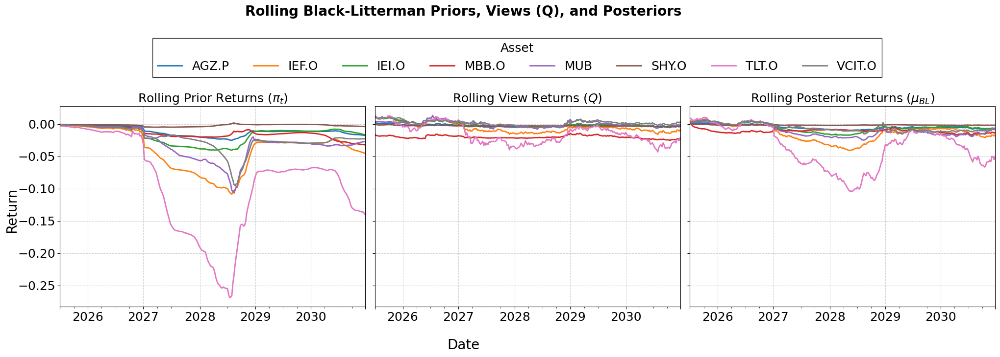

In [ ]:
import matplotlib.pyplot as plt

# Select assets to plot (all columns)
asset_list = pi_table.columns

# Remove index name to prevent automatic axis label
pi_table.index.name = None
mu_bl_table.index.name = None
q_table.index.name = None

# Find global y-limits across all three tables
ymin = min(
    pi_table[asset_list].min().min(),
    mu_bl_table[asset_list].min().min(),
    q_table[asset_list].min().min()
)
ymax = max(
    pi_table[asset_list].max().max(),
    mu_bl_table[asset_list].max().max(),
    q_table[asset_list].max().max()
)
ymargin = 0.05 * (ymax - ymin)
ymin -= ymargin
ymax += ymargin

fig, axes = plt.subplots(1, 3, figsize=(22, 6), sharex=True, sharey=True)  # <-- sharey here!

#  π_t (priors)
pi_table[asset_list].plot(ax=axes[0], linewidth=2)
axes[0].set_title("Rolling Prior Returns ($\\pi_t$)", fontsize=18)
axes[0].grid(True, linestyle="--", alpha=0.6)
axes[0].legend().remove()
axes[0].tick_params(axis="both", labelsize=18)
axes[0].set_ylim(ymin, ymax)

# Q (views)
q_table[asset_list].plot(ax=axes[1], linewidth=2)
axes[1].set_title("Rolling View Returns ($Q$)", fontsize=18)
axes[1].grid(True, linestyle="--", alpha=0.6)
axes[1].legend().remove()
axes[1].tick_params(axis="both", labelsize=18)
axes[1].set_ylim(ymin, ymax)

# μ_BL (posteriors)
mu_bl_table[asset_list].plot(ax=axes[2], linewidth=2)
axes[2].set_title("Rolling Posterior Returns ($\\mu_{BL}$)", fontsize=18)
axes[2].grid(True, linestyle="--", alpha=0.6)
axes[2].legend().remove()
axes[2].tick_params(axis="both", labelsize=18)
axes[2].set_ylim(ymin, ymax)

#  Shared y-label for all subplots
fig.text(0.5, 0.04, "Date", ha="center", va="center", fontsize=20)
fig.text(0.075, 0.5, "Return", va="center", rotation="vertical", fontsize=20)


#  Shared legend at the top center
handles, labels = axes[0].get_legend_handles_labels()
leg = fig.legend(
    handles, labels,
    loc="upper center",
    bbox_to_anchor=(0.55, 1.15),    # Centered horizontally, above the charts
    ncol=len(labels),              # All assets in one row
    fontsize=18,
    title="Asset",
    title_fontsize=18,
    frameon=True,
    borderaxespad=1.5,
    fancybox=False
)
frame = leg.get_frame()
frame.set_edgecolor("black")
frame.set_linewidth(1)

fig.suptitle(
    "Rolling Black-Litterman Priors, Views (Q), and Posteriors",
    fontsize=20,
    weight="bold",
    y=1.20
)

plt.tight_layout(rect=[0.08, 0.09, 1, 1]) # adjust rect to allow y-label
plt.show()

,AGZ.P,IEF.O,IEI.O,MBB.O,MUB,SHY.O,TLT.O,VCIT.O
2025-07-04,0.000000,0.0,0.0,0.645731,0.0,0.354269,0.000000,0.0
2025-07-11,0.000000,0.0,0.0,0.605767,0.0,0.394233,0.000000,0.0
2025-07-18,0.000000,0.0,0.0,0.578687,0.0,0.421313,0.000000,0.0
2025-07-25,0.006827,0.0,0.0,0.533285,0.0,0.459888,0.000000,0.0
2025-08-01,0.000000,0.0,0.0,0.520379,0.0,0.479621,0.000000,0.0
...,...,...,...,...,...,...,...,...
2030-11-29,0.000000,0.0,0.0,0.085647,0.0,0.897145,0.017209,0.0
2030-12-06,0.000000,0.0,0.0,0.095478,0.0,0.884474,0.020048,0.0
2030-12-13,0.000000,0.0,0.0,0.098414,0.0,0.880506,0.021081,0.0
2030-12-20,0.000000,0.0,0.0,0.094641,0.0,0.885172,0.020187,0.0


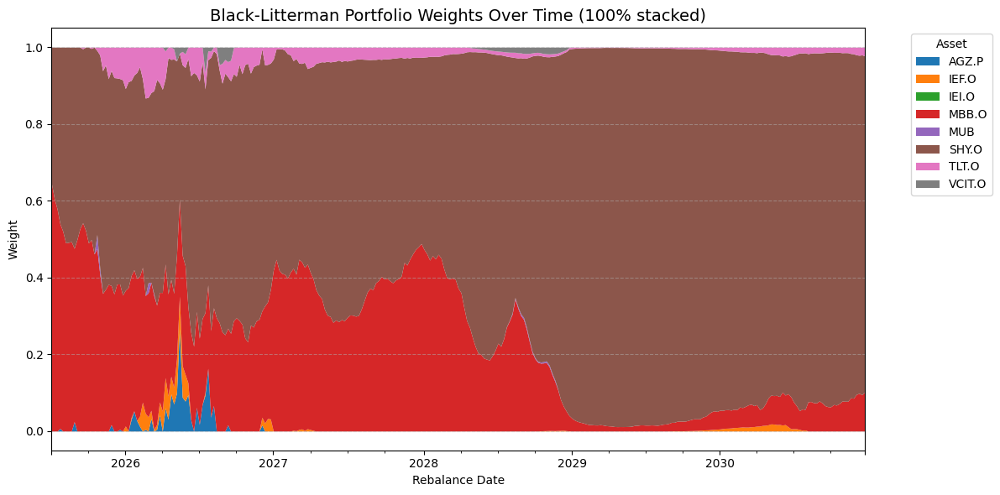

In [ ]:
bl_weights_panel = best_bl_output["bl_weights_panel"]
display(bl_weights_panel.round(6))

#  Stacked Area Plot of Weights
weights_normalised = bl_weights_panel.div(bl_weights_panel.sum(axis=1), axis=0)

fig, ax = plt.subplots(figsize=(12, 6))
weights_normalised.plot.area(ax=ax, linewidth=0)

ax.set_title("Black-Litterman Portfolio Weights Over Time (100% stacked)", fontsize=14)
ax.set_ylabel("Weight")
ax.set_xlabel("Rebalance Date")
ax.grid(True, axis='y', linestyle="--", alpha=0.5)
ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left", ncol=1, title="Asset")

plt.tight_layout()
plt.show()

# Confidence Tilt

Running model for confidence level: 0.05
Running model for confidence level: 0.15
Running model for confidence level: 0.25
Running model for confidence level: 0.35
Running model for confidence level: 0.45
Running model for confidence level: 0.50
Running model for confidence level: 0.55
Running model for confidence level: 0.65
Running model for confidence level: 0.75
Running model for confidence level: 0.85
Running model for confidence level: 0.95


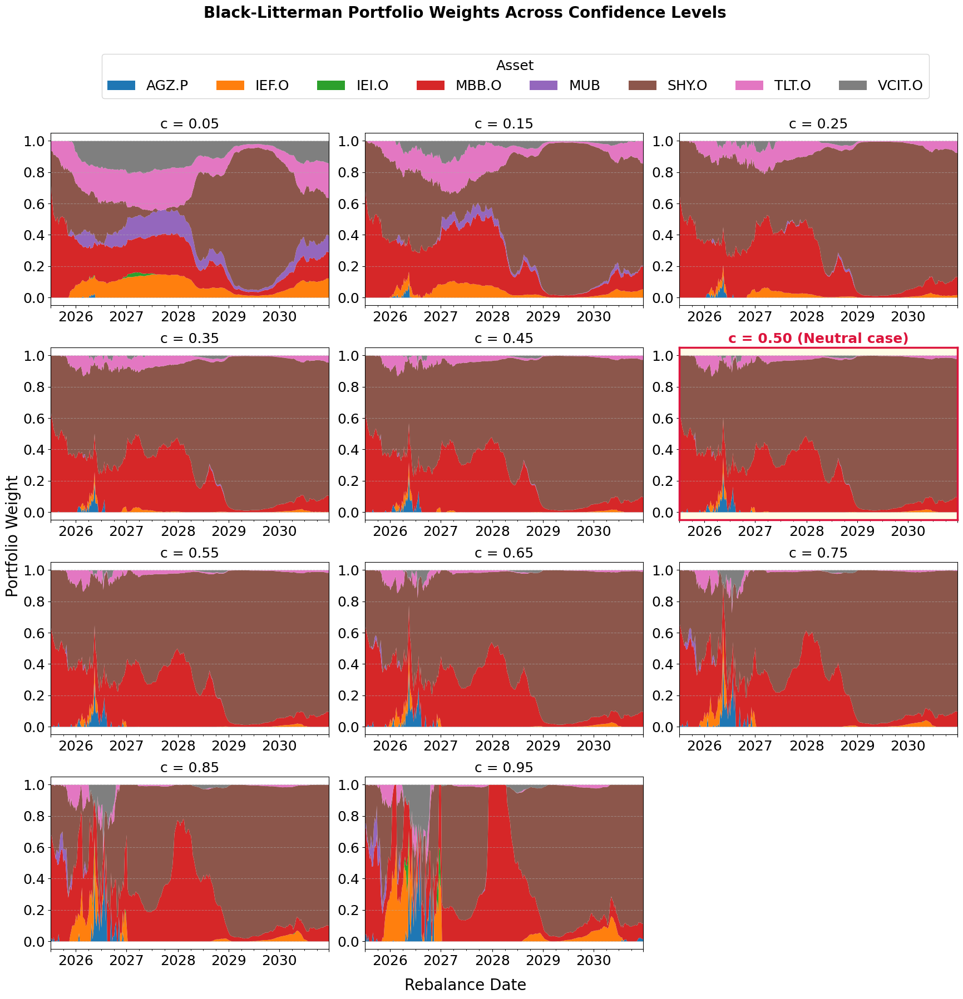

In [ ]:
import math

c_values = np.linspace(0.05, 0.95, 10)
if 0.5 not in np.round(c_values, 4):
    c_values = np.append(c_values, 0.5)
c_values = np.sort(c_values)
window_length = best_window_length  # or set manually

c_results = []

for c in c_values:
    print(f"Running model for confidence level: {c:.2f}")
    result = run_bl_model(window_length=window_length, conf=c)
    result["confidence"] = c
    c_results.append(result)

# Collect into DataFrame
c_results_df = pd.DataFrame(c_results)

# Number of subplots
num_c = len(c_results)
cols = 3
rows = math.ceil(num_c / cols)

fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 4.5 * rows), sharex=False, sharey=False)

# Flatten axes array
axes = axes.flatten()

# Store one legend handle to create shared legend later
handles, labels = None, None

for i, result in enumerate(c_results):
    c = result["confidence"]
    bl_weights_panel = result["bl_weights_panel"]

    # Normalize to 100% allocation
    weights_normalised = bl_weights_panel.div(bl_weights_panel.sum(axis=1), axis=0)

    ax = axes[i]
    plot = weights_normalised.plot.area(ax=ax, linewidth=0)

    # Highlight the c=0.5 plot
    if np.isclose(c, 0.5, atol=1e-3):
        ax.set_facecolor("#fffde7")  # Light yellow
        ax.set_title(f"c = {c:.2f} (Neutral case)", fontsize=18, color="crimson", weight="bold")
        # Thicker red border
        for spine in ax.spines.values():
            spine.set_edgecolor("crimson")
            spine.set_linewidth(2.5)
    else:
        ax.set_title(f"c = {c:.2f}", fontsize=18)

    # Keep ticks, remove individual axis titles
    ax.tick_params(axis="both", which="major", labelsize=18)
    ax.grid(True, axis='y', linestyle="--", alpha=0.5)

    # Save legend handles just once
    if handles is None or labels is None:
        handles, labels = ax.get_legend_handles_labels()

    ax.get_legend().remove()  # remove individual legend

# Remove unused axes if any
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Add shared axis titles (but keep ticks on each subplot)
fig.text(0.5, 0.046, "Rebalance Date", ha="center", fontsize=20)
fig.text(0.041, 0.5, "Portfolio Weight", va="center", rotation="vertical", fontsize=20)

# Add a shared legend below all subplots
fig.legend(
    handles,
    labels,
    title="Asset",
    loc="lower center",
    ncol=len(labels),
    fontsize=18,
    title_fontsize=18,
    bbox_to_anchor=(0.55, 0.93)
)

fig.suptitle("Black-Litterman Portfolio Weights Across Confidence Levels", fontsize=20, weight='bold', y=1.03)

plt.tight_layout(rect=[0.05, 0.06, 1, 0.95])  # adjusted left margin for y-label
plt.show()